# Comparaison Multi-Modèle - Détection d'Anomalies Profils Océanographiques
### - Partie 1 : Deep Learning (Transformer, CNN, Autoencoder+LightGBM)
### - Partie 2 : Deep Learning + Machine Learning (RF, Isolation Forest, XGBoost, LightGBM)


# PARTIE 1 — Comparaison Deep Learning (Transformer / CNN / Autoencoder+LightGBM)

## 1. Setup et Imports

In [1]:
import os
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
from sklearn.metrics import (confusion_matrix, classification_report, roc_curve, auc, roc_auc_score,
                             precision_recall_curve, average_precision_score, f1_score,
                             precision_score, recall_score, accuracy_score)
import warnings
warnings.filterwarnings('ignore')

plt.rcParams['font.size'] = 11
plt.rcParams['axes.labelsize'] = 11
plt.rcParams['axes.titlesize'] = 13
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
plt.rcParams['legend.fontsize'] = 10
plt.rcParams['figure.titlesize'] = 14

YEARS = "2018_2022"

# Couleurs par océan (partagées dans tout le notebook)
OCEANS = {
    "atlantic": "#1f77b4",
    "indian":   "#2ca02c",
    "pacific":  "#ff7f0e",
}
OCEANS_FR = {"atlantic": "Atlantique", "indian": "Indien", "pacific": "Pacifique"}

OUTPUT_DIR = f"/home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/{YEARS}"
os.makedirs(OUTPUT_DIR, exist_ok=True)

def annotate_bars(ax, bars, fmt="{:.2f}"):
    """Ajoute la valeur au-dessus de chaque barre."""
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width() / 2, height,
                fmt.format(height), ha='center', va='bottom', fontsize=7)

print("Setup done")

Setup done


## 2. Configuration des 3 modèles Deep Learning

In [2]:
# Chemins de sortie de chaque pipeline (AJUSTER si besoin)
TRANSFORMER_OUTPUT_BASE = "/work/drgarcia/Models_and_results/Transformer_MultiOceanvf/2018_2022"
CNN_OUTPUT_BASE = "/work/drgarcia/Models_and_results/CNN_MultiOcean2/2018CNN_MultiOcean_WOA_vf"
AE_LGBM_BASE_RECON_DIR = "/work/drgarcia/Models_and_results/Autoencoder"

MODELS_DL = {
    "Transformer":       {"nom_affichage": "Transformer",           "ls": "-", "marker": "o", "color": "#1f77b4"},  # azul
    "CNN":               {"nom_affichage": "CNN",                   "ls": "-", "marker": "s", "color": "#ff7f0e"},  # naranja
    "Autoencoder_LGBM":  {"nom_affichage": "Autoencoder + LightGBM", "ls": "-", "marker": "^", "color": "#2ca02c"},  # verde
}


print("Modèles DL configurés:", list(MODELS_DL.keys()))

Modèles DL configurés: ['Transformer', 'CNN', 'Autoencoder_LGBM']


## 3. Fonctions de Chargement (une par pipeline, format de sortie unifié)

In [ ]:
def load_transformer(ocean_key):
    """Charge test y_true / y_pred / y_proba pour le Transformer."""
    ocean_dir = os.path.join(TRANSFORMER_OUTPUT_BASE, ocean_key)
    results = joblib.load(os.path.join(ocean_dir, "transformer_results.joblib"))
    y_true = np.asarray(results["labels_test"])
    y_proba = np.asarray(results["proba_test"])
    y_pred = np.asarray(results["pred_test"])
    return y_true, y_pred, y_proba


def load_cnn(ocean_key):
    """Charge test y_true / y_pred / y_proba pour le CNN."""
    ocean_dir = os.path.join(CNN_OUTPUT_BASE, YEARS, ocean_key)
    results = joblib.load(os.path.join(ocean_dir, "cnn_results.joblib"))
    y_true = np.asarray(results["labels_test"])
    y_proba = np.asarray(results["proba_test"])
    y_pred = np.asarray(results["pred_test"])
    return y_true, y_pred, y_proba


#Autoencoder + LightGBM : on essaie plusieurs candidats des clés proba/pred du test.
CANDIDATE_PROBA_KEYS = ["proba_test", "y_proba_test", "test_proba", "proba", "y_proba"]
CANDIDATE_PRED_KEYS = ["pred_test", "y_pred_test", "test_pred", "pred", "y_pred"]

def _first_present(d, candidates):
    for k in candidates:
        if k in d:
            return k
    return None

def load_autoencoder_lgbm(ocean_key):
    """Charge test y_true / y_pred / y_proba pour Autoencoder+LightGBM."""
    ocean_dir = os.path.join(AE_LGBM_BASE_RECON_DIR, f"LightGBM_{ocean_key}_{YEARS}")
    data = joblib.load(os.path.join(ocean_dir, "analysis_data.pkl"))

    y_true = np.asarray(data["y_test"])

    proba_key = _first_present(data, CANDIDATE_PROBA_KEYS)
    pred_key = _first_present(data, CANDIDATE_PRED_KEYS)

    if proba_key is None:
        raise KeyError(
            f"[{ocean_key}] Aucune clé de probabilités trouvée parmi {CANDIDATE_PROBA_KEYS}. "
            f"Clés disponibles: {list(data.keys())}"
        )
    y_proba = np.asarray(data[proba_key])

    threshold = data.get("chosen_threshold", data.get("metrics_test", {}).get("threshold", 0.5))
    if pred_key is not None:
        y_pred = np.asarray(data[pred_key])
    else:
        y_pred = (y_proba >= threshold).astype(int)
        print(f"  [{ocean_key}] Pas de clé de prédiction binaire trouvée -> "
              f"reconstruite via seuil={threshold:.4f}")

    return y_true, y_pred, y_proba


LOADERS_DL = {
    "Transformer": load_transformer,
    "CNN": load_cnn,
    "Autoencoder_LGBM": load_autoencoder_lgbm,
}

print("Loaders définis pour:", list(LOADERS_DL.keys()))

Loaders définis pour: ['Transformer', 'CNN', 'Autoencoder_LGBM']


## 4. Calcul des Métriques Unifiées (tous modèles, tous océans)

In [4]:
def metrics_from_arrays(model_key, ocean_key, y_true, y_pred, y_proba, models_dict):
    """Calcule le même jeu de métriques que dans le pipeline ML (format unifié)."""
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)

    tn, fp, fn, tp = confusion_matrix(y_true, y_pred, labels=[0, 1]).ravel()

    roc_auc_val, fpr, tpr = np.nan, None, None
    if y_proba is not None:
        fpr, tpr, _ = roc_curve(y_true, y_proba)
        roc_auc_val = auc(fpr, tpr)

    sensitivity = tp / (tp + fn) if (tp + fn) > 0 else np.nan
    specificity = tn / (tn + fp) if (tn + fp) > 0 else np.nan
    youden_j = sensitivity + specificity - 1

    nom_affichage = models_dict[model_key].get("nom_affichage", model_key)

    return {
        "Model": model_key,
        "Nom_affichage": nom_affichage,
        "Ocean": ocean_key,
        "Accuracy": accuracy_score(y_true, y_pred),
        "Precision_macro": precision_score(y_true, y_pred, average="macro", zero_division=0),
        "Recall_macro": recall_score(y_true, y_pred, average="macro", zero_division=0),
        "F1_macro": f1_score(y_true, y_pred, average="macro", zero_division=0),
        "ROC_AUC": roc_auc_val,
        "Youden_j": youden_j,
        "Precision_anom": precision_score(y_true, y_pred, pos_label=1, zero_division=0),
        "Recall_anom": recall_score(y_true, y_pred, pos_label=1, zero_division=0),
        "F1_anom": f1_score(y_true, y_pred, pos_label=1, zero_division=0),
        "TP": int(tp), "FP": int(fp), "FN": int(fn), "TN": int(tn),
        "n_test": len(y_true),
        "fpr_curve": fpr, "tpr_curve": tpr,
    }


records_dl = []
for model_key, loader in LOADERS_DL.items():
    for ocean_key in OCEANS:
        try:
            y_true, y_pred, y_proba = loader(ocean_key)
            rec = metrics_from_arrays(model_key, ocean_key, y_true, y_pred, y_proba, MODELS_DL)
            records_dl.append(rec)
            print(f"✓ {model_key} / {ocean_key}: n={rec['n_test']}, "
                  f"F1-macro={rec['F1_macro']:.3f}, ROC-AUC={rec['ROC_AUC']:.3f}")
        except Exception as e:
            print(f"✗ {model_key} / {ocean_key}: {e}")

all_metrics_dl = pd.DataFrame(records_dl)
print(f"\nCombinaisons chargées: {len(all_metrics_dl)} / {len(MODELS_DL) * len(OCEANS)}")
all_metrics_dl.drop(columns=["fpr_curve", "tpr_curve"]).round(3)

✓ Transformer / atlantic: n=43650, F1-macro=0.691, ROC-AUC=0.732
✓ Transformer / indian: n=22780, F1-macro=0.657, ROC-AUC=0.715
✓ Transformer / pacific: n=69598, F1-macro=0.650, ROC-AUC=0.705
✓ CNN / atlantic: n=43650, F1-macro=0.751, ROC-AUC=0.828
✓ CNN / indian: n=22780, F1-macro=0.719, ROC-AUC=0.791
✓ CNN / pacific: n=69598, F1-macro=0.726, ROC-AUC=0.813
  [atlantic] Pas de clé de prédiction binaire trouvée -> reconstruite via seuil=0.4670
✓ Autoencoder_LGBM / atlantic: n=43650, F1-macro=0.734, ROC-AUC=0.802
  [indian] Pas de clé de prédiction binaire trouvée -> reconstruite via seuil=0.3008
✓ Autoencoder_LGBM / indian: n=22780, F1-macro=0.662, ROC-AUC=0.769
  [pacific] Pas de clé de prédiction binaire trouvée -> reconstruite via seuil=0.3409
✓ Autoencoder_LGBM / pacific: n=69598, F1-macro=0.659, ROC-AUC=0.722

Combinaisons chargées: 9 / 9


,Model,Nom_affichage,Ocean,Accuracy,Precision_macro,Recall_macro,F1_macro,ROC_AUC,Youden_j,Precision_anom,Recall_anom,F1_anom,TP,FP,FN,TN,n_test
0,Transformer,Transformer,atlantic,0.728,0.690,0.692,0.691,0.732,0.383,0.580,0.587,0.584,8331,6021,5853,23445,43650
1,Transformer,Transformer,indian,0.657,0.661,0.659,0.657,0.715,0.318,0.693,0.601,0.644,7054,3131,4674,7921,22780
2,Transformer,Transformer,pacific,0.653,0.650,0.653,0.650,0.705,0.307,0.720,0.649,0.683,25977,10110,14056,19455,69598
3,CNN,CNN,atlantic,0.796,0.778,0.738,0.751,0.828,0.475,0.743,0.570,0.645,8087,2800,6097,26666,43650
4,CNN,CNN,indian,0.719,0.722,0.721,0.719,0.791,0.442,0.754,0.675,0.713,7922,2584,3806,8468,22780
5,CNN,CNN,pacific,0.727,0.734,0.738,0.726,0.813,0.475,0.826,0.665,0.737,26606,5593,13427,23972,69598
6,Autoencoder_LGBM,Autoencoder + LightGBM,atlantic,0.769,0.737,0.731,0.734,0.802,0.463,0.651,0.624,0.637,8854,4752,5330,24714,43650
7,Autoencoder_LGBM,Autoencoder + LightGBM,indian,0.672,0.686,0.667,0.662,0.769,0.335,0.642,0.819,0.720,9611,5355,2117,5697,22780
8,Autoencoder_LGBM,Autoencoder + LightGBM,pacific,0.668,0.660,0.658,0.659,0.722,0.317,0.707,0.722,0.714,28884,11961,11149,17604,69598


In [5]:
# --- Helpers adicionales: threshold + metadata (test_meta) por modelo DL ---
# Necesarios para: distribución de probabilidades (threshold) y matrices por variable (meta con is_bad_*)

def load_threshold_dl(model_key, ocean_key):
    """Devuelve el umbral óptimo/elegido de cada pipeline DL."""
    if model_key == "Transformer":
        with open(os.path.join(TRANSFORMER_OUTPUT_BASE, ocean_key, "config.json")) as f:
            return json.load(f)["optimal_threshold"]
    elif model_key == "CNN":
        with open(os.path.join(CNN_OUTPUT_BASE, YEARS, ocean_key, "config.json")) as f:
            return json.load(f)["optimal_threshold"]
    elif model_key == "Autoencoder_LGBM":
        ocean_dir = os.path.join(AE_LGBM_BASE_RECON_DIR, f"LightGBM_{ocean_key}_{YEARS}")
        data = joblib.load(os.path.join(ocean_dir, "analysis_data.pkl"))
        return data.get("chosen_threshold", data.get("metrics_test", {}).get("threshold", 0.5))
    return 0.5


def load_meta_dl(model_key, ocean_key):
    """Devuelve el DataFrame de metadata de test (con columnas is_bad_* si existen) para cada pipeline DL."""
    if model_key == "Transformer":
        return pd.read_parquet(os.path.join(TRANSFORMER_OUTPUT_BASE, ocean_key, "test_predictions.parquet"))
    elif model_key == "CNN":
        return pd.read_parquet(os.path.join(CNN_OUTPUT_BASE, YEARS, ocean_key, "test_predictions.parquet"))
    elif model_key == "Autoencoder_LGBM":
        # AJUSTAR si tu pipeline guarda la metadata de test en otro archivo/carpeta
        ocean_dir = os.path.join(AE_LGBM_BASE_RECON_DIR, f"LightGBM_{ocean_key}_{YEARS}")
        meta_path = os.path.join(ocean_dir, "test_predictions.parquet")
        if os.path.exists(meta_path):
            return pd.read_parquet(meta_path)
        print(f"  [{model_key}/{ocean_key}] metadata de test non trouvée -> {meta_path}")
        return None
    return None


print("Helpers threshold/meta definidos")

Helpers threshold/meta definidos


## 5. Tableaux de Synthèse (Deep Learning)

In [11]:
def build_summary_tables(all_metrics):
    general_metrics_table = (
        all_metrics
        .set_index(["Nom_affichage", "Ocean"])[["Precision_macro", "Recall_macro", "F1_macro",
                                                   "ROC_AUC", "Accuracy", "Youden_j"]]
        .rename_axis(["Modèle", "Océan"])
        .rename(columns={
            "Precision_macro": "Precision (macro)",
            "Recall_macro": "Recall (macro)",
            "F1_macro": "F1 (macro)",
            "ROC_AUC": "ROC-AUC",
            "Accuracy": "Accuracy",
            "Youden_j": "Youden's J",
        })
        .round(2)
        .sort_index()
    )

    anomaly_metrics_table = (
        all_metrics
        .set_index(["Nom_affichage", "Ocean"])[["Precision_anom", "Recall_anom", "F1_anom"]]
        .rename_axis(["Modèle", "Océan"])
        .rename(columns={
            "Precision_anom": "Precision (anomalies)",
            "Recall_anom": "Recall (anomalies)",
            "F1_anom": "F1 (anomalies)",
        })
        .round(2)
        .sort_index()
    )
    return general_metrics_table, anomaly_metrics_table


general_metrics_table_dl, anomaly_metrics_table_dl = build_summary_tables(all_metrics_dl)

general_metrics_table_dl.to_csv(os.path.join(OUTPUT_DIR, "general_metrics_table_DL.csv"))
anomaly_metrics_table_dl.to_csv(os.path.join(OUTPUT_DIR, "anomaly_metrics_table_DL.csv"))

print("MÉTRIQUES GLOBALES (Deep Learning)")
display(general_metrics_table_dl)

print("\nMÉTRIQUES SPÉCIFIQUES — CLASSE ANOMALIES (Deep Learning)")
display(anomaly_metrics_table_dl)

MÉTRIQUES GLOBALES (Deep Learning)


Precision (macro)  Recall (macro)  \
Modèle                 Océan                                         
Autoencoder + LightGBM atlantic               0.74            0.73   
                       indian                 0.69            0.67   
                       pacific                0.66            0.66   
CNN                    atlantic               0.78            0.74   
                       indian                 0.72            0.72   
                       pacific                0.73            0.74   
Transformer            atlantic               0.69            0.69   
                       indian                 0.66            0.66   
                       pacific                0.65            0.65   

                                 F1 (macro)  ROC-AUC  Accuracy  Youden's J  
Modèle                 Océan                                                
Autoencoder + LightGBM atlantic        0.73     0.80      0.77        0.46  
                       indian          0.66     0.77      0.67        0.33  
                       pacific         0.66     0.72      0.67        0.32  
CNN                    atlantic        0.75     0.83      0.80        0.48  
                       indian          0.72     0.79      0.72        0.44  
                       pacific         0.73     0.81      0.73        0.48  
Transformer            atlantic        0.69     0.73      0.73        0.38  
                       indian          0.66     0.71      0.66        0.32  
                       pacific         0.65     0.70      0.65        0.31


MÉTRIQUES SPÉCIFIQUES — CLASSE ANOMALIES (Deep Learning)


Precision (anomalies)  Recall (anomalies)  \
Modèle                 Océan                                                 
Autoencoder + LightGBM atlantic                   0.65                0.62   
                       indian                     0.64                0.82   
                       pacific                    0.71                0.72   
CNN                    atlantic                   0.74                0.57   
                       indian                     0.75                0.68   
                       pacific                    0.83                0.66   
Transformer            atlantic                   0.58                0.59   
                       indian                     0.69                0.60   
                       pacific                    0.72                0.65   

                                 F1 (anomalies)  
Modèle                 Océan                     
Autoencoder + LightGBM atlantic            0.64  
                       indian              0.72  
                       pacific             0.71  
CNN                    atlantic            0.65  
                       indian              0.71  
                       pacific             0.74  
Transformer            atlantic            0.58  
                       indian              0.64  
                       pacific             0.68

Saved in: /home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/Transformer/atlantic/cm_general.png


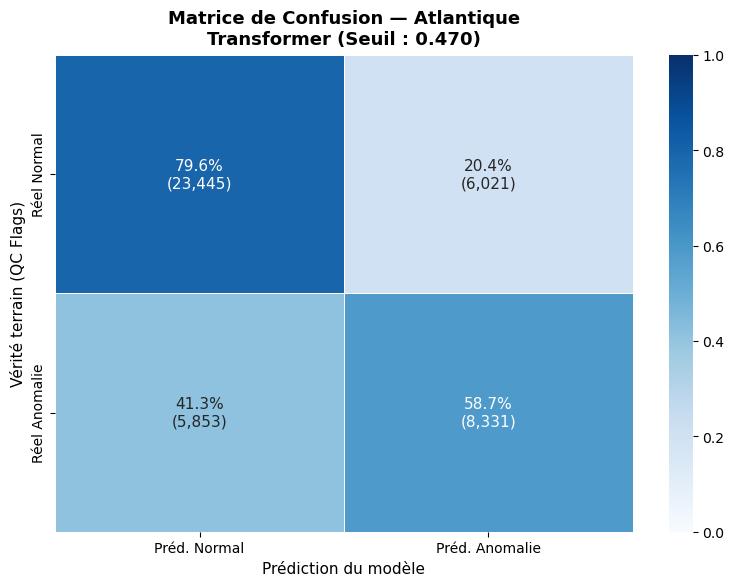

Saved in: /home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/Transformer/indian/cm_general.png


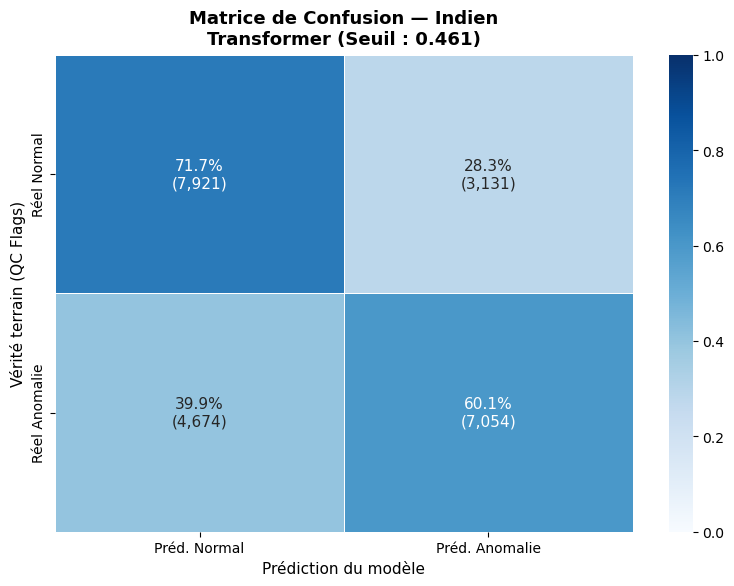

Saved in: /home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/Transformer/pacific/cm_general.png


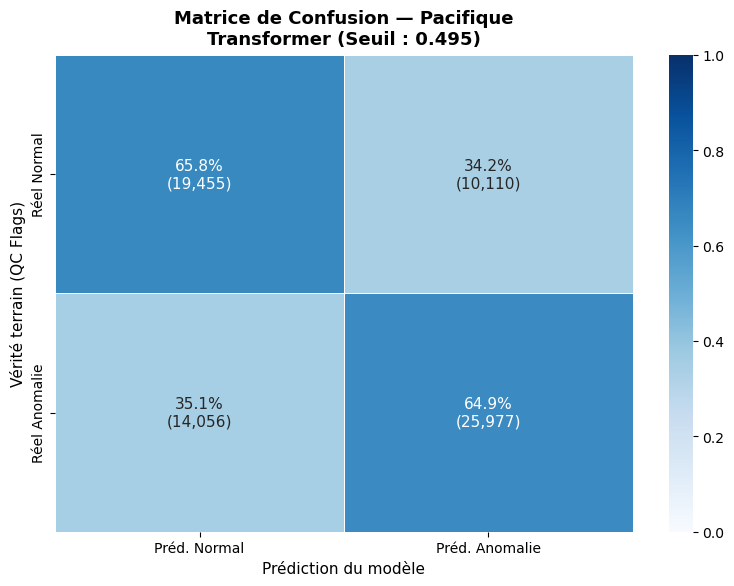

Saved in: /home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/CNN/atlantic/cm_general.png


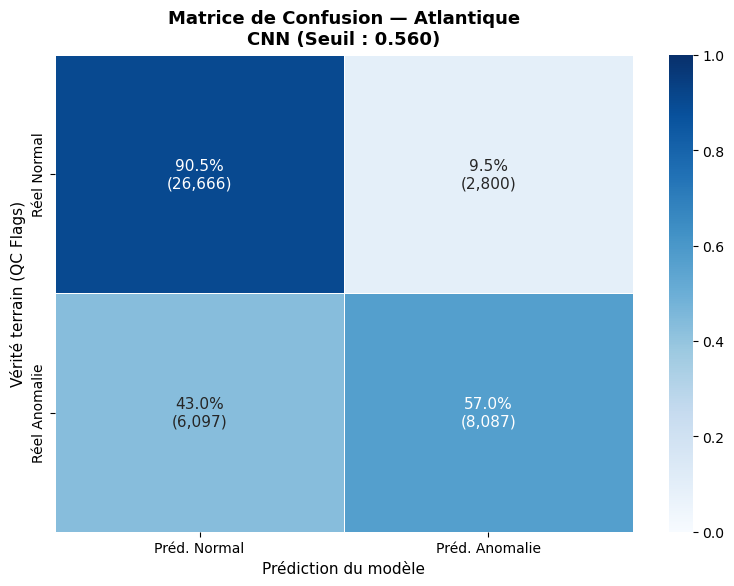

Saved in: /home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/CNN/indian/cm_general.png


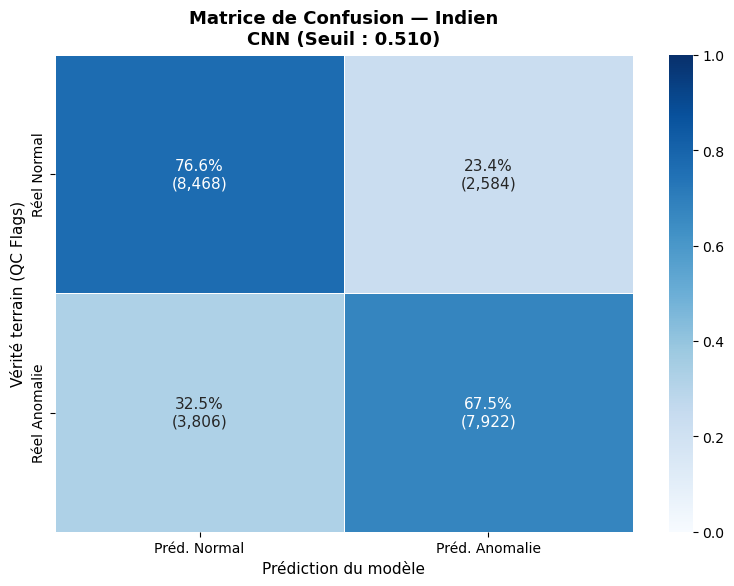

Saved in: /home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/CNN/pacific/cm_general.png


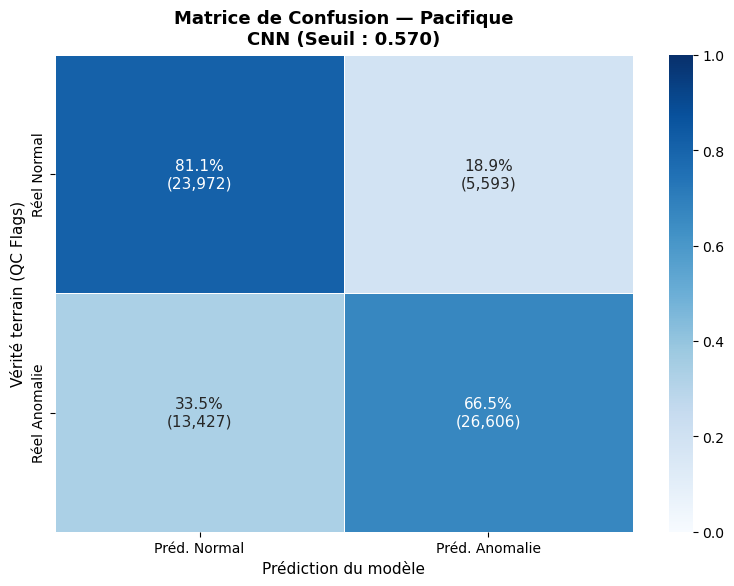

  [atlantic] Pas de clé de prédiction binaire trouvée -> reconstruite via seuil=0.4670
Saved in: /home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/Autoencoder_LGBM/atlantic/cm_general.png


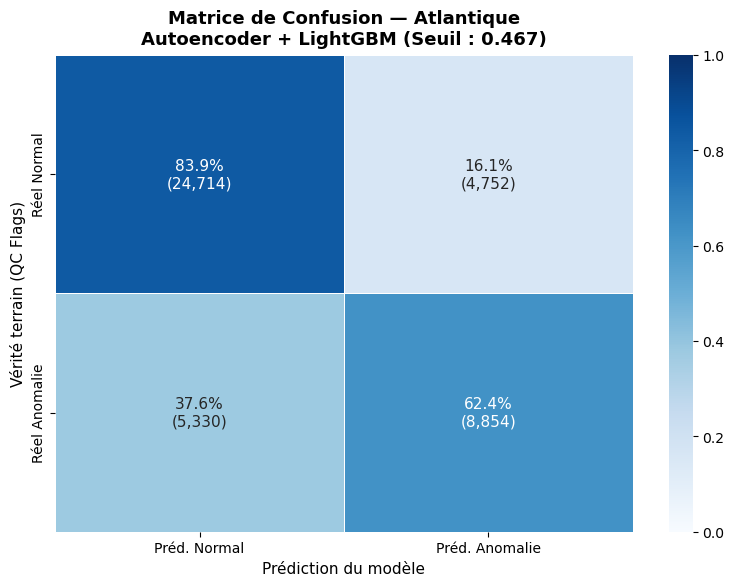

  [indian] Pas de clé de prédiction binaire trouvée -> reconstruite via seuil=0.3008
Saved in: /home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/Autoencoder_LGBM/indian/cm_general.png


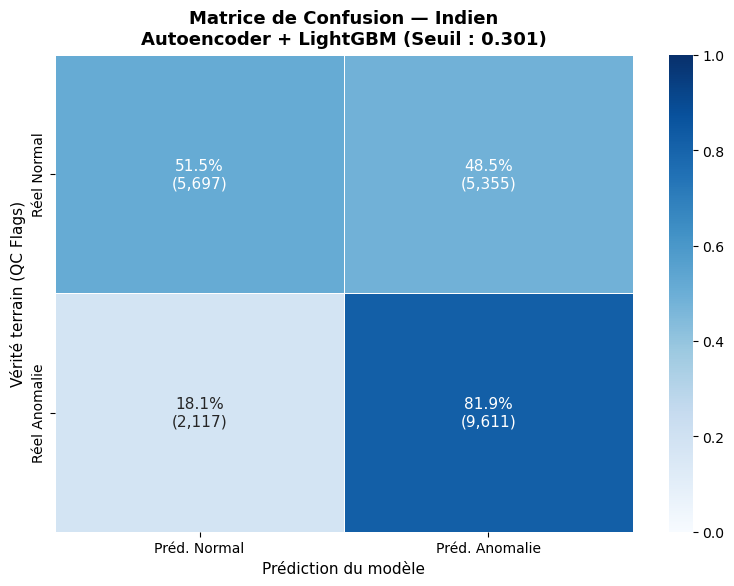

  [pacific] Pas de clé de prédiction binaire trouvée -> reconstruite via seuil=0.3409
Saved in: /home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/Autoencoder_LGBM/pacific/cm_general.png


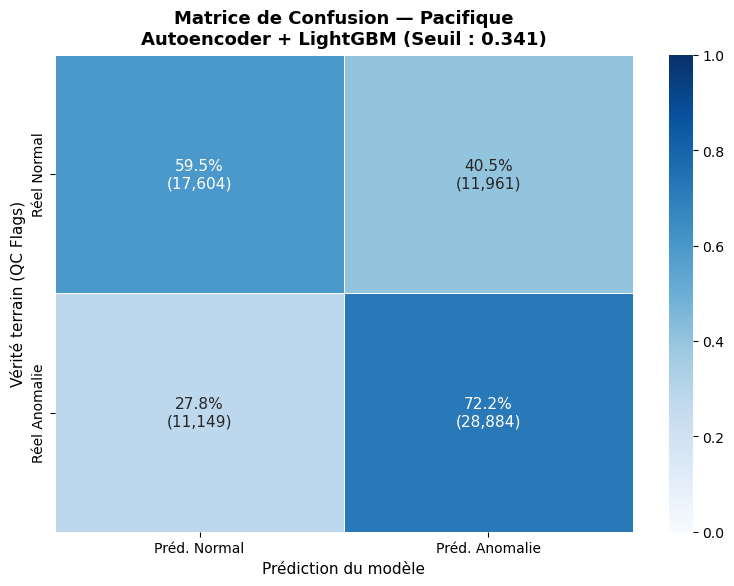

In [170]:
def plot_confusion_matrix_dl(model_key, ocean_key, y_true, y_pred,
                              threshold=None,
                              models_dict=MODELS_DL, oceans_fr=OCEANS_FR,
                              years=YEARS, output_dir=OUTPUT_DIR):
    cm = confusion_matrix(np.asarray(y_true), np.asarray(y_pred), labels=[0, 1])
    cm_norm = cm.astype(float) / cm.sum(axis=1, keepdims=True)

    nom_affichage = models_dict[model_key].get("nom_affichage", model_key)
    ocean_name_fr = oceans_fr.get(ocean_key, ocean_key.capitalize())

    thr_str = f"{threshold:.3f}" if threshold is not None else ""

    fig, ax = plt.subplots(figsize=(8, 6))
    labels = np.array([[f"{cm_norm[i,j]:.1%}\n({cm[i,j]:,})" for j in range(2)] for i in range(2)])

    sns.heatmap(cm_norm, annot=labels, fmt='', cmap='Blues', ax=ax,
                xticklabels=['Préd. Normal', 'Préd. Anomalie'],
                yticklabels=['Réel Normal', 'Réel Anomalie'],
                vmin=0, vmax=1, linewidths=0.7, cbar=True)

    ax.set_title(
    f"Matrice de Confusion — {ocean_name_fr}\n{nom_affichage} (Seuil : {thr_str})",
    fontsize=13,fontweight="bold",pad=8)
    ax.set_xlabel("Prédiction du modèle")
    ax.set_ylabel("Vérité terrain (QC Flags)")

    plt.tight_layout()

    out_dir = os.path.join(output_dir, model_key, ocean_key)
    os.makedirs(out_dir, exist_ok=True)
    p = os.path.join(out_dir, "cm_general.png")
    plt.savefig(p, dpi=150, bbox_inches='tight')
    print("Saved in:", os.path.abspath(p))
    plt.show()


# ── Helper pour extraire le seuil depuis les données brutes ──────────────────
def get_threshold(model_key, ocean_key):
    """Retourne le seuil optimal pour un modèle/océan, ou None si non disponible."""
    try:
        if model_key == "Transformer":
            data = joblib.load(os.path.join(TRANSFORMER_OUTPUT_BASE, ocean_key,
                                            "transformer_results.joblib"))
            return data.get("optimal_threshold", data.get("threshold", None))

        elif model_key == "CNN":
            data = joblib.load(os.path.join(CNN_OUTPUT_BASE, YEARS, ocean_key,
                                            "cnn_results.joblib"))
            return data.get("optimal_threshold", data.get("threshold", None))

        elif model_key == "Autoencoder_LGBM":
            data = joblib.load(os.path.join(AE_LGBM_BASE_RECON_DIR,
                                            f"LightGBM_{ocean_key}_{YEARS}",
                                            "analysis_data.pkl"))
            return data.get("chosen_threshold",
                   data.get("thr_best_f1",
                   data.get("metrics_test", {}).get("threshold", None)))
    except Exception:
        return None


# ── Appel ────────────────────────────────────────────────────────────────────
for model_key, loader in LOADERS_DL.items():
    for ocean_key in OCEANS:
        try:
            y_true, y_pred, _ = loader(ocean_key)
            thr = get_threshold(model_key, ocean_key)
            plot_confusion_matrix_dl(model_key, ocean_key, y_true, y_pred, threshold=thr)
        except Exception as e:
            print(f"✗ {model_key} / {ocean_key}: {e}")

# Physique matrices per variable

➔ Charge [Modèle: 'Transformer' (Transformer) | Océan: 'atlantic']...
➔ Charge [Modèle: 'Transformer' (Transformer) | Océan: 'indian']...
➔ Charge [Modèle: 'Transformer' (Transformer) | Océan: 'pacific']...
➔ Charge [Modèle: 'CNN' (CNN) | Océan: 'atlantic']...
➔ Charge [Modèle: 'CNN' (CNN) | Océan: 'indian']...
➔ Charge [Modèle: 'CNN' (CNN) | Océan: 'pacific']...
➔ Charge [Modèle: 'Autoencoder_LGBM' (Autoencoder + LightGBM) | Océan: 'atlantic']...
  [atlantic] Pas de clé de prédiction binaire trouvée -> reconstruite via seuil=0.4670
➔ Charge [Modèle: 'Autoencoder_LGBM' (Autoencoder + LightGBM) | Océan: 'indian']...
  [indian] Pas de clé de prédiction binaire trouvée -> reconstruite via seuil=0.3008
➔ Charge [Modèle: 'Autoencoder_LGBM' (Autoencoder + LightGBM) | Océan: 'pacific']...
  [pacific] Pas de clé de prédiction binaire trouvée -> reconstruite via seuil=0.3409


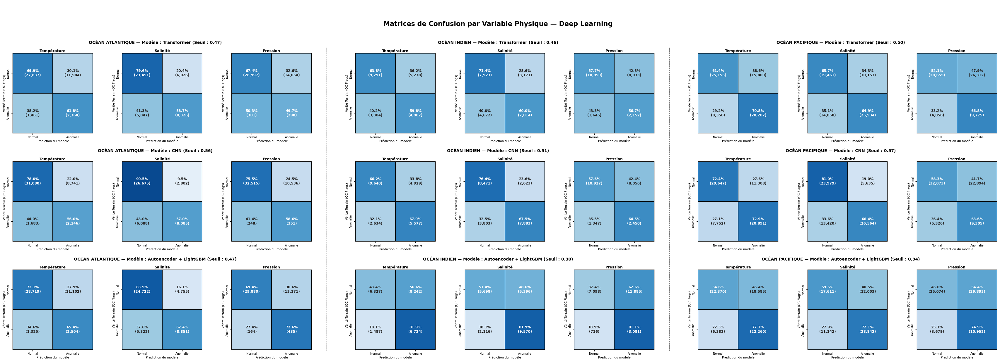


✔ Graphique unifié enregistré : /home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/confusion_per_variable_grid_—_Deep_Learning.png


In [68]:
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.lines import Line2D
from sklearn.metrics import confusion_matrix

VAR_TRANSLATIONS = {'TEMP': 'Température', 'PRES': 'Pression', 'PSAL': 'Salinité'}
CLASS_LABELS = ['Normal', 'Anomalie']


def plot_cm_ax(ax, y_true_var, y_pred, var_label):
    """Dibuja una matriz de confusión con bordes negros ultrafinos."""
    cm = confusion_matrix(y_true_var, y_pred, labels=[0, 1])
    cm_norm = cm.astype(float) / np.maximum(cm.sum(axis=1, keepdims=True), 1e-9)
    labels_cm = np.array([[f"{cm_norm[i,j]:.1%}\n({cm[i,j]:,})" for j in range(2)] for i in range(2)])

    sns.heatmap(
        cm_norm, annot=labels_cm, fmt='', cmap='Blues', ax=ax,
        xticklabels=CLASS_LABELS,
        yticklabels=CLASS_LABELS,
        vmin=0, vmax=1,
        linewidths=0.2, linecolor="black",  # Bordes internos ultrafinos
        cbar=False,
        annot_kws={"fontsize": 8.5, "weight": "bold"},
        square=True,
    )

    # Marco exterior negro muy delgado
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_color('black')
        spine.set_linewidth(0.25)

    ax.set_title(var_label, fontsize=9.0, fontweight="bold", pad=3)
    ax.set_xlabel("Prédiction du modèle", fontsize=7.5, fontweight="normal", labelpad=2)
    ax.set_ylabel("Vérité Terrain (QC Flags)", fontsize=7.5, fontweight="normal", labelpad=2)
    ax.tick_params(axis='x', which='major', labelsize=7.0, rotation=0)
    ax.tick_params(axis='y', which='major', labelsize=7.0, rotation=90)
    for tick_label in ax.get_xticklabels() + ax.get_yticklabels():
        tick_label.set_fontweight("normal")


def plot_confusion_per_variable_grid(models_dict, output_dir, suffix=""):
    """
    Grilla con una FILA DEDICADA en el GridSpec exclusivamente para el
    título general. Al ser parte del grid (no un fig.suptitle "flotante"
    calculado por fracciones), es geométricamente imposible que se
    solape con las subfiguras: el layout manager reserva el espacio
    igual que para cualquier otra fila.
    """
    model_list = list(models_dict.keys())
    ocean_list = list(OCEANS.keys())
    n_models = len(model_list)
    n_oceans = len(ocean_list)
    n_vars = 3  # TEMP, PRES, PSAL

    fig_width = 3.9 * n_vars * n_oceans
    row_height_in = 3.7            # alto de cada fila de modelo/océano
    title_row_height_in = 1.3      # alto de la fila reservada SOLO para el título
    fig_height = row_height_in * n_models + title_row_height_in

    fig = plt.figure(figsize=(fig_width, fig_height))

    # GridSpec con n_models + 1 filas: la fila 0 es solo para el título,
    # las filas 1..n_models son los modelos. height_ratios controla el
    # alto real de cada una -> el título tiene su hueco garantizado.
    gs = fig.add_gridspec(
        n_models + 1, n_oceans,
        height_ratios=[title_row_height_in] + [row_height_in] * n_models,
        top=0.98, bottom=0.02,
        left=0.02, right=0.98,
        hspace=0.15, wspace=0.05
    )

    # --- Fila del título: un eje invisible que ocupa TODO el ancho ---
    title_ax = fig.add_subplot(gs[0, :])
    title_ax.axis("off")
    title_ax.text(
        0.5, 0.35,
        f"Matrices de Confusion par Variable Physique{suffix}",
        transform=title_ax.transAxes,
        ha="center", va="center",
        fontsize=16, fontweight="bold", linespacing=1.4,
    )

    for r, model_key in enumerate(model_list):
        model_info = models_dict[model_key]
        nom_affichage = model_info.get("nom_affichage", model_key)

        for c, ocean_key in enumerate(ocean_list):
            ocean_name = OCEANS_FR.get(ocean_key, ocean_key)
            # +1 en la fila porque la fila 0 del grid es la del título
            subfig = fig.add_subfigure(gs[r + 1, c])

            axes = subfig.subplots(1, n_vars)
            axes = np.atleast_1d(axes)

            print(f"➔ Charge [Modèle: '{model_key}' ({nom_affichage}) | Océan: '{ocean_key}']...")

            try:
                _, y_pred, _ = LOADERS_DL[model_key](ocean_key)
                meta = load_meta_dl(model_key, ocean_key)
                thr = load_threshold_dl(model_key, ocean_key)
            except Exception as e:
                print(f"  ✗ ÉCHEC [Modèle: '{model_key}' | Océan: '{ocean_key}']: {e}")
                meta = None
                thr = None

            thr = float(thr) if thr is not None else None
            seuil_str = f" (Seuil : {thr:.2f})" if thr is not None else ""
            model_label = f"Modèle : {nom_affichage}{seuil_str}"
            combined_title = f"OCÉAN {ocean_name.upper()} — {model_label}"

            subfig.suptitle(
                combined_title,
                fontsize=10.0, fontweight="bold", y=0.94
            )

            if meta is None:
                for ax in axes:
                    ax.axis("off")
                continue

            variable_cols = [col for col in meta.columns if 'is_bad' in col.lower() and col.lower() != 'is_bad']

            for idx, var_col in enumerate(variable_cols[:n_vars]):
                ax = axes[idx]
                var_code = var_col.replace('_is_bad', '').replace('is_bad_', '').upper()
                var_name_fr = VAR_TRANSLATIONS.get(var_code, var_code)
                y_true_var = meta[var_col].values

                plot_cm_ax(ax, y_true_var, y_pred, var_name_fr)

            subfig.subplots_adjust(wspace=0.06, left=0.05, right=0.99, top=0.82, bottom=0.08)

    # Líneas divisorias verticales entre océanos (solo en la zona de datos,
    # debajo de la fila del título)
    grid_top_frac = gs.get_grid_positions(fig)[1][0]  # top de la fila 0 (título) ~ igual a top del grid
    grid_data_top_frac = gs.get_grid_positions(fig)[1][1]  # top de la fila 1 (primer modelo)
    for c in range(1, n_oceans):
        x_pos = c / n_oceans
        line = Line2D(
            [x_pos, x_pos], [0.02, grid_data_top_frac],
            color="#333333", linestyle="--", linewidth=1.0, alpha=0.7,
            transform=fig.transFigure
        )
        fig.lines.append(line)

    save_path = os.path.join(output_dir, f"confusion_per_variable_grid{suffix.replace(' ', '_')}.png")
    fig.savefig(save_path, dpi=200, bbox_inches="tight")
    plt.show()
    plt.close(fig)
    print(f"\n✔ Graphique unifié enregistré : {save_path}")


# Ejecución:
plot_confusion_per_variable_grid(MODELS_DL, OUTPUT_DIR, suffix=" — Deep Learning")

## 6. Courbes ROC par Océan (Deep Learning)

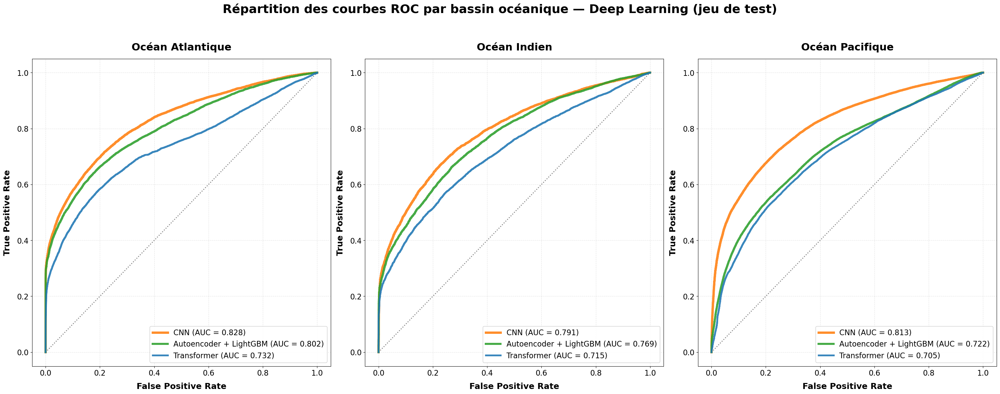

Graphique enregistré : /home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/roc_curves_by_ocean_—_Deep_Learning.png


In [62]:
def plot_roc_by_ocean(all_metrics, models_dict, output_dir, suffix=""):
    n_oceans = len(OCEANS)

    # 1. Se elimina 'sharey=True' para que cada gráfico gestione sus ejes de forma 100% independiente
    fig, axes = plt.subplots(1, n_oceans, figsize=(10 * n_oceans, 12))
    axes = np.atleast_1d(axes)

    for ax, ocean_key in zip(axes, OCEANS):
        sub = all_metrics[all_metrics["Ocean"] == ocean_key]
        sub = sub.sort_values(by="ROC_AUC", ascending=False)

        for i, (_, row) in enumerate(sub.iterrows()):
            if row["fpr_curve"] is None:
                continue
            style = models_dict[row["Model"]]
            nom_affichage = style.get("nom_affichage", row["Model"])

            lw = 5.0 - (i * 0.6)
            alpha = 0.88

            ax.plot(
                row["fpr_curve"],
                row["tpr_curve"],
                linestyle=style.get("ls", "-"),
                color=style.get("color"),
                label=f"{nom_affichage} (AUC = {row['ROC_AUC']:.3f})",
                linewidth=max(lw, 2.5),
                alpha=alpha,
                zorder=3 + i,
            )

        # Línea diagonal de azar
        ax.plot(
            [0, 1], [0, 1], linestyle=":", color="gray", linewidth=2.0, zorder=1
        )
        ax.grid(True, linestyle="--", alpha=0.35, zorder=0)

        # 2. Asignación independiente de etiquetas X e Y dentro del bucle para cada subgráfico
        ax.set_xlabel(
            "False Positive Rate", fontsize=18, fontweight="bold", labelpad=12
        )
        ax.set_ylabel(
            "True Positive Rate", fontsize=18, fontweight="bold", labelpad=12
        )

        ax.set_title(
            f"Océan {OCEANS_FR.get(ocean_key, ocean_key)}",
            fontsize=22,
            fontweight="bold",
            pad=18,
        )
        ax.legend(
            loc="lower right",
            fontsize=16,
            frameon=True,
            facecolor="white",
            framealpha=0.95,
        )
        ax.tick_params(axis="both", which="major", labelsize=16)

    # Título principal
    fig.suptitle(
        f"Répartition des courbes ROC par bassin océanique{suffix} (jeu de test)",
        fontsize=26,
        fontweight="bold",
        y=0.98,
    )

    fig.tight_layout(rect=[0, 0, 1, 0.94])

    save_path = os.path.join(
        output_dir, f"roc_curves_by_ocean{suffix.replace(' ', '_')}.png"
    )
    fig.savefig(save_path, dpi=300, bbox_inches="tight")
    plt.show()
    plt.close(fig)
    print(f"Graphique enregistré : {save_path}")


plot_roc_by_ocean(all_metrics_dl, MODELS_DL, OUTPUT_DIR, suffix=" — Deep Learning")

# Probability distribution

  [atlantic] Pas de clé de prédiction binaire trouvée -> reconstruite via seuil=0.4670
  [pacific] Pas de clé de prédiction binaire trouvée -> reconstruite via seuil=0.3409
  [indian] Pas de clé de prédiction binaire trouvée -> reconstruite via seuil=0.3008


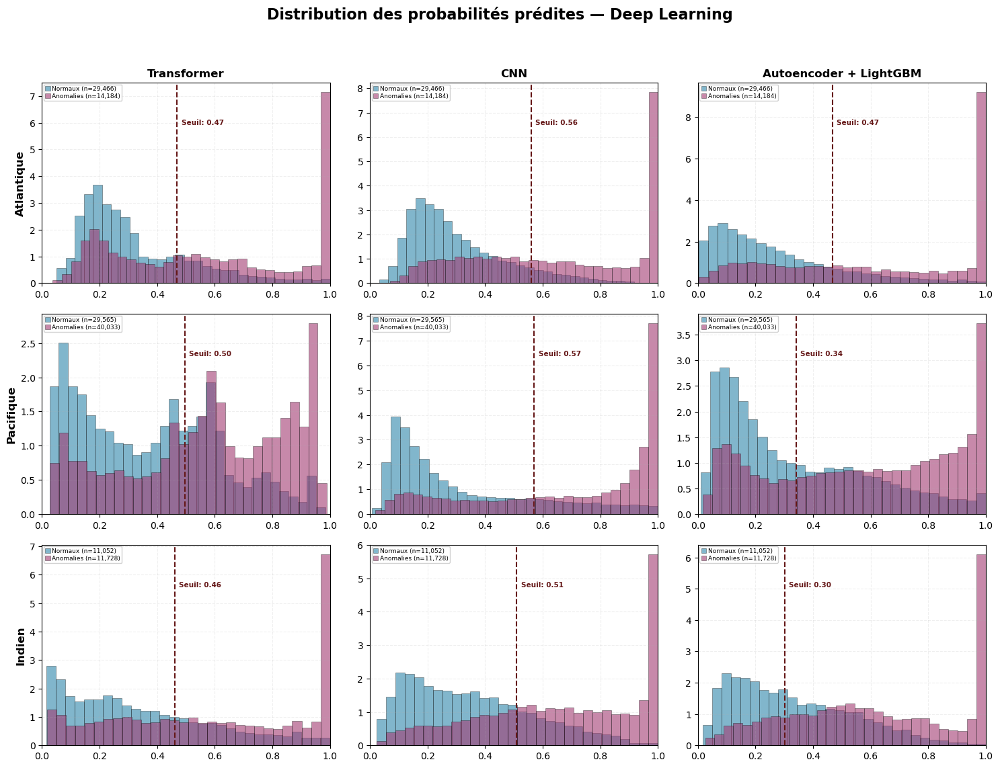

Saved → /home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/probability_distributions_grid_—_Deep_Learning.png


In [91]:
def build_proba_registry_dl():
    """Construye {(model, ocean): {'y_true', 'y_proba', 'threshold'}} para los 3 modelos DL."""
    registry = {}
    for model_key, loader in LOADERS_DL.items():
        for ocean_key in OCEANS:
            try:
                y_true, y_pred, y_proba = loader(ocean_key)
                threshold = load_threshold_dl(model_key, ocean_key)
                registry[(model_key, ocean_key)] = {
                    "y_true": y_true, "y_proba": y_proba, "threshold": threshold
                }
            except Exception as e:
                print(f"✗ [proba] {model_key}/{ocean_key}: {e}")
    return registry

def plot_probability_distribution_grid(models_dict, registry, output_dir, suffix=""):
    """Grille (modèles x océans) des distributions de probabilités prédites."""
    model_list = list(models_dict.keys())
    ocean_list = list(OCEANS.keys())

    fig, axes = plt.subplots(len(ocean_list), len(model_list),
                              figsize=(5 * len(model_list), 4 * len(ocean_list)), squeeze=False)
    fig.suptitle(f"Distribution des probabilités prédites{suffix}", fontsize=16, fontweight="bold", y=0.98)

    for row, ocean_key in enumerate(ocean_list):
        for col, model_key in enumerate(model_list):
            ax = axes[row, col]
            entry = registry.get((model_key, ocean_key))

            if entry is None:
                ax.set_visible(False)
                continue

            y_true = np.asarray(entry["y_true"])
            probs = np.asarray(entry["y_proba"])
            thr = entry.get("threshold")

            proba_normal = probs[y_true == 0]
            proba_anomaly = probs[y_true == 1]

            if len(proba_normal) > 0:
                ax.hist(proba_normal, bins=30, alpha=0.6, density=True, color="#2E86AB",
                        edgecolor="black", linewidth=0.4, label=f"Normaux (n={len(proba_normal):,})")
            if len(proba_anomaly) > 0:
                ax.hist(proba_anomaly, bins=30, alpha=0.6, density=True, color="#A23B72",
                        edgecolor="black", linewidth=0.4, label=f"Anomalies (n={len(proba_anomaly):,})")

            if row == 0:
                ax.set_title(models_dict[model_key]["nom_affichage"], fontsize=12, fontweight="bold")
            if col == 0:
                ax.set_ylabel(OCEANS_FR.get(ocean_key, ocean_key), fontsize=12, fontweight="bold")

            ax.set_xlim([0.0, 1.0])
            
            # Línea de umbral y texto siempre a la derecha (+0.015) con alineación izquierda
            if thr is not None and not np.isnan(thr):
                ax.axvline(thr, color="#641616", ls="--", lw=1.5)
                y_max = ax.get_ylim()[1]
                ax.text(
                    thr + 0.015, y_max * 0.80, 
                    f"Seuil: {thr:.2f}", 
                    color="#641616",
                    fontsize=7.5, 
                    fontweight="bold", 
                    ha="left", 
                    va="center",
                    bbox=dict(boxstyle="round,pad=0.15", facecolor="white", alpha=0.75, edgecolor="none")
                )

            # LEYENDA COMPACTA: recuadro estrecho y texto pequeño
            ax.legend(
                loc='upper left',
                fontsize=6.5,          # Tamaño de texto más reducido
                handlelength=0.8,      # Ancho del cuadrito de color más corto
                handletextpad=0.3,     # Menos espacio entre cuadrito y texto
                labelspacing=0.2,      # Menos espacio vertical entre filas
                borderpad=0.25,        # Menos margen interno en el borde del recuadro
                borderaxespad=0.3,     # Menos margen respecto a los ejes
                framealpha=0.9
            )
            ax.grid(alpha=0.2, linestyle="--")

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    save_path = os.path.join(output_dir, f"probability_distributions_grid{suffix.replace(' ', '_')}.png")
    fig.savefig(save_path, dpi=200, bbox_inches="tight")
    plt.show()
    plt.close(fig)
    print(f"Saved → {save_path}")

PROBA_REGISTRY_DL = build_proba_registry_dl()
plot_probability_distribution_grid(MODELS_DL, PROBA_REGISTRY_DL, OUTPUT_DIR, suffix=" — Deep Learning")

## 7. Erreurs de Prédiction par Océan (FP / FN) — Deep Learning

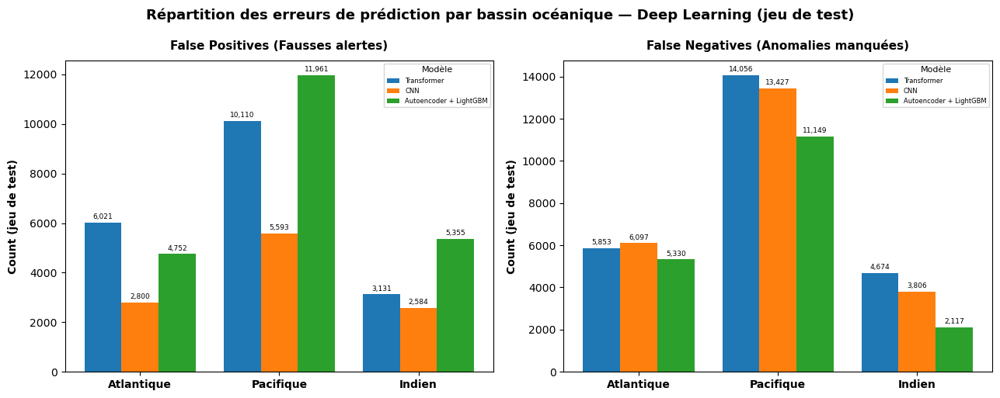

Graphique enregistré : /home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/errors_by_ocean_—_Deep_Learning.png


In [73]:
def plot_errors_by_ocean(all_metrics, models_dict, output_dir, suffix=""):
    model_list = list(models_dict.keys())
    num_models = len(model_list)

    # Si hay más de 3 modelos: aumentamos el ancho y achicamos la letra
    if num_models > 3:
        fig_width = 16
        num_fontsize = 4.5
    else:
        fig_width = 13
        num_fontsize = 6.5

    fig, axes = plt.subplots(1, 2, figsize=(fig_width, 5.2))
    titles = ["False Positives (Fausses alertes)", "False Negatives (Anomalies manquées)"]

    for ax, comp, title in zip(axes, ["FP", "FN"], titles):
        width = 0.8 / num_models
        x = np.arange(len(OCEANS))

        for i, model_key in enumerate(model_list):
            sub = all_metrics[all_metrics["Model"] == model_key].set_index("Ocean")
            vals = [sub.loc[o, comp] if o in sub.index else 0 for o in OCEANS]

            nom_affichage = models_dict[model_key]["nom_affichage"]
            color = models_dict[model_key].get("color")
            bars = ax.bar(x + i * width, vals, width, label=nom_affichage, color=color)

            # Números horizontales pero más pequeños y pegados a la barra
            ax.bar_label(bars, fmt="{:,.0f}", fontsize=num_fontsize, padding=2)

        ax.set_xticks(x + width * (num_models - 1) / 2)
        ax.set_xticklabels([OCEANS_FR.get(o, o) for o in OCEANS], fontsize=10, fontweight="bold")
        ax.set_ylabel("Count (jeu de test)", fontsize=10, fontweight="bold")
        ax.set_title(title, fontsize=11, fontweight="bold", pad=10)
        ax.legend(title="Modèle", fontsize=6, title_fontsize=8, frameon=True, facecolor="white")
    
    fig.suptitle(f"Répartition des erreurs de prédiction par bassin océanique{suffix} (jeu de test)",
                 fontsize=13, fontweight="bold")
    fig.tight_layout()

    save_path = os.path.join(output_dir, f"errors_by_ocean{suffix.replace(' ', '_')}.png")
    fig.savefig(save_path, dpi=300, bbox_inches="tight")
    plt.show()
    print(f"Graphique enregistré : {save_path}")

plot_errors_by_ocean(all_metrics_dl, MODELS_DL, OUTPUT_DIR, suffix=" — Deep Learning")

## 8. Comparaison Groupée des Métriques (barres) — Deep Learning

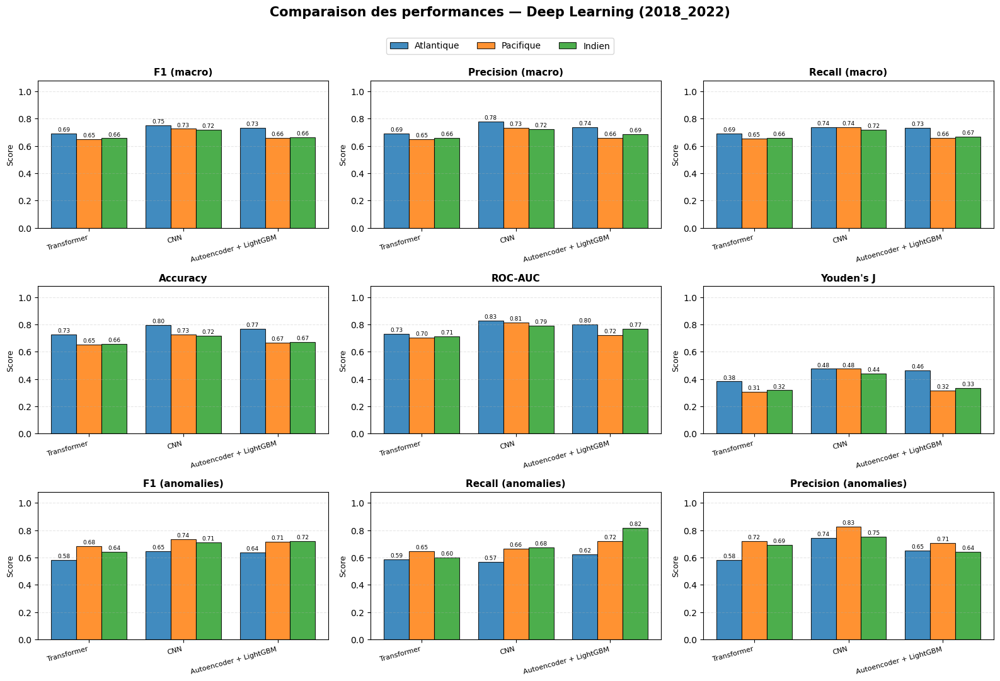

Graphique enregistré : /home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/metrics_comparison_grouped_bars_—_Deep_Learning.png


In [82]:
def plot_metrics_comparison_grouped(all_metrics, models_dict, output_dir, suffix=""):
    metrics_to_plot = [
        ("F1_macro", "F1 (macro)"), ("Precision_macro", "Precision (macro)"), ("Recall_macro", "Recall (macro)"),
        ("Accuracy", "Accuracy"), ("ROC_AUC", "ROC-AUC"), ("Youden_j", "Youden's J"),
        ("F1_anom", "F1 (anomalies)"), ("Recall_anom", "Recall (anomalies)"), ("Precision_anom", "Precision (anomalies)"),
    ]

    model_order = [m for m in models_dict if m in all_metrics["Model"].unique()]
    ocean_order = [o for o in OCEANS if o in all_metrics["Ocean"].unique()]
    n_oceans = len(ocean_order)
    n_models = len(model_order)

    # Lienzo más ancho/alto y tipografía adaptativa para los números sobre las barras
    if n_models > 3:
        fig_width, fig_height = 20, 13
        num_fontsize = 4.5
    else:
        fig_width, fig_height = 16, 11
        num_fontsize = 6.5

    bar_width = 0.8 / max(n_oceans, 1)
    x = np.arange(n_models)

    fig, axes = plt.subplots(3, 3, figsize=(fig_width, fig_height))
    fig.suptitle(f"Comparaison des performances{suffix} ({YEARS})", fontsize=15, fontweight="bold")

    for (col_key, col_label), ax in zip(metrics_to_plot, axes.flat):
        ax.set_ylim([0, 1.08])
        for j, ocean_key in enumerate(ocean_order):
            values = []
            for model_key in model_order:
                row = all_metrics[(all_metrics["Model"] == model_key) & (all_metrics["Ocean"] == ocean_key)]
                values.append(row[col_key].values[0] if not row.empty else 0.0)

            offset = (j - (n_oceans - 1) / 2) * bar_width
            bars = ax.bar(x + offset, values, width=bar_width, color=OCEANS[ocean_key],
                           alpha=0.85, edgecolor="black", linewidth=0.8, label=OCEANS_FR.get(ocean_key, ocean_key))
            
            # Reemplazado annotate_bars por ax.bar_label con fuente más pequeña
            ax.bar_label(bars, fmt="{:.2f}", fontsize=num_fontsize, padding=1)

        ax.set_xticks(x)
        ax.set_xticklabels([models_dict[m]["nom_affichage"] for m in model_order], rotation=15, ha="right", fontsize=8)
        ax.set_ylabel("Score", fontsize=9)
        ax.set_title(col_label, fontsize=11, fontweight="bold")
        ax.grid(alpha=0.3, axis="y", linestyle="--")

    handles, labels = axes.flat[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc="upper center", bbox_to_anchor=(0.5, 0.94), ncol=max(n_oceans, 1), fontsize=10)
    plt.tight_layout(rect=[0, 0, 1, 0.94])

    save_path = os.path.join(output_dir, f"metrics_comparison_grouped_bars{suffix.replace(' ', '_')}.png")
    fig.savefig(save_path, dpi=150, bbox_inches="tight")
    plt.show()
    plt.close(fig)
    print(f"Graphique enregistré : {save_path}")


plot_metrics_comparison_grouped(all_metrics_dl, MODELS_DL, OUTPUT_DIR, suffix=" — Deep Learning")

---
# PARTIE 2 — Comparaison Complète (Deep Learning + Machine Learning)

## 9. Configuration des Modèles Machine Learning (bundles pré-calculés)

In [6]:
# NOTE: les modèles ML utilisent un format de sortie différent (bundle .pkl par modèle/océan)
# déjà mis en place dans ton pipeline existant. On garde EXACTEMENT le même mécanisme de
# chargement pour ne rien casser, et on l'unifie ensuite avec les métriques DL.

MODELS_ML = {
    "RF":              {"nom_affichage": "Random Forest",    "marker": "o", "ls": "-", "color": "#d62728"},  # rojo
    "IsolationForest": {"nom_affichage": "Isolation Forest", "marker": "s", "ls": "-", "color": "#9467bd"},  # morado
    "XG_boost":        {"nom_affichage": "XGBoost",          "marker": "^", "ls": "-", "color": "#8c564b"},  # marrón
    "LightGBM":        {"nom_affichage": "LightGBM",         "marker": "D", "ls": "-", "color": "#17becf"},  # cian (en vez de rosa)
}

BASE_RESULTS_DIR = "/work/drgarcia/Models_and_results"
MODEL_DIR_ML = {
    (model, ocean): f"{BASE_RESULTS_DIR}/{model}/{YEARS}/{ocean.lower()}_f1macro_time_asc_nounder"
    for model in MODELS_ML for ocean in OCEANS
}

BUNDLE_FILENAME = "plot_data_bundle.pkl"
KEY_Y_TRUE = "y_test"
KEY_Y_PRED = "y_pred_final"
KEY_PROB = "probs"

print("Modèles ML configurés:", list(MODELS_ML.keys()))

Modèles ML configurés: ['RF', 'IsolationForest', 'XG_boost', 'LightGBM']


## 10. Chargement des Bundles ML et Calcul des Métriques

In [7]:
def load_bundle(model_key, ocean_key):
    path = os.path.join(MODEL_DIR_ML[(model_key, ocean_key)], BUNDLE_FILENAME)
    if not os.path.exists(path):
        print(f"  [WARNING] missing {path}")
        return None
    return joblib.load(path)


def metrics_from_bundle(model_key, ocean_key, b):
    if b is None or KEY_Y_TRUE not in b or KEY_Y_PRED not in b:
        return None
    y_true = b[KEY_Y_TRUE]
    y_pred = b[KEY_Y_PRED]
    y_proba = b.get(KEY_PROB)
    return metrics_from_arrays(model_key, ocean_key, y_true, y_pred, y_proba, MODELS_ML)


BUNDLES = {}
records_ml = []
for model_key in MODELS_ML:
    for ocean_key in OCEANS:
        b = load_bundle(model_key, ocean_key)
        BUNDLES[(model_key, ocean_key)] = b
        rec = metrics_from_bundle(model_key, ocean_key, b)
        if rec is not None:
            records_ml.append(rec)

all_metrics_ml = pd.DataFrame(records_ml)
print(f"Combinaisons ML chargées: {len(all_metrics_ml)} / {len(MODELS_ML) * len(OCEANS)}")
all_metrics_ml.drop(columns=["fpr_curve", "tpr_curve"]).round(3) if not all_metrics_ml.empty else all_metrics_ml

Combinaisons ML chargées: 12 / 12


,Model,Nom_affichage,Ocean,Accuracy,Precision_macro,Recall_macro,F1_macro,ROC_AUC,Youden_j,Precision_anom,Recall_anom,F1_anom,TP,FP,FN,TN,n_test
0,RF,Random Forest,atlantic,0.840,0.825,0.801,0.811,0.870,0.603,0.789,0.692,0.737,9810,2618,4374,26848,43650
1,RF,Random Forest,indian,0.830,0.831,0.831,0.830,0.907,0.662,0.857,0.804,0.830,9427,1568,2301,9484,22780
2,RF,Random Forest,pacific,0.844,0.843,0.851,0.843,0.920,0.703,0.916,0.802,0.855,32126,2952,7907,26613,69598
3,IsolationForest,Isolation Forest,atlantic,0.668,0.598,0.571,0.571,0.627,0.142,0.482,0.295,0.366,4191,4508,10004,24987,43690
4,IsolationForest,Isolation Forest,indian,0.547,0.558,0.551,0.536,0.544,0.103,0.592,0.386,0.467,4531,3129,7207,7926,22793
5,IsolationForest,Isolation Forest,pacific,0.613,0.599,0.593,0.594,0.587,0.187,0.647,0.720,0.681,28888,15778,11233,13823,69722
6,XG_boost,XGBoost,atlantic,0.846,0.843,0.797,0.813,0.877,0.594,0.836,0.656,0.735,9305,1827,4879,27639,43650
7,XG_boost,XGBoost,indian,0.839,0.845,0.841,0.839,0.916,0.682,0.897,0.777,0.833,9114,1046,2614,10006,22780
8,XG_boost,XGBoost,pacific,0.841,0.841,0.849,0.840,0.912,0.699,0.918,0.795,0.852,31842,2859,8191,26706,69598
9,LightGBM,LightGBM,atlantic,0.844,0.834,0.800,0.813,0.875,0.600,0.814,0.674,0.737,9562,2188,4622,27278,43650


## 11. Fusion Deep Learning + Machine Learning

In [9]:
MODELS = {**MODELS_DL, **MODELS_ML}
all_metrics = pd.concat([all_metrics_dl, all_metrics_ml], ignore_index=True)

print(f"Total combinaisons (DL+ML): {len(all_metrics)} / {len(MODELS) * len(OCEANS)}")
all_metrics.drop(columns=["fpr_curve", "tpr_curve"]).round(3)

Total combinaisons (DL+ML): 21 / 21


,Model,Nom_affichage,Ocean,Accuracy,Precision_macro,Recall_macro,F1_macro,ROC_AUC,Youden_j,Precision_anom,Recall_anom,F1_anom,TP,FP,FN,TN,n_test
0,Transformer,Transformer,atlantic,0.728,0.690,0.692,0.691,0.732,0.383,0.580,0.587,0.584,8331,6021,5853,23445,43650
1,Transformer,Transformer,indian,0.657,0.661,0.659,0.657,0.715,0.318,0.693,0.601,0.644,7054,3131,4674,7921,22780
2,Transformer,Transformer,pacific,0.653,0.650,0.653,0.650,0.705,0.307,0.720,0.649,0.683,25977,10110,14056,19455,69598
3,CNN,CNN,atlantic,0.796,0.778,0.738,0.751,0.828,0.475,0.743,0.570,0.645,8087,2800,6097,26666,43650
4,CNN,CNN,indian,0.719,0.722,0.721,0.719,0.791,0.442,0.754,0.675,0.713,7922,2584,3806,8468,22780
5,CNN,CNN,pacific,0.727,0.734,0.738,0.726,0.813,0.475,0.826,0.665,0.737,26606,5593,13427,23972,69598
6,Autoencoder_LGBM,Autoencoder + LightGBM,atlantic,0.769,0.737,0.731,0.734,0.802,0.463,0.651,0.624,0.637,8854,4752,5330,24714,43650
7,Autoencoder_LGBM,Autoencoder + LightGBM,indian,0.672,0.686,0.667,0.662,0.769,0.335,0.642,0.819,0.720,9611,5355,2117,5697,22780
8,Autoencoder_LGBM,Autoencoder + LightGBM,pacific,0.668,0.660,0.658,0.659,0.722,0.317,0.707,0.722,0.714,28884,11961,11149,17604,69598
9,RF,Random Forest,atlantic,0.840,0.825,0.801,0.811,0.870,0.603,0.789,0.692,0.737,9810,2618,4374,26848,43650


## 12. Tableaux de Synthèse (Deep Learning + Machine Learning)

In [12]:
general_metrics_table, anomaly_metrics_table = build_summary_tables(all_metrics)

general_metrics_table.to_csv(os.path.join(OUTPUT_DIR, "general_metrics_table_ALL.csv"))
anomaly_metrics_table.to_csv(os.path.join(OUTPUT_DIR, "anomaly_metrics_table_ALL.csv"))

print("MÉTRIQUES GLOBALES (Deep Learning + Machine Learning)")
display(general_metrics_table)

print("\nMÉTRIQUES SPÉCIFIQUES — CLASSE ANOMALIES (Deep Learning + Machine Learning)")
display(anomaly_metrics_table)

MÉTRIQUES GLOBALES (Deep Learning + Machine Learning)


Precision (macro)  Recall (macro)  \
Modèle                 Océan                                         
Autoencoder + LightGBM atlantic               0.74            0.73   
                       indian                 0.69            0.67   
                       pacific                0.66            0.66   
CNN                    atlantic               0.78            0.74   
                       indian                 0.72            0.72   
                       pacific                0.73            0.74   
Isolation Forest       atlantic               0.60            0.57   
                       indian                 0.56            0.55   
                       pacific                0.60            0.59   
LightGBM               atlantic               0.83            0.80   
                       indian                 0.84            0.84   
                       pacific                0.84            0.85   
Random Forest          atlantic               0.82            0.80   
                       indian                 0.83            0.83   
                       pacific                0.84            0.85   
Transformer            atlantic               0.69            0.69   
                       indian                 0.66            0.66   
                       pacific                0.65            0.65   
XGBoost                atlantic               0.84            0.80   
                       indian                 0.84            0.84   
                       pacific                0.84            0.85   

                                 F1 (macro)  ROC-AUC  Accuracy  Youden's J  
Modèle                 Océan                                                
Autoencoder + LightGBM atlantic        0.73     0.80      0.77        0.46  
                       indian          0.66     0.77      0.67        0.33  
                       pacific         0.66     0.72      0.67        0.32  
CNN                    atlantic        0.75     0.83      0.80        0.48  
                       indian          0.72     0.79      0.72        0.44  
                       pacific         0.73     0.81      0.73        0.48  
Isolation Forest       atlantic        0.57     0.63      0.67        0.14  
                       indian          0.54     0.54      0.55        0.10  
                       pacific         0.59     0.59      0.61        0.19  
LightGBM               atlantic        0.81     0.88      0.84        0.60  
                       indian          0.84     0.91      0.84        0.69  
                       pacific         0.84     0.91      0.84        0.70  
Random Forest          atlantic        0.81     0.87      0.84        0.60  
                       indian          0.83     0.91      0.83        0.66  
                       pacific         0.84     0.92      0.84        0.70  
Transformer            atlantic        0.69     0.73      0.73        0.38  
                       indian          0.66     0.71      0.66        0.32  
                       pacific         0.65     0.70      0.65        0.31  
XGBoost                atlantic        0.81     0.88      0.85        0.59  
                       indian          0.84     0.92      0.84        0.68  
                       pacific         0.84     0.91      0.84        0.70


MÉTRIQUES SPÉCIFIQUES — CLASSE ANOMALIES (Deep Learning + Machine Learning)


Precision (anomalies)  Recall (anomalies)  \
Modèle                 Océan                                                 
Autoencoder + LightGBM atlantic                   0.65                0.62   
                       indian                     0.64                0.82   
                       pacific                    0.71                0.72   
CNN                    atlantic                   0.74                0.57   
                       indian                     0.75                0.68   
                       pacific                    0.83                0.66   
Isolation Forest       atlantic                   0.48                0.30   
                       indian                     0.59                0.39   
                       pacific                    0.65                0.72   
LightGBM               atlantic                   0.81                0.67   
                       indian                     0.88                0.80   
                       pacific                    0.91                0.80   
Random Forest          atlantic                   0.79                0.69   
                       indian                     0.86                0.80   
                       pacific                    0.92                0.80   
Transformer            atlantic                   0.58                0.59   
                       indian                     0.69                0.60   
                       pacific                    0.72                0.65   
XGBoost                atlantic                   0.84                0.66   
                       indian                     0.90                0.78   
                       pacific                    0.92                0.80   

                                 F1 (anomalies)  
Modèle                 Océan                     
Autoencoder + LightGBM atlantic            0.64  
                       indian              0.72  
                       pacific             0.71  
CNN                    atlantic            0.65  
                       indian              0.71  
                       pacific             0.74  
Isolation Forest       atlantic            0.37  
                       indian              0.47  
                       pacific             0.68  
LightGBM               atlantic            0.74  
                       indian              0.84  
                       pacific             0.85  
Random Forest          atlantic            0.74  
                       indian              0.83  
                       pacific             0.86  
Transformer            atlantic            0.58  
                       indian              0.64  
                       pacific             0.68  
XGBoost                atlantic            0.74  
                       indian              0.83  
                       pacific             0.85

In [177]:
def plot_cm_ax(ax, y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred, labels=[0, 1])
    cm_norm = cm.astype(float) / cm.sum(axis=1, keepdims=True)

    # Dibujar la matriz
    ax.imshow(cm_norm, cmap="Blues", vmin=0, vmax=1)
    
    # Desactivar la cuadrícula transparente que crea las líneas blancas
    ax.grid(False)

    # Texto dentro de las celdas
    for i in range(2):
        for j in range(2):
            color = "white" if cm_norm[i, j] > 0.5 else "black"
            ax.text(j, i, f"{cm_norm[i, j]:.1%}\n({cm[i, j]:,})",
                    ha="center", va="center", fontsize=11,  color=color)

    # Ajuste de ejes y etiquetas
    ax.set_xticks([0, 1])
    ax.set_xticklabels(["Normal", "Anomalie"], rotation=0, fontsize=9)
    
    ax.set_yticks([0, 1])
    ax.set_yticklabels(["Normal", "Anomalie"], rotation=90, va="center", fontsize=9)

    # Separación adecuada de los títulos de los ejes
    ax.set_xlabel("Prédiction du modèle", fontsize=10, labelpad=8)
    ax.set_ylabel("Vérité terrain (QC Flags)", fontsize=10, labelpad=10)
    ax.set_title(title, fontsize=11, fontweight="bold", pad=10)

    # Marco exterior fino para dar acabado limpio
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_color("black")
        spine.set_linewidth(0.5)

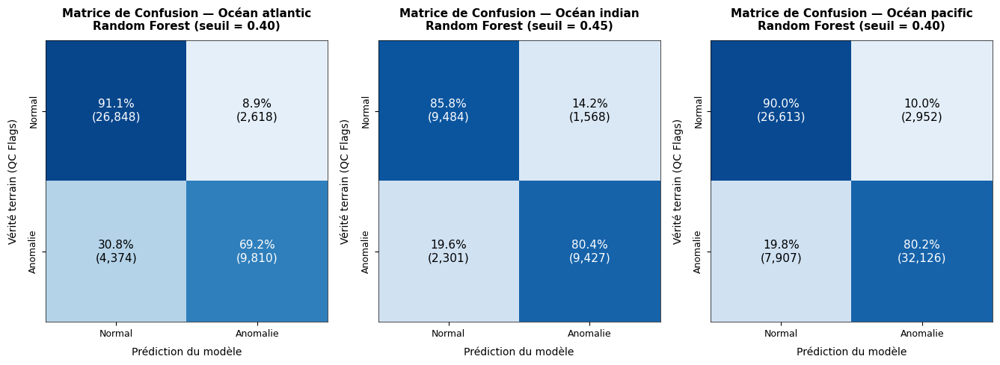

✔ Saved → /home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/confusion_matrices_model_rf.png


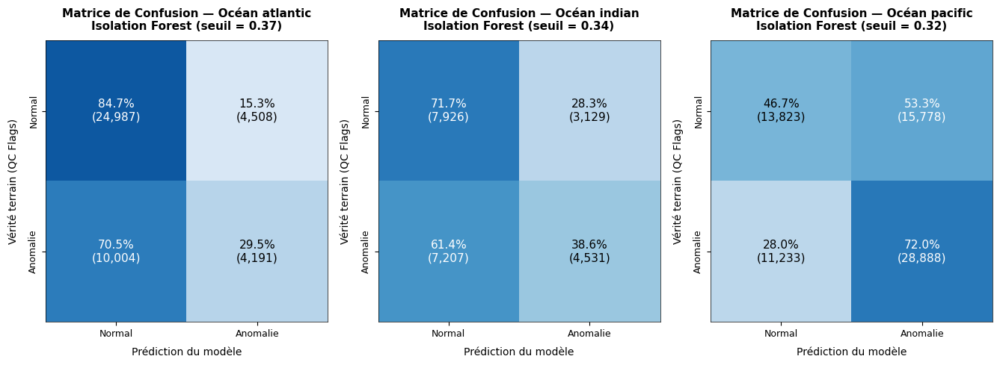

✔ Saved → /home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/confusion_matrices_model_isolationforest.png


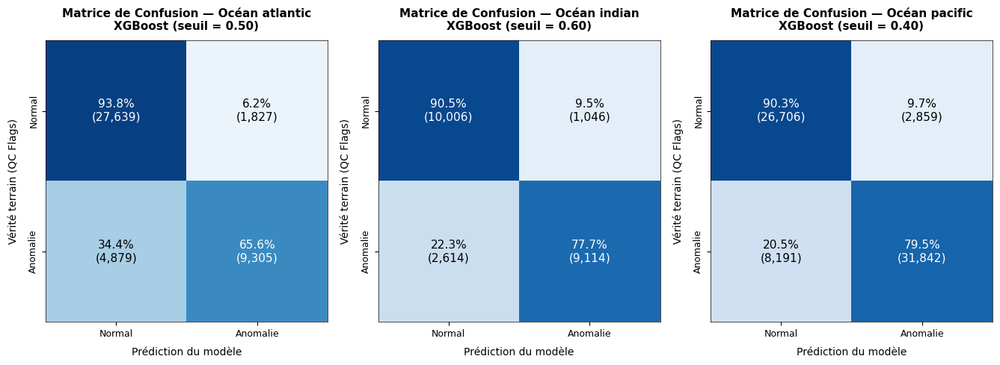

✔ Saved → /home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/confusion_matrices_model_xg_boost.png


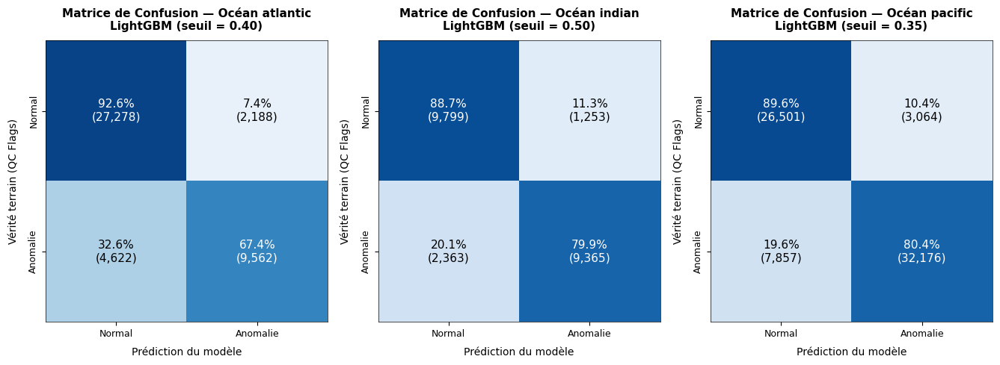

✔ Saved → /home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/confusion_matrices_model_lightgbm.png


In [181]:
import numpy as np

# Iterar por CADA MODELO en lugar de por océano
for model_key, model_info in MODELS_ML.items():
    nom_affichage = model_info["nom_affichage"]

    # Crear 1 fila con N columnas (tantas columnas como océanos existan)
    fig, axes = plt.subplots(1, len(OCEANS), figsize=(4.5 * len(OCEANS), 4.5))
    if len(OCEANS) == 1:
        axes = [axes]

    # Iterar por los océanos (columnas) para este modelo específico
    for idx, ocean_key in enumerate(OCEANS):
        ax = axes[idx]
        b = BUNDLES.get((model_key, ocean_key))

        if b is None or KEY_Y_TRUE not in b or KEY_Y_PRED not in b:
            ax.axis("off")
            ax.set_title(f"OCÉAN {ocean_key.upper()}\n(Données manquantes)", fontsize=10)
            continue

        # Obtener el umbral si existe
        # Obtener el umbral si existe
        thr = b.get("chosen_threshold", float("nan")) if b else float("nan")
        seuil_str = f" (seuil = {thr:.2f})" if isinstance(thr, (int, float)) and not np.isnan(thr) else ""

        # Título corregido y formateado
        titre = f"Matrice de Confusion — Océan {ocean_key}\n{nom_affichage}{seuil_str}"

        # Dibujar la matriz en la columna correspondiente
        plot_cm_ax(ax, b[KEY_Y_TRUE], b[KEY_Y_PRED], titre)

    plt.subplots_adjust(wspace=0.35)
    plt.tight_layout()

    save_path = os.path.join(OUTPUT_DIR, f"confusion_matrices_model_{model_key.lower()}.png")
    fig.savefig(save_path, dpi=200, bbox_inches="tight")
    plt.show()
    plt.close(fig)
    print(f"✔ Saved → {save_path}")

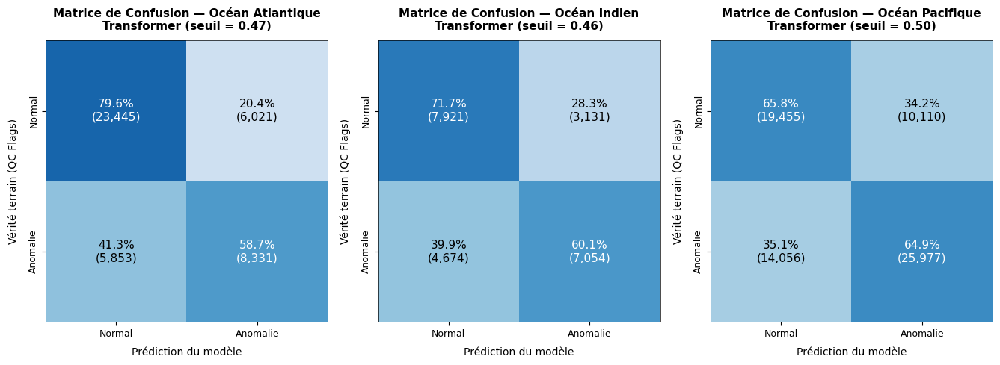

✔ Saved DL → /home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/confusion_matrices_model_transformer.png


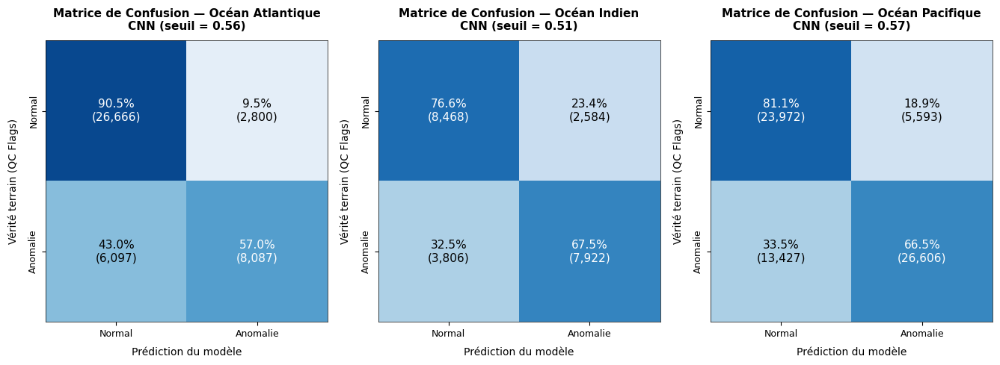

✔ Saved DL → /home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/confusion_matrices_model_cnn.png
  [atlantic] Pas de clé de prédiction binaire trouvée -> reconstruite via seuil=0.4670
  [indian] Pas de clé de prédiction binaire trouvée -> reconstruite via seuil=0.3008
  [pacific] Pas de clé de prédiction binaire trouvée -> reconstruite via seuil=0.3409


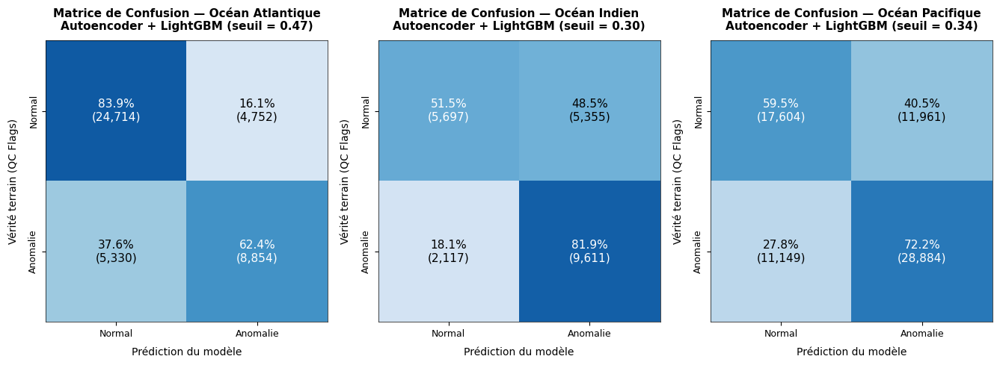

✔ Saved DL → /home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/confusion_matrices_model_autoencoder_lgbm.png


In [185]:
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# ── 1. Función compartida de dibujo (Idéntica a ML) ──────────────────────────
def plot_cm_ax(ax, y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred, labels=[0, 1])
    cm_norm = cm.astype(float) / np.maximum(cm.sum(axis=1, keepdims=True), 1e-9)

    # Dibujar la matriz
    ax.imshow(cm_norm, cmap="Blues", vmin=0, vmax=1)
    ax.grid(False)

    # Texto dentro de las celdas
    for i in range(2):
        for j in range(2):
            color = "white" if cm_norm[i, j] > 0.5 else "black"
            ax.text(j, i, f"{cm_norm[i, j]:.1%}\n({cm[i, j]:,})",
                    ha="center", va="center", fontsize=11, color=color)

    # Ajuste de ejes y etiquetas
    ax.set_xticks([0, 1])
    ax.set_xticklabels(["Normal", "Anomalie"], rotation=0, fontsize=9)
    
    ax.set_yticks([0, 1])
    ax.set_yticklabels(["Normal", "Anomalie"], rotation=90, va="center", fontsize=9)

    ax.set_xlabel("Prédiction du modèle", fontsize=10, labelpad=8)
    ax.set_ylabel("Vérité terrain (QC Flags)", fontsize=10, labelpad=10)
    ax.set_title(title, fontsize=11, fontweight="bold", pad=10)

    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_color("black")
        spine.set_linewidth(0.5)


# ── 2. Helper para obtener el umbral ────────────────────────────────────────
def get_threshold(model_key, ocean_key):
    """Retourne le seuil optimal pour un modèle/océan, ou None si non disponible."""
    try:
        if model_key == "Transformer":
            data = joblib.load(os.path.join(TRANSFORMER_OUTPUT_BASE, ocean_key, "transformer_results.joblib"))
            return data.get("optimal_threshold", data.get("threshold", None))

        elif model_key == "CNN":
            data = joblib.load(os.path.join(CNN_OUTPUT_BASE, YEARS, ocean_key, "cnn_results.joblib"))
            return data.get("optimal_threshold", data.get("threshold", None))

        elif model_key == "Autoencoder_LGBM":
            data = joblib.load(os.path.join(AE_LGBM_BASE_RECON_DIR,
                                            f"LightGBM_{ocean_key}_{YEARS}",
                                            "analysis_data.pkl"))
            return data.get("chosen_threshold",
                   data.get("thr_best_f1",
                   data.get("metrics_test", {}).get("threshold", None)))
    except Exception:
        return None


# ── 3. Bucle para generar figuras unificadas de Deep Learning ─────────────────
for model_key, loader in LOADERS_DL.items():
    nom_affichage = MODELS_DL.get(model_key, {}).get("nom_affichage", model_key)

    # Crear 1 fila con N columnas (tantas columnas como océanos existan)
    fig, axes = plt.subplots(1, len(OCEANS), figsize=(4.5 * len(OCEANS), 4.5))
    if len(OCEANS) == 1:
        axes = [axes]

    for idx, ocean_key in enumerate(OCEANS):
        ax = axes[idx]
        ocean_name_fr = OCEANS_FR.get(ocean_key, ocean_key.capitalize())

        try:
            y_true, y_pred, _ = loader(ocean_key)
            thr = get_threshold(model_key, ocean_key)

            seuil_str = f" (seuil = {thr:.2f})" if thr is not None and not np.isnan(thr) else ""
            titre = f"Matrice de Confusion — Océan {ocean_name_fr}\n{nom_affichage}{seuil_str}"

            # Dibujar con el formato unificado
            plot_cm_ax(ax, y_true, y_pred, titre)

        except Exception as e:
            print(f"✗ Échec [{model_key} / {ocean_key}]: {e}")
            ax.axis("off")
            ax.set_title(f"Matrice de Confusion — Océan {ocean_name_fr}\n{nom_affichage}\n(Données manquantes)", fontsize=10)

    plt.subplots_adjust(wspace=0.35)
    plt.tight_layout()

    # Guardado uniforme igual a ML
    save_path = os.path.join(OUTPUT_DIR, f"confusion_matrices_model_{model_key.lower()}.png")
    fig.savefig(save_path, dpi=200, bbox_inches="tight")
    plt.show()
    plt.close(fig)
    print(f"✔ Saved DL → {save_path}")

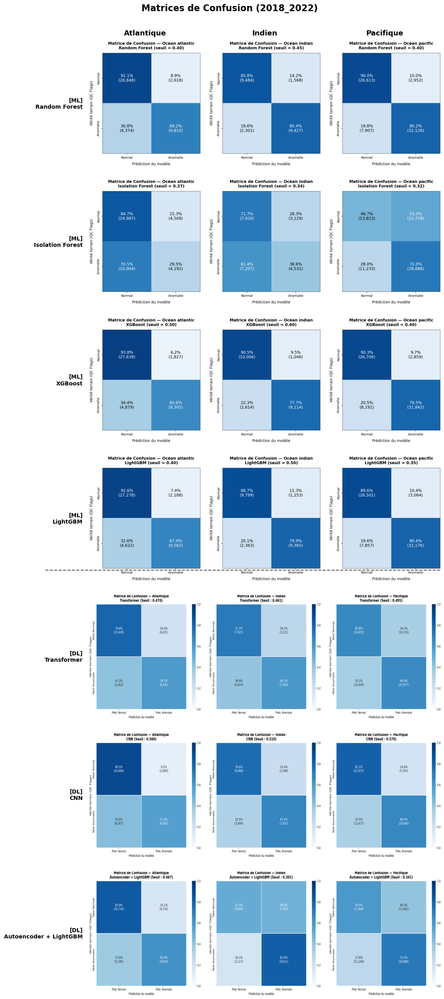

✔ Saved → /home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/confusion_matrices_all_models_uniform_2018_2022.png


In [66]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.image import imread

# Rutas
ML_BASE = "/home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022"
DL_BASE = "/home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022"
OUTPUT_DIR = "/home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022"
YEARS = "2018_2022"

ROWS = [
    ("RF",                 "Random Forest",          "rf",                "ML"),
    ("IsolationForest",    "Isolation Forest",       "isolationforest",   "ML"),
    ("XGB",                "XGBoost",                "xg_boost",          "ML"),
    ("LightGBM",           "LightGBM",               "lightgbm",          "ML"),
    ("Transformer",        "Transformer",            "Transformer",       "DL"),
    ("CNN",                "CNN",                    "CNN",               "DL"),
    ("Autoencoder_LGBM",   "Autoencoder + LightGBM", "Autoencoder_LGBM",  "DL"),
]

OCEANS_LIST = ["atlantic", "indian", "pacific"]
OCEANS_FR   = {"atlantic": "Atlantique", "indian": "Indien", "pacific": "Pacifique"}


def autocrop_white_borders(img_np, threshold=245):
    """Elimina el espacio blanco excedente alrededor de una imagen."""
    if img_np.dtype == np.float32 or img_np.dtype == np.float64:
        img_bytes = (img_np * 255).astype(np.uint8)
    else:
        img_bytes = img_np

    # Convertir a escala de grises para detectar fondo blanco
    gray = np.mean(img_bytes[:, :, :3], axis=2) if img_bytes.ndim == 3 else img_bytes
    mask = gray < threshold

    if not np.any(mask):
        return img_np

    y_indices, x_indices = np.where(mask)
    y_min, y_max = y_indices.min(), y_indices.max()
    x_min, x_max = x_indices.min(), x_indices.max()

    return img_np[y_min:y_max+1, x_min:x_max+1]


def get_cell_image(model_key, slug, family, ocean_idx, ocean_key):
    """Extrae y recorta la matriz individual correspondiente a la celda (modelo, océano)."""
    if family == "ML":
        png_path = os.path.join(ML_BASE, f"confusion_matrices_model_{slug}.png")
        if not os.path.exists(png_path):
            return None
        img = imread(png_path)
        # Dividir la imagen horizontal de ML en 3 partes
        w = img.shape[1]
        col_w = w // 3
        sub_img = img[:, ocean_idx * col_w : (ocean_idx + 1) * col_w]
        return autocrop_white_borders(sub_img)
    else:
        png_path = os.path.join(DL_BASE, model_key, ocean_key, "cm_general.png")
        if not os.path.exists(png_path):
            return None
        img = imread(png_path)
        return autocrop_white_borders(img)


# Construcción de la figura 7x3 
N_rows = len(ROWS)
N_cols = len(OCEANS_LIST)

fig, axes = plt.subplots(N_rows, N_cols, figsize=(11, 3.6 * N_rows))

fig.suptitle(f"Matrices de Confusion ({YEARS})",
             fontsize=16, fontweight="bold", y=0.998)

ML_count = sum(1 for r in ROWS if r[3] == "ML")

for row_i, (model_key, nom_affichage, slug, family) in enumerate(ROWS):
    for col_j, ocean_key in enumerate(OCEANS_LIST):
        ax = axes[row_i, col_j]
        img = get_cell_image(model_key, slug, family, col_j, ocean_key)

        if img is not None:
            ax.imshow(img, aspect="auto")
        else:
            ax.text(0.5, 0.5, f"Image introuvable\n{slug}/{ocean_key}",
                    ha="center", va="center", color="red", fontsize=8)

        # Título de las columnas (Océanos)
        if row_i == 0:
            ax.set_title(OCEANS_FR[ocean_key], fontsize=13, fontweight="bold", pad=12)

        # Etiqueta de la fila (Nombre del Modelo a la izquierda)
        if col_j == 0:
            fam_label = f"[{family}]\n{nom_affichage}"
            ax.set_ylabel(fam_label, fontsize=10, fontweight="bold",
                          labelpad=12, rotation=0, ha="right", va="center")

        ax.set_xticks([])
        ax.set_yticks([])

        # Quitar bordes para estética limpia
        for spine in ax.spines.values():
            spine.set_visible(False)

# Línea divisoria horizontal sutil entre ML y DL
y_sep = 1.0 - (ML_count / N_rows) + 0.005
fig.add_artist(plt.Line2D([0.08, 0.98], [y_sep, y_sep],
                          color="#555555", linestyle="--", linewidth=1.5,
                          transform=fig.transFigure))

# Ajuste fino de distancias para uniformidad perfecta
plt.subplots_adjust(wspace=0.08, hspace=0.12, left=0.18, right=0.98, top=0.96, bottom=0.01)

save_path = os.path.join(OUTPUT_DIR, f"confusion_matrices_all_models_uniform_{YEARS}.png")
fig.savefig(save_path, dpi=250, bbox_inches="tight")
plt.show()
plt.close(fig)
print(f"✔ Saved → {save_path}")

 Modelos ML hallados en BUNDLES: ['RF', 'IsolationForest', 'LightGBM', 'XG_boost']
  [atlantic] Pas de clé de prédiction binaire trouvée -> reconstruite via seuil=0.4670
  [indian] Pas de clé de prédiction binaire trouvée -> reconstruite via seuil=0.3008
  [pacific] Pas de clé de prédiction binaire trouvée -> reconstruite via seuil=0.3409


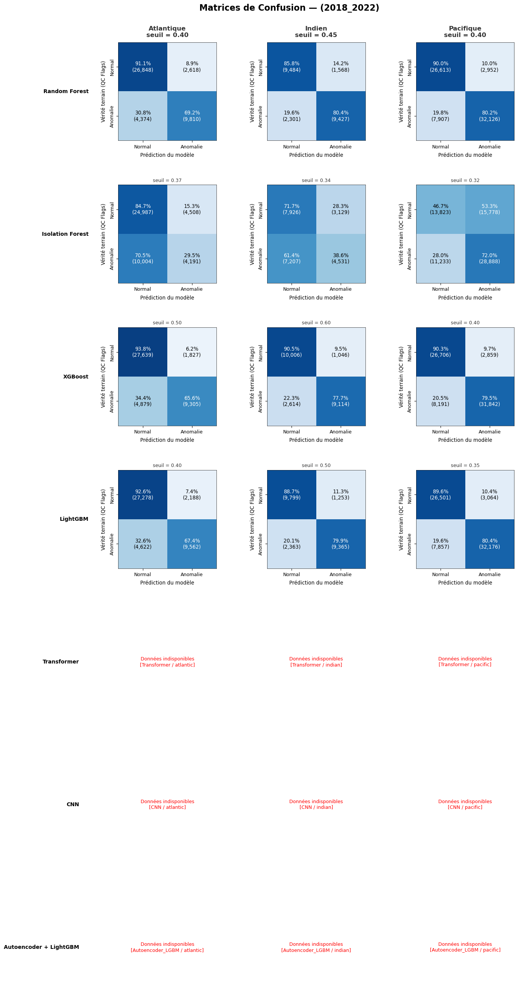

- Saved → /home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/confusion_matrices_all_models_final_2018_2022.png


In [39]:
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# ── 1. Buscador Flexible Normalizado para BUNDLES ────────────────────────────
def normalize_str(s):
    """Elimina mayúsculas, espacios, guiones y guiones bajos para comparar nombres."""
    return str(s).lower().replace("_", "").replace("-", "").replace(" ", "")

def find_ml_bundle(model_key, slug, ocean_key):
    """Busca en BUNDLES cualquier coincidencia normalizada."""
    if 'BUNDLES' not in globals() or not BUNDLES:
        return None

    target_models = {normalize_str(model_key), normalize_str(slug)}
    target_ocean = normalize_str(ocean_key)

    for (m_key, o_key), bundle_val in BUNDLES.items():
        if normalize_str(o_key) == target_ocean and normalize_str(m_key) in target_models:
            return bundle_val
            
    return None

def get_model_data(model_key, slug, family, ocean_key):
    """Extrae y_true, y_pred y threshold para ML y DL."""
    if family == "ML":
        b = find_ml_bundle(model_key, slug, ocean_key)
        if not b or KEY_Y_TRUE not in b or KEY_Y_PRED not in b:
            return None, None, None
        thr = b.get("chosen_threshold", float("nan"))
        return b[KEY_Y_TRUE], b[KEY_Y_PRED], thr
    else:
        loader = LOADERS_DL.get(model_key)
        if not loader:
            return None, None, None
        try:
            y_true, y_pred, _ = loader(ocean_key)
            thr = get_threshold(model_key, ocean_key)
            return y_true, y_pred, thr
        except Exception:
            return None, None, None

# ── 2. Dibujo de Celda con Etiquetas Completas y Seuil Discreto ───────────────
def plot_cm_clean(ax, y_true, y_pred, threshold=None):
    cm = confusion_matrix(y_true, y_pred, labels=[0, 1])
    cm_norm = cm.astype(float) / np.maximum(cm.sum(axis=1, keepdims=True), 1e-9)

    ax.imshow(cm_norm, cmap="Blues", vmin=0, vmax=1)
    ax.grid(False)

    # Porcentajes y números absolutos
    for i in range(2):
        for j in range(2):
            color = "white" if cm_norm[i, j] > 0.5 else "black"
            ax.text(j, i, f"{cm_norm[i, j]:.1%}\n({cm[i, j]:,})",
                    ha="center", va="center", fontsize=9.5, color=color)

    # Etiquetas completas
    ax.set_xticks([0, 1])
    ax.set_xticklabels(["Normal", "Anomalie"], rotation=0, fontsize=9)
    ax.set_yticks([0, 1])
    ax.set_yticklabels(["Normal", "Anomalie"], rotation=90, va="center", fontsize=9)

    ax.set_xlabel("Prédiction du modèle", fontsize=9.5, labelpad=6)
    ax.set_ylabel("Vérité terrain (QC Flags)", fontsize=9.5, labelpad=6)

    # Subtítulo discreto únicamente con el umbral
    if threshold is not None and not np.isnan(threshold):
        ax.set_title(f"seuil = {threshold:.2f}", fontsize=9, pad=6, color="#333333")

    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_color("black")
        spine.set_linewidth(0.5)

# ── Check de diagnóstico ──────────────────────────────────────────────────────
if 'BUNDLES' in globals() and BUNDLES:
    modelos_detectados = list(set(k[0] for k in BUNDLES.keys()))
    print(f" Modelos ML hallados en BUNDLES: {modelos_detectados}")

# ── 3. Generación de la Grilla 7x3 ───────────────────────────────────────────
N_rows = len(ROWS)
N_cols = len(OCEANS_LIST)

fig, axes = plt.subplots(N_rows, N_cols, figsize=(4.3 * N_cols, 3.8 * N_rows))

fig.suptitle(f"Matrices de Confusion — ({YEARS})",
             fontsize=16, fontweight="bold", y=0.998)

ML_count = sum(1 for r in ROWS if r[3] == "ML")

for row_i, (model_key, nom_affichage, slug, family) in enumerate(ROWS):
    for col_j, ocean_key in enumerate(OCEANS_LIST):
        ax = axes[row_i, col_j]
        y_true, y_pred, thr = get_model_data(model_key, slug, family, ocean_key)

        if y_true is not None and y_pred is not None:
            plot_cm_clean(ax, y_true, y_pred, threshold=thr)
        else:
            ax.axis("off")
            ax.text(0.5, 0.5, f"Données indisponibles\n[{slug} / {ocean_key}]",
                    ha="center", va="center", fontsize=9, color="red")

        # Título del Océano (solo en la primera fila)
        if row_i == 0:
            ocean_title = OCEANS_FR[ocean_key]
            sub_t = ax.get_title()
            ax.set_title(f"{ocean_title}\n{sub_t}" if sub_t else ocean_title,
                         fontsize=12, fontweight="bold", pad=10)

        # Nombre del Modelo sin etiquetas [ML]/[DL] y más cerca del eje (-0.30 en lugar de -0.55)
        if col_j == 0:
            ax.text(-0.30, 0.5, nom_affichage,
                    transform=ax.transAxes, fontsize=10, fontweight="bold",
                    va="center", ha="right")

# Se ajustó left=0.14 para eliminar el espacio blanco sobrante en el margen izquierdo
plt.subplots_adjust(wspace=0.35, hspace=0.45, left=0.14, right=0.97, top=0.96, bottom=0.02)

save_path = os.path.join(OUTPUT_DIR, f"confusion_matrices_all_models_final_{YEARS}.png")
fig.savefig(save_path, dpi=250, bbox_inches="tight")
plt.show()
plt.close(fig)
print(f"- Saved → {save_path}")

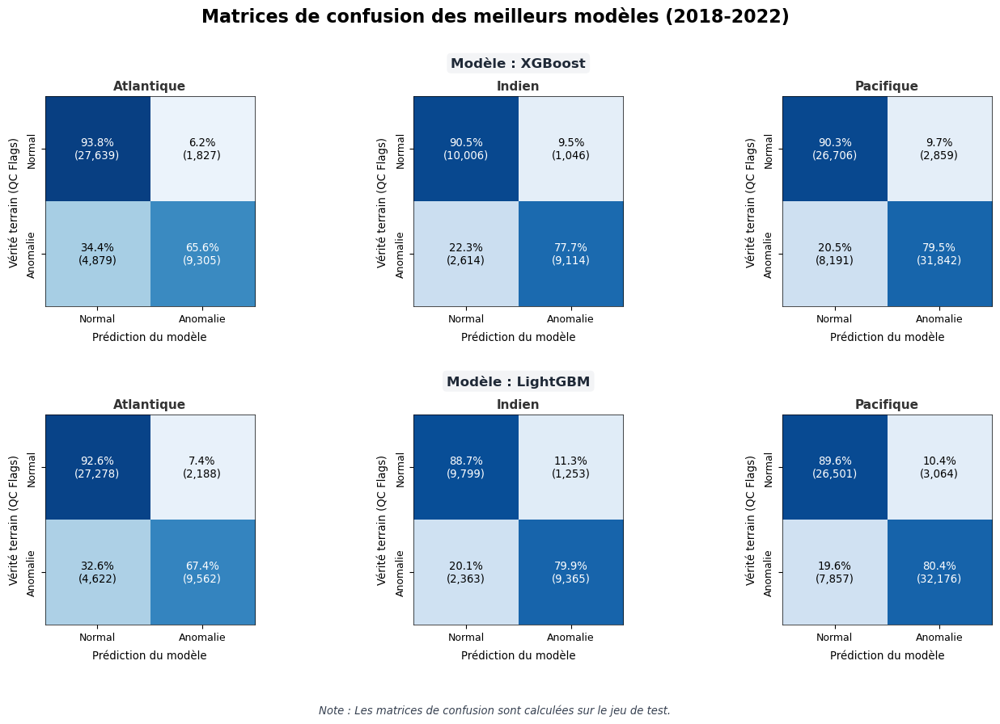

- Saved → /home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/confusion_matrices_xgboost_lightgbm_2018_2022.png


In [52]:
# ── MATRICES DE CONFUSIÓN: XGBoost + LightGBM (ML only) ────────────────────
MODELS_COMPARISON = [
    ("XG_boost", "Modèle : XGBoost", "XG_boost", "ML"),
    ("LightGBM", "Modèle : LightGBM", "LightGBM", "ML"),
]

N_rows_comp = len(MODELS_COMPARISON)
N_cols_comp = len(OCEANS_LIST)
mid_col = N_cols_comp // 2

fig, axes = plt.subplots(
    N_rows_comp, N_cols_comp, 
    figsize=(4.8 * N_cols_comp, 4.6 * N_rows_comp)
)

fig.suptitle(
    f"Matrices de confusion des meilleurs modèles (2018-2022)",
    fontsize=16, fontweight="bold", y=0.97
)

for row_i, (model_key, nom_affichage, slug, family) in enumerate(MODELS_COMPARISON):
    
    # Subtítulo del Modelo
    axes[row_i, mid_col].text(
        0.5, 1.13, nom_affichage,
        transform=axes[row_i, mid_col].transAxes,
        fontsize=12, fontweight="bold", ha="center", va="bottom",
        color="#1f2937",
        bbox=dict(boxstyle="round,pad=0.3", facecolor="#f3f4f6", edgecolor="none")
    )

    for col_j, ocean_key in enumerate(OCEANS_LIST):
        ax = axes[row_i, col_j]
        y_true, y_pred, thr = get_model_data(model_key, slug, family, ocean_key)

        if y_true is not None and y_pred is not None:
            plot_cm_clean(ax, y_true, y_pred, threshold=thr)
        else:
            ax.axis("off")
            ax.text(
                0.5, 0.5, f"Données indisponibles\n[{slug} / {ocean_key}]",
                ha="center", va="center", fontsize=9, color="red"
            )

        # Nombre del Océano
        ocean_title = OCEANS_FR[ocean_key]
        ax.set_title(ocean_title, fontsize=11, fontweight="bold", pad=6)

# Nota ubicada holgadamente en el nuevo espacio inferior
fig.text(
    0.5, 0.02,
    "Note : Les matrices de confusion sont calculées sur le jeu de test.",
    ha="center", fontsize=9.5, style="italic", color="#374151"
)

# Ajuste de márgenes: 'bottom=0.14' despeja la zona inferior para la nota
plt.subplots_adjust(
    left=0.08,
    right=0.96, 
    top=0.85, 
    bottom=0.14,  # Empuja las matrices hacia arriba dejando aire suficiente
    wspace=0.28, 
    hspace=0.52
)

save_path = os.path.join(OUTPUT_DIR, f"confusion_matrices_xgboost_lightgbm_{YEARS}.png")
fig.savefig(save_path, dpi=250, bbox_inches="tight")
plt.show()
plt.close(fig)
print(f"- Saved → {save_path}")

## 13. Courbes ROC par Océan — Tous Modèles

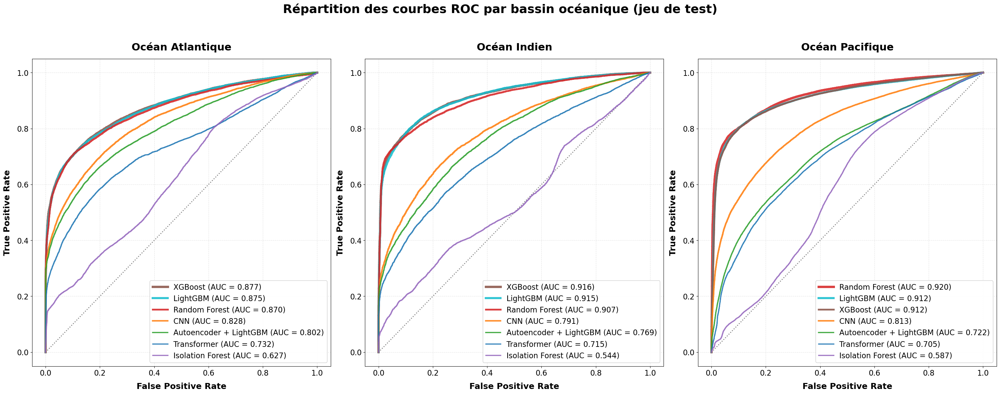

Graphique enregistré : /home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/roc_curves_by_ocean.png


In [63]:
plot_roc_by_ocean(all_metrics, MODELS, OUTPUT_DIR)

## 14. Erreurs de Prédiction par Océan — Tous Modèles

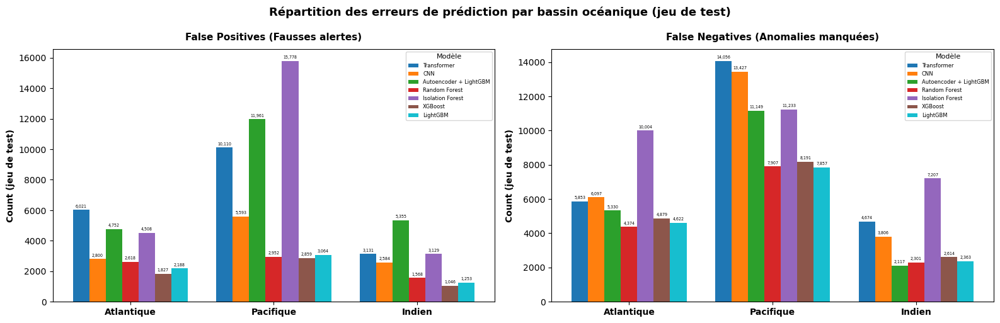

Graphique enregistré : /home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/errors_by_ocean.png


In [75]:
plot_errors_by_ocean(all_metrics, MODELS, OUTPUT_DIR)

In [146]:
def load_bundle(model_key, ocean_key):
    path = os.path.join(MODEL_DIR_ML[(model_key, ocean_key)], BUNDLE_FILENAME)
    if not os.path.exists(path):
        print(f"  [WARNING] missing {path}")
        return None
    return joblib.load(path)   # ← usa joblib, NO pickle

➔ Charge [DL | Modèle: 'Transformer' (Transformer) | Océan: 'atlantic']...
➔ Charge [DL | Modèle: 'Transformer' (Transformer) | Océan: 'indian']...
➔ Charge [DL | Modèle: 'Transformer' (Transformer) | Océan: 'pacific']...
➔ Charge [DL | Modèle: 'CNN' (CNN) | Océan: 'atlantic']...
➔ Charge [DL | Modèle: 'CNN' (CNN) | Océan: 'indian']...
➔ Charge [DL | Modèle: 'CNN' (CNN) | Océan: 'pacific']...
➔ Charge [DL | Modèle: 'Autoencoder_LGBM' (Autoencoder + LightGBM) | Océan: 'atlantic']...
  [atlantic] Pas de clé de prédiction binaire trouvée -> reconstruite via seuil=0.4670
➔ Charge [DL | Modèle: 'Autoencoder_LGBM' (Autoencoder + LightGBM) | Océan: 'indian']...
  [indian] Pas de clé de prédiction binaire trouvée -> reconstruite via seuil=0.3008
➔ Charge [DL | Modèle: 'Autoencoder_LGBM' (Autoencoder + LightGBM) | Océan: 'pacific']...
  [pacific] Pas de clé de prédiction binaire trouvée -> reconstruite via seuil=0.3409
➔ Charge [ML | Modèle: 'RF' (Random Forest) | Océan: 'atlantic']...
➔ Charge

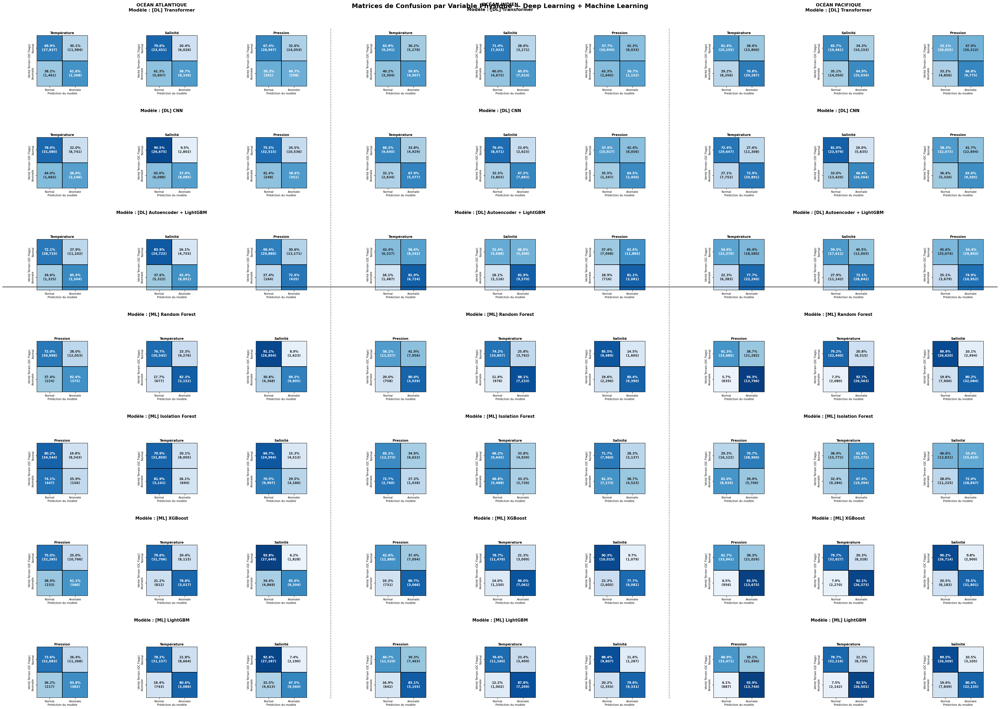


✔ Graphique combiné ML+DL enregistré : /home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/confusion_per_variable_grid_ML_DL.png


'/home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/confusion_per_variable_grid_ML_DL.png'

In [69]:
# ============================================================
# 11bis. Matrices de Confusion combinadas — Deep Learning + Machine Learning
# Reutiliza los mecanismos YA existentes en el notebook:
#   - DL: LOADERS_DL[...] + load_meta_dl(...)  (celdas 7 y 10)
#   - ML: BUNDLES (celda 27, cargado con joblib.load, NO pickle)
# ============================================================

def get_variable_truth_ml(bundle):
    """Devuelve un dict {VAR: y_true_array} para un bundle ML.
    Busca primero una clave 'variables_qc' explícita; si no existe,
    intenta reconstruirlo desde un DataFrame 'meta' con columnas is_bad_*
    (mismo formato que usan los pipelines DL)."""
    if bundle is None:
        return {}

    if "variables_qc" in bundle and bundle["variables_qc"]:
        return {k.upper(): np.asarray(v) for k, v in bundle["variables_qc"].items()}

    meta = bundle.get("meta") or bundle.get("test_meta")
    if meta is not None:
        variable_cols = [c for c in meta.columns if "is_bad" in c.lower() and c.lower() != "is_bad"]
        return {
            c.replace("_is_bad", "").replace("is_bad_", "").upper(): meta[c].values
            for c in variable_cols
        }

    return {}


def plot_confusion_combined_grid(models_dl, models_ml, output_dir, suffix=""):
    """
    Grilla única: filas = modelos DL seguidos de modelos ML, columnas = océanos,
    cada celda = subplots por variable física (TEMP, PRES, PSAL).
    """
    model_rows = [("DL", k, models_dl[k]) for k in models_dl] + \
                 [("ML", k, models_ml[k]) for k in models_ml]

    ocean_list = list(OCEANS.keys())
    n_models = len(model_rows)
    n_oceans = len(ocean_list)
    n_vars = 3

    fig_width = 4.2 * n_vars * n_oceans
    fig_height = 3.8 * n_models

    fig = plt.figure(figsize=(fig_width, fig_height))
    fig.suptitle(
        f"Matrices de Confusion par Variable Physique — Deep Learning + Machine Learning{suffix}",
        fontsize=17, fontweight="bold", y=0.995
    )

    subfigs = fig.subfigures(n_models, n_oceans, squeeze=False)

    for r, (kind, model_key, model_info) in enumerate(model_rows):
        nom_affichage = model_info["nom_affichage"]

        for c, ocean_key in enumerate(ocean_list):
            ocean_name = OCEANS_FR.get(ocean_key, ocean_key)
            subfig = subfigs[r, c]

            label = f"[{kind}] {nom_affichage}"
            if r == 0:
                subfig.suptitle(f"OCÉAN {ocean_name.upper()}\nModèle : {label}",
                                 fontsize=12, fontweight="bold", y=0.97)
            else:
                subfig.suptitle(f"Modèle : {label}", fontsize=11, fontweight="bold", y=0.93)

            axes = subfig.subplots(1, n_vars)
            axes = np.atleast_1d(axes)

            print(f"➔ Charge [{kind} | Modèle: '{model_key}' ({nom_affichage}) | Océan: '{ocean_key}']...")

            var_truth = {}
            y_pred = None
            try:
                if kind == "DL":
                    _, y_pred, _ = LOADERS_DL[model_key](ocean_key)
                    meta = load_meta_dl(model_key, ocean_key)
                    if meta is not None:
                        variable_cols = [col for col in meta.columns
                                          if "is_bad" in col.lower() and col.lower() != "is_bad"]
                        var_truth = {
                            col.replace("_is_bad", "").replace("is_bad_", "").upper(): meta[col].values
                            for col in variable_cols
                        }
                else:  # kind == "ML"
                    bundle = BUNDLES.get((model_key, ocean_key))  # ya cargado con joblib en la celda 27
                    if bundle is None:
                        raise KeyError(f"bundle ausente en BUNDLES[({model_key!r}, {ocean_key!r})]")
                    y_pred = np.asarray(bundle[KEY_Y_PRED])
                    var_truth = get_variable_truth_ml(bundle)
            except Exception as e:
                print(f"  ✗ ÉCHEC [{kind} | Modèle: '{model_key}' | Océan: '{ocean_key}']: {e}")

            if not var_truth or y_pred is None:
                for ax in axes:
                    ax.axis("off")
                continue

            for idx, (var_code, y_true_var) in enumerate(list(var_truth.items())[:n_vars]):
                var_name_fr = VAR_TRANSLATIONS.get(var_code, var_code)
                plot_cm_ax(axes[idx], y_true_var, y_pred, var_name_fr)
            for idx in range(len(var_truth), n_vars):
                axes[idx].axis("off")

            subfig.subplots_adjust(wspace=0.28, left=0.08, right=0.98, top=0.65, bottom=0.15)

    # Línea horizontal separando bloque DL / bloque ML
    n_dl = len(models_dl)
    y_sep = 1 - (n_dl / n_models) * 0.94  # aproxima el borde inferior del bloque DL en coords de figura
    fig.lines.append(Line2D([0.01, 0.99], [y_sep, y_sep], color="black",
                             linestyle="-", linewidth=1.6, alpha=0.85, transform=fig.transFigure))

    # Líneas verticales entre océanos
    for c in range(1, n_oceans):
        x_pos = c / n_oceans
        fig.lines.append(Line2D([x_pos, x_pos], [0.02, 0.96], color="#444444",
                                 linestyle="--", linewidth=1.3, alpha=0.7, transform=fig.transFigure))

    save_path = os.path.join(output_dir, f"confusion_per_variable_grid_ML_DL{suffix.replace(' ', '_')}.png")
    fig.savefig(save_path, dpi=200, bbox_inches="tight")
    plt.show()
    plt.close(fig)
    print(f"\n✔ Graphique combiné ML+DL enregistré : {save_path}")
    return save_path


# Ejecución
plot_confusion_combined_grid(MODELS_DL, MODELS_ML, OUTPUT_DIR, suffix="")

## 15. Taux d'Erreurs Normalisés (FPR / FNR) — Tous Modèles

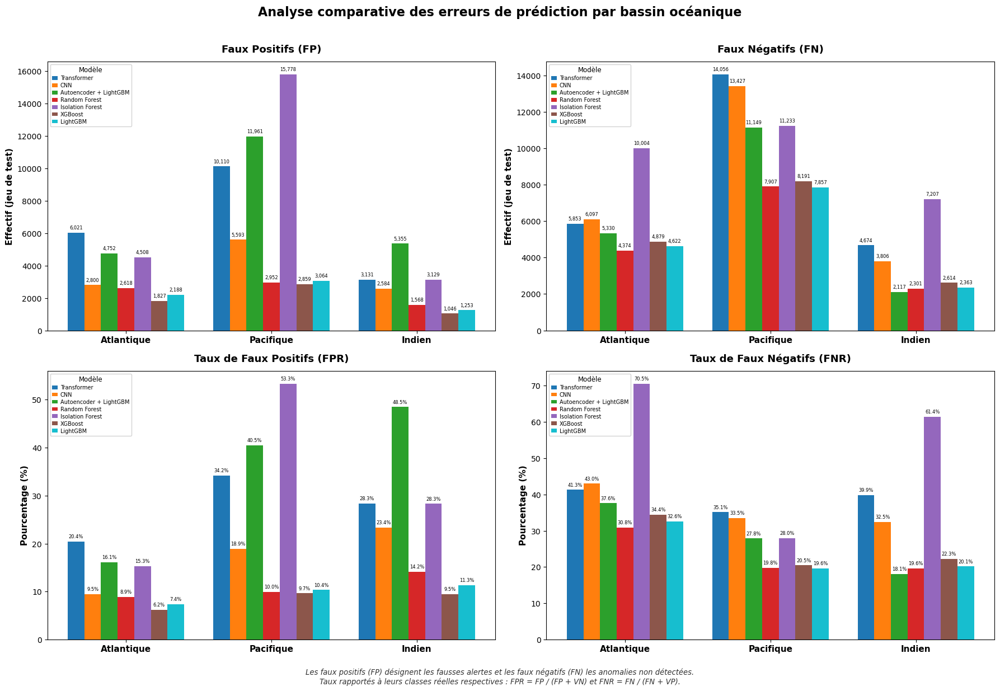

Graphique enregistré : /home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/errors_counts_and_rates_by_ocean.png


In [80]:
def plot_error_rates_by_ocean(all_metrics, models_dict, output_dir, suffix=""):
    all_metrics = all_metrics.copy()
    all_metrics["fp_pct"] = (all_metrics["FP"] / (all_metrics["FP"] + all_metrics["TN"])) * 100
    all_metrics["fn_pct"] = (all_metrics["FN"] / (all_metrics["FN"] + all_metrics["TP"])) * 100

    model_list = list(models_dict.keys())
    num_models = len(model_list)

    # Lienzo ampliado en alto y ancho, con tipografía escalada proporcionalmente
    if num_models > 3:
        fig_width, fig_height = 18, 12.5
        num_fontsize = 6
    else:
        fig_width, fig_height = 14, 10.5
        num_fontsize = 8

    fig, axes = plt.subplots(2, 2, figsize=(fig_width, fig_height))
    plot_specs = [
        (axes[0, 0], "FP", "Faux Positifs (FP)", "Effectif (jeu de test)", "{:,.0f}"),
        (axes[0, 1], "FN", "Faux Négatifs (FN)", "Effectif (jeu de test)", "{:,.0f}"),
        (axes[1, 0], "fp_pct", "Taux de Faux Positifs (FPR)", "Pourcentage (%)", "{:.1f}%"),
        (axes[1, 1], "fn_pct", "Taux de Faux Négatifs (FNR)", "Pourcentage (%)", "{:.1f}%"),
    ]

    width = 0.8 / num_models
    x = np.arange(len(OCEANS))

    for ax, comp, title, ylabel, fmt in plot_specs:
        for i, model_key in enumerate(model_list):
            sub = all_metrics[all_metrics.Model == model_key].set_index("Ocean")
            vals = [sub.loc[o, comp] if o in sub.index else 0 for o in OCEANS]

            nom_affichage = models_dict[model_key]["nom_affichage"]
            color = models_dict[model_key].get("color")
            bars = ax.bar(x + i * width, vals, width, label=nom_affichage, color=color)
            
            # Etiquetas sobre barras con mayor espacio vertical
            ax.bar_label(bars, fmt=fmt, fontsize=num_fontsize, padding=3)

        ax.set_xticks(x + width * (num_models - 1) / 2)
        ax.set_xticklabels([OCEANS_FR.get(o, o) for o in OCEANS], fontsize=11, fontweight="bold")
        ax.set_ylabel(ylabel, fontsize=11, fontweight="bold")
        ax.set_title(title, fontsize=13, fontweight="bold", pad=12)
        ax.legend(title="Modèle", fontsize=7, title_fontsize=8.5, loc="upper left",
                   frameon=True, facecolor="white", framealpha=0.85, borderpad=0.4,
                   labelspacing=0.3, handlelength=1.0, handletextpad=0.5)

    fig.suptitle(f"Analyse comparative des erreurs de prédiction par bassin océanique{suffix}",
                 fontsize=16, fontweight="bold")

    note_fr = ("Les faux positifs (FP) désignent les fausses alertes et les faux négatifs (FN) les anomalies non détectées.\n"
               "Taux rapportés à leurs classes réelles respectives : FPR = FP / (FP + VN) et FNR = FN / (FN + VP).")
    fig.text(0.5, 0.01, note_fr, ha="center", fontsize=9.5, style="italic", color="#333333")

    fig.tight_layout(rect=[0, 0.04, 1, 0.97])

    save_path = os.path.join(output_dir, f"errors_counts_and_rates_by_ocean{suffix.replace(' ', '_')}.png")
    fig.savefig(save_path, dpi=300, bbox_inches="tight")
    plt.show()
    print(f"Graphique enregistré : {save_path}")


plot_error_rates_by_ocean(all_metrics, MODELS, OUTPUT_DIR)

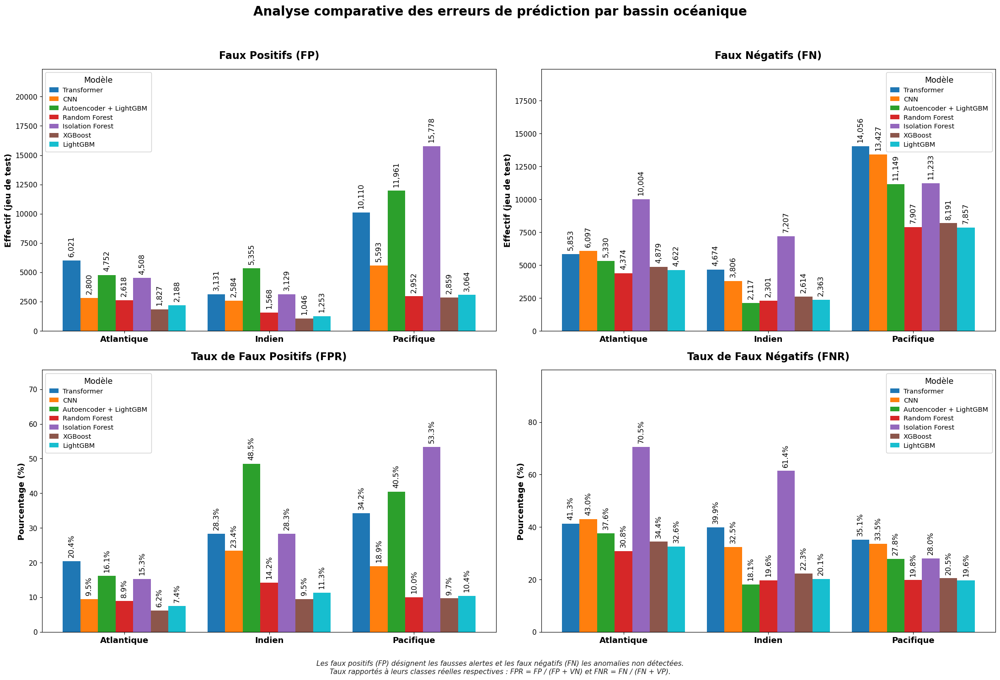

✔ Graphique enregistré : /home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/errors_counts_and_rates_by_ocean.png

=== TABLEAU RÉCAPITULATIF DES ERREURS PAR OCÉAN ET PAR MODÈLE ===


,Modèle,Océan,FP (Fausses alertes),FN (Manquées),FPR (%),FNR (%)
0,Transformer,Atlantique,"6,021","5,853",20.43%,41.26%
1,Transformer,Indien,"3,131","4,674",28.33%,39.85%
2,Transformer,Pacifique,"10,110","14,056",34.20%,35.11%
3,CNN,Atlantique,"2,800","6,097",9.50%,42.99%
4,CNN,Indien,"2,584","3,806",23.38%,32.45%
5,CNN,Pacifique,"5,593","13,427",18.92%,33.54%
6,Autoencoder + LightGBM,Atlantique,"4,752","5,330",16.13%,37.58%
7,Autoencoder + LightGBM,Indien,"5,355","2,117",48.45%,18.05%
8,Autoencoder + LightGBM,Pacifique,"11,961","11,149",40.46%,27.85%
9,Random Forest,Atlantique,"2,618","4,374",8.88%,30.84%


In [124]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display


def plot_error_rates_by_ocean(all_metrics, models_dict, output_dir, suffix=""):
    all_metrics = all_metrics.copy()
    all_metrics["fp_pct"] = (all_metrics["FP"] / (all_metrics["FP"] + all_metrics["TN"])) * 100
    all_metrics["fn_pct"] = (all_metrics["FN"] / (all_metrics["FN"] + all_metrics["TP"])) * 100

    model_list = list(models_dict.keys())
    num_models = len(model_list)

    # 1. Lienzo sensiblemente más amplio
    if num_models > 3:
        fig_width, fig_height = 22, 15
        num_fontsize = 11.5  # Números sobre barras más grandes
    else:
        fig_width, fig_height = 18, 13
        num_fontsize = 13

    fig, axes = plt.subplots(2, 2, figsize=(fig_width, fig_height))
    plot_specs = [
        (axes[0, 0], "FP", "Faux Positifs (FP)", "Effectif (jeu de test)", "{:,.0f}"),
        (axes[0, 1], "FN", "Faux Négatifs (FN)", "Effectif (jeu de test)", "{:,.0f}"),
        (axes[1, 0], "fp_pct", "Taux de Faux Positifs (FPR)", "Pourcentage (%)", "{:.1f}%"),
        (axes[1, 1], "fn_pct", "Taux de Faux Négatifs (FNR)", "Pourcentage (%)", "{:.1f}%"),
    ]

    width = 0.85 / num_models
    x = np.arange(len(OCEANS))

    for ax, comp, title, ylabel, fmt in plot_specs:
        for i, model_key in enumerate(model_list):
            sub = all_metrics[all_metrics.Model == model_key].set_index("Ocean")
            vals = [sub.loc[o, comp] if o in sub.index else 0 for o in OCEANS]

            nom_affichage = models_dict[model_key]["nom_affichage"]
            color = models_dict[model_key].get("color")
            bars = ax.bar(x + i * width, vals, width, label=nom_affichage, color=color)
            
            # 2. Etiquetas verticales sobre las barras más grandes y legibles
            ax.bar_label(
                bars, 
                fmt=fmt, 
                fontsize=num_fontsize, 
               # fontweight="bold",
                padding=6, 
                rotation=90
            )

        # 3. Tipografía ampliada para nombres de océanos y ejes
        ax.set_xticks(x + width * (num_models - 1) / 2)
        ax.set_xticklabels([OCEANS_FR.get(o, o) for o in OCEANS], fontsize=13, fontweight="bold")
        ax.set_ylabel(ylabel, fontsize=13, fontweight="bold")
        ax.set_title(title, fontsize=16, fontweight="bold", pad=16)
        
        # 4. Margen superior ampliado para alojar los números gigantes sin choque
        y_max = ax.get_ylim()[1]
        ax.set_ylim(0, y_max * 1.35)

        # 5. Leyenda con mayor tamaño de fuente
        ax.legend(
            title="Modèle", 
            fontsize=10.5, 
            title_fontsize=12.5, 
            loc="best",
            frameon=True, 
            facecolor="white", 
            framealpha=0.92, 
            borderpad=0.6,
            labelspacing=0.4, 
            handlelength=1.4, 
            handletextpad=0.6
        )
        
        # Ajuste visual de los ticks en Y
        ax.tick_params(axis='y', labelsize=11)

    # 6. Título principal y notas agrandados
    fig.suptitle(
        f"Analyse comparative des erreurs de prédiction par bassin océanique{suffix}",
        fontsize=20, 
        fontweight="bold", 
        y=0.985
    )

    note_fr = (
        "Les faux positifs (FP) désignent les fausses alertes et les faux négatifs (FN) les anomalies non détectées.\n"
        "Taux rapportés à leurs classes réelles respectives : FPR = FP / (FP + VN) et FNR = FN / (FN + VP)."
    )
    fig.text(0.5, 0.008, note_fr, ha="center", fontsize=11, style="italic", color="#222222")

    fig.tight_layout(rect=[0, 0.04, 1, 0.96])

    save_path = os.path.join(output_dir, f"errors_counts_and_rates_by_ocean{suffix.replace(' ', '_')}.png")
    fig.savefig(save_path, dpi=300, bbox_inches="tight")
    plt.show()
    print(f"✔ Graphique enregistré : {save_path}\n")

    # Generación del DataFrame resumido para Jupyter
    df_table = all_metrics[["Model", "Ocean", "FP", "FN", "fp_pct", "fn_pct"]].copy()
    df_table["Ocean"] = df_table["Ocean"].map(lambda o: OCEANS_FR.get(o, o))
    df_table["Model"] = df_table["Model"].map(lambda m: models_dict.get(m, {}).get("nom_affichage", m))
    
    df_table = df_table.rename(columns={
        "Model": "Modèle",
        "Ocean": "Océan",
        "FP": "FP (Fausses alertes)",
        "FN": "FN (Manquées)",
        "fp_pct": "FPR (%)",
        "fn_pct": "FNR (%)"
    })

    df_formatted = df_table.copy()
    df_formatted["FP (Fausses alertes)"] = df_formatted["FP (Fausses alertes)"].apply(lambda v: f"{v:,.0f}")
    df_formatted["FN (Manquées)"] = df_formatted["FN (Manquées)"].apply(lambda v: f"{v:,.0f}")
    df_formatted["FPR (%)"] = df_formatted["FPR (%)"].apply(lambda v: f"{v:.2f}%")
    df_formatted["FNR (%)"] = df_formatted["FNR (%)"].apply(lambda v: f"{v:.2f}%")

    print("=== TABLEAU RÉCAPITULATIF DES ERREURS PAR OCÉAN ET PAR MODÈLE ===")
    display(df_formatted)


plot_error_rates_by_ocean(all_metrics, MODELS, OUTPUT_DIR)

## 16. Comparaison Groupée des Métriques (barres) — Tous Modèles

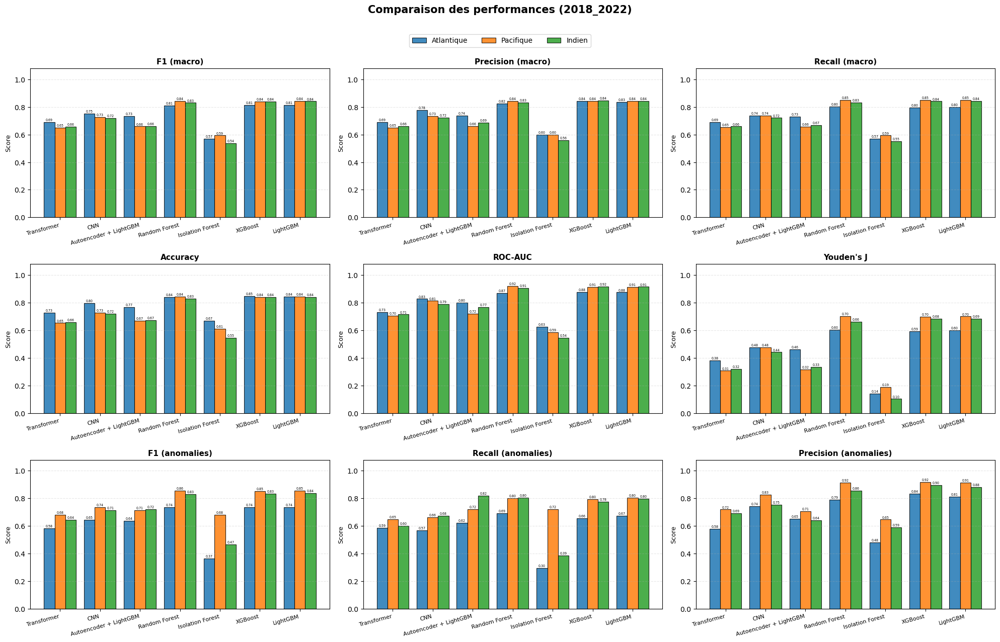

Graphique enregistré : /home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/metrics_comparison_grouped_bars.png


In [85]:
plot_metrics_comparison_grouped(all_metrics, MODELS, OUTPUT_DIR)

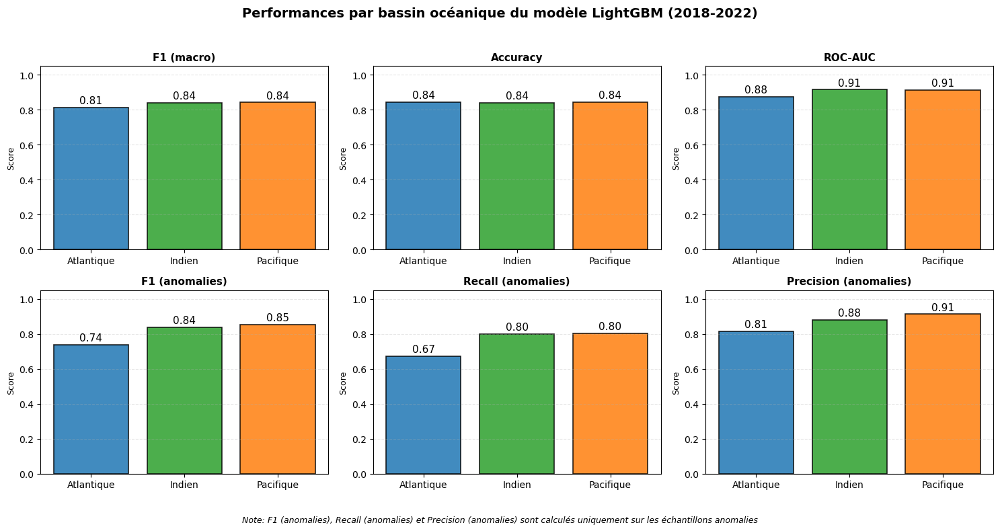

Graphique enregistré : /home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/lightgbm_by_ocean.png


In [30]:
def plot_lightgbm_by_ocean(all_metrics, output_dir, suffix=""):
    """Plot métriques LightGBM por océano - 2x3 grid"""
    metrics_to_plot = [
        ("F1_macro", "F1 (macro)"),
        ("Accuracy", "Accuracy"),
        ("ROC_AUC", "ROC-AUC"),
        ("F1_anom", "F1 (anomalies)"),
        ("Recall_anom", "Recall (anomalies)"),
        ("Precision_anom", "Precision (anomalies)"),
    ]
    
    lightgbm_data = all_metrics[all_metrics["Model"] == "LightGBM"]
    ocean_order = [o for o in OCEANS if o in lightgbm_data["Ocean"].unique()]
    
    fig, axes = plt.subplots(2, 3, figsize=(15, 8))
    fig.suptitle(f"Performances par bassin océanique du modèle LightGBM{suffix} (2018-2022)", #({YEARS})
                 fontsize=14, fontweight="bold")
    
    for (col_key, col_label), ax in zip(metrics_to_plot, axes.flat):
        values = []
        labels = []
        colors = []
        
        for ocean_key in ocean_order:
            row = lightgbm_data[lightgbm_data["Ocean"] == ocean_key]
            if not row.empty:
                values.append(row[col_key].values[0])
                labels.append(OCEANS_FR.get(ocean_key, ocean_key))
                colors.append(OCEANS[ocean_key])
        
        bars = ax.bar(labels, values, color=colors, alpha=0.85, 
                      edgecolor="black", linewidth=1.2)
        ax.bar_label(bars, fmt="{:.2f}", fontsize=11, padding=2)
        
        ax.set_ylim([0, 1.05])
        ax.set_ylabel("Score", fontsize=9)
        ax.set_title(col_label, fontsize=11, fontweight="bold")
        ax.grid(alpha=0.3, axis="y", linestyle="--")
    
    # Nota explicativa
    fig.text(0.5, 0.02, 
         "Note: F1 (anomalies), Recall (anomalies) et Precision (anomalies) sont calculés uniquement sur les échantillons anomalies",
         ha='center', fontsize=9, style='italic', 
         bbox=dict(boxstyle='round', facecolor='white', alpha=0.3, edgecolor='none'))
    
    plt.tight_layout(rect=[0, 0.06, 1, 0.96])
    save_path = os.path.join(output_dir, f"lightgbm_by_ocean{suffix.replace(' ', '_')}.png")
    fig.savefig(save_path, dpi=150, bbox_inches="tight")
    plt.show()
    plt.close(fig)
    print(f"Graphique enregistré : {save_path}")

# Ejecutar
plot_lightgbm_by_ocean(all_metrics_ml, OUTPUT_DIR)

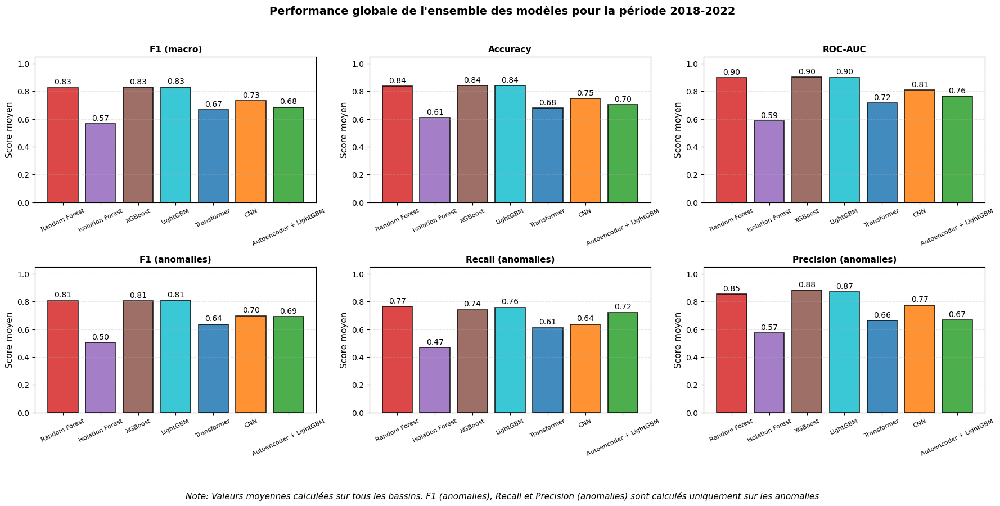

Graphique enregistré : /home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/all_models_combined_average.png


In [35]:
def plot_all_models_combined_average(all_metrics_ml, all_metrics_dl, models_ml, models_dl, output_dir):
    """Plot métriques - promedio general, ML y DL juntos"""
    metrics_to_plot = [
        ("F1_macro", "F1 (macro)"),
        ("Accuracy", "Accuracy"),
        ("ROC_AUC", "ROC-AUC"),
        ("F1_anom", "F1 (anomalies)"),
        ("Recall_anom", "Recall (anomalies)"),
        ("Precision_anom", "Precision (anomalies)"),
    ]
    
    # Combinar ML y DL
    all_metrics = pd.concat([all_metrics_ml, all_metrics_dl], ignore_index=True)
    models_dict = {**models_ml, **models_dl}
    
    model_order = [m for m in models_dict if m in all_metrics["Model"].unique()]
    n_models = len(model_order)
    
    # Colores por modelo
    model_colors = [models_dict[m].get("color", "#1f77b4") for m in model_order]
    
    # Ajustar tamaño según cantidad de modelos
    if n_models > 5:
        fig_width = 18
    else:
        fig_width = 16
    
    fig, axes = plt.subplots(2, 3, figsize=(fig_width, 9))
    fig.suptitle(f"Performance globale de l\'ensemble des modèles pour la période 2018-2022", #({YEARS})
                 fontsize=14, fontweight="bold")
    
    for (col_key, col_label), ax in zip(metrics_to_plot, axes.flat):
        values = []
        
        for model_key in model_order:
            model_data = all_metrics[all_metrics["Model"] == model_key]
            avg_value = model_data[col_key].mean()
            values.append(avg_value)
        
        bars = ax.bar([models_dict[m]["nom_affichage"] for m in model_order], 
                      values, color=model_colors, alpha=0.85, 
                      edgecolor="black", linewidth=1.2)
        ax.bar_label(bars, fmt="{:.2f}", fontsize=10, padding=2)
        
        ax.set_ylim([0, 1.05])
        ax.set_ylabel("Score moyen", fontsize=11)
        ax.set_title(col_label, fontsize=11, fontweight="bold")
        ax.grid(alpha=0.3, axis="y", linestyle="--")
        ax.tick_params(axis='x', rotation=25, labelsize=8)
    
    # Nota explicativa
    fig.text(0.5, 0.005, "Note: Valeurs moyennes calculées sur tous les bassins. F1 (anomalies), Recall et Precision (anomalies) sont calculés uniquement sur les anomalies",
         ha='center', fontsize=11, style='italic')
    
    plt.tight_layout(rect=[0, 0.07, 1, 0.96])
    save_path = os.path.join(output_dir, f"all_models_combined_average.png")
    fig.savefig(save_path, dpi=150, bbox_inches="tight")
    plt.show()
    plt.close(fig)
    print(f"Graphique enregistré : {save_path}")

# Ejecutar - ML y DL juntos
plot_all_models_combined_average(all_metrics_ml, all_metrics_dl, MODELS_ML, MODELS_DL, OUTPUT_DIR)

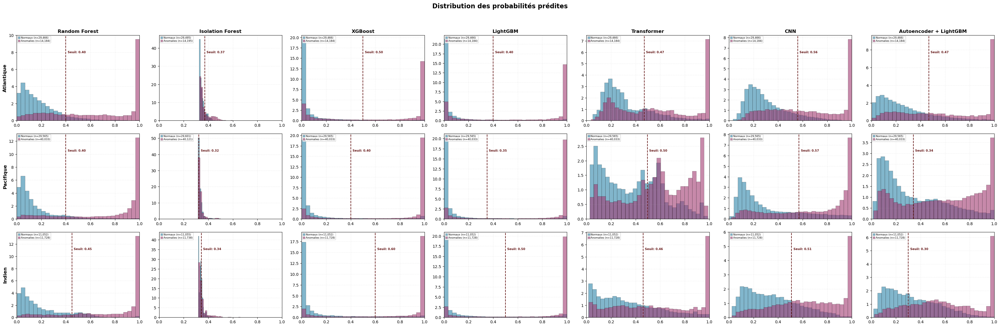

Saved → /home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/probability_distributions_grid.png


In [96]:
def build_proba_registry_ml():
    registry = {}
    for model_key in MODELS_ML:
        for ocean_key in OCEANS:
            b = BUNDLES.get((model_key, ocean_key))
            if b is None or KEY_Y_TRUE not in b or KEY_PROB not in b:
                continue
            registry[(model_key, ocean_key)] = {
                "y_true": np.asarray(b[KEY_Y_TRUE]),
                "y_proba": np.asarray(b[KEY_PROB]),
                "threshold": b.get("chosen_threshold"),
            }
    return registry


# 1. Registro de probabilidades (primero ML, luego DL)
PROBA_REGISTRY_ML = build_proba_registry_ml()
PROBA_REGISTRY = {**PROBA_REGISTRY_ML, **PROBA_REGISTRY_DL}

# 2. Diccionario de modelos en orden (primero ML, luego DL)
ALL_MODELS = {**MODELS_ML, **MODELS_DL}

# 3. Generar la gráfica con el nuevo orden
plot_probability_distribution_grid(ALL_MODELS, PROBA_REGISTRY, OUTPUT_DIR)

## 17. Table Résumé Final

In [84]:
print("\n" + "="*120)
print("RÉSUMÉ FINAL — DEEP LEARNING + MACHINE LEARNING")
print("="*120)
print("\n" + all_metrics.drop(columns=["fpr_curve", "tpr_curve"]).round(3).to_string(index=False))
print("\n" + "="*120)


RÉSUMÉ FINAL — DEEP LEARNING + MACHINE LEARNING

           Model          Nom_affichage    Ocean  Accuracy  Precision_macro  Recall_macro  F1_macro  ROC_AUC  Youden_j  Precision_anom  Recall_anom  F1_anom    TP    FP    FN    TN  n_test
     Transformer            Transformer atlantic     0.728            0.690         0.692     0.691    0.732     0.383           0.580        0.587    0.584  8331  6021  5853 23445   43650
     Transformer            Transformer  pacific     0.653            0.650         0.653     0.650    0.705     0.307           0.720        0.649    0.683 25977 10110 14056 19455   69598
     Transformer            Transformer   indian     0.657            0.661         0.659     0.657    0.715     0.318           0.693        0.601    0.644  7054  3131  4674  7921   22780
             CNN                    CNN atlantic     0.796            0.778         0.738     0.751    0.828     0.475           0.743        0.570    0.645  8087  2800  6097 26666   43650
     

  [atlantic] Pas de clé de prédiction binaire trouvée -> reconstruite via seuil=0.4670
  [indian] Pas de clé de prédiction binaire trouvée -> reconstruite via seuil=0.3008
  [pacific] Pas de clé de prédiction binaire trouvée -> reconstruite via seuil=0.3409


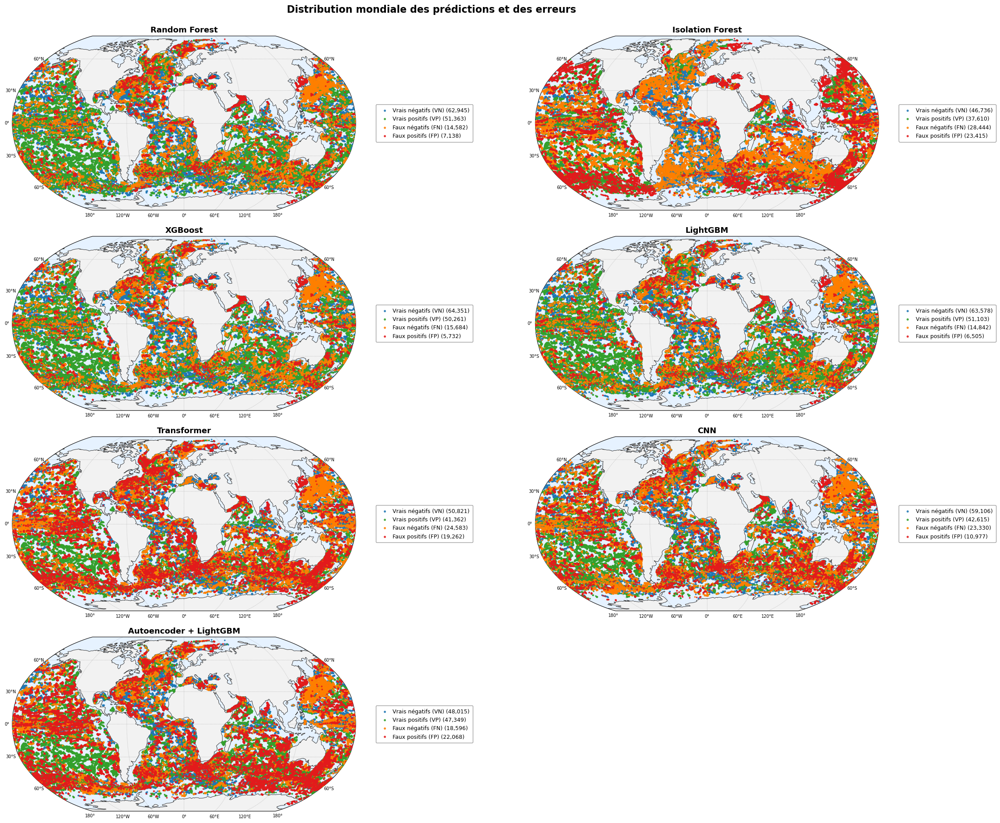

Carte combinée enregistrée : /home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/map_global_overlay_ALL_MODELS_ML_DL.png


In [163]:
## 7ter. Mapa global integrado — TODOS los modelos (ML primero, luego DL) en UNA sola figura (Cartopy)

import os
import numpy as np
import pandas as pd
import joblib
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature


def get_preprocess_dir(ocean_name):
    years_dash = YEARS.replace("_", "-")
    return f"/work/drgarcia/Dataset/{ocean_name.lower()}_ocean/{years_dash}/2.preprocessed/split_time_ascA_dmodeD"


def load_model_data_ml(model_name, ocean_name):
    """Charge y_true / y_pred + coordonnées (lat/lon) pour un modèle ML (bundle .pkl)."""
    model_dir = MODEL_DIR_ML.get((model_name, ocean_name))
    preprocess_dir = get_preprocess_dir(ocean_name)

    if not model_dir or not os.path.exists(model_dir):
        print(f"  [AVERTISSEMENT] Dossier modèle introuvable: {model_dir}")
        return None

    bundle_path = os.path.join(model_dir, BUNDLE_FILENAME)
    if not os.path.exists(bundle_path):
        print(f"  [AVERTISSEMENT] Bundle introuvable: {bundle_path}")
        return None

    bundle = joblib.load(bundle_path)
    y_true = bundle.get(KEY_Y_TRUE)
    y_pred = bundle.get(KEY_Y_PRED)

    if y_true is None or y_pred is None:
        print(f"  [AVERTISSEMENT] y_true/y_pred manquants pour {model_name} - {ocean_name}")
        return None

    df_meta = None
    results_path = os.path.join(model_dir, "test_results.parquet")
    meta_path = os.path.join(preprocess_dir, "test_meta.parquet") if os.path.exists(preprocess_dir) else None

    if os.path.exists(results_path):
        df_meta = pd.read_parquet(results_path)
    elif meta_path and os.path.exists(meta_path):
        df_meta = pd.read_parquet(meta_path)

    lats, lons = None, None
    if df_meta is not None:
        for col in ["latitude", "LATITUDE", "lat", "LAT"]:
            if col in df_meta.columns:
                lats = df_meta[col].to_numpy()
                break
        for col in ["longitude", "LONGITUDE", "lon", "LON"]:
            if col in df_meta.columns:
                lons = df_meta[col].to_numpy()
                break

    if lats is None or lons is None:
        print(f"  [AVERTISSEMENT] Colonnes de coordonnées introuvables pour {model_name} - {ocean_name}")
        return None

    return {
        "y_true": np.asarray(y_true).squeeze(),
        "y_pred": np.asarray(y_pred).squeeze(),
        "lats": np.asarray(lats).squeeze(),
        "lons": np.asarray(lons).squeeze(),
    }


def load_model_data_dl(model_name, ocean_name):
    """Charge y_true / y_pred + coordonnées (lat/lon) pour un modèle DL, via LOADERS_DL + load_meta_dl."""
    try:
        y_true, y_pred, y_proba = LOADERS_DL[model_name](ocean_name)
    except Exception as e:
        print(f"  [AVERTISSEMENT] Chargement predictions DL échoué {model_name}-{ocean_name}: {e}")
        return None

    df_meta = load_meta_dl(model_name, ocean_name)
    if df_meta is None:
        print(f"  [AVERTISSEMENT] Metadata (coords) manquante pour {model_name} - {ocean_name}")
        return None

    lats, lons = None, None
    for col in ["latitude", "LATITUDE", "lat", "LAT"]:
        if col in df_meta.columns:
            lats = df_meta[col].to_numpy()
            break
    for col in ["longitude", "LONGITUDE", "lon", "LON"]:
        if col in df_meta.columns:
            lons = df_meta[col].to_numpy()
            break

    if lats is None or lons is None:
        print(f"  [AVERTISSEMENT] Colonnes de coordonnées introuvables pour {model_name} - {ocean_name}")
        return None

    return {
        "y_true": np.asarray(y_true).squeeze(),
        "y_pred": np.asarray(y_pred).squeeze(),
        "lats": np.asarray(lats).squeeze(),
        "lons": np.asarray(lons).squeeze(),
    }


def load_model_data_any(model_name, ocean_name):
    """Dispatch automatique: modèle DL ou ML selon son appartenance à MODELS_DL / MODELS_ML."""
    if model_name in MODELS_DL:
        return load_model_data_dl(model_name, ocean_name)
    elif model_name in MODELS_ML:
        return load_model_data_ml(model_name, ocean_name)
    else:
        print(f"  [AVERTISSEMENT] Modèle inconnu: {model_name}")
        return None


def plot_overlay_on_ax(ax, lats, lons, is_tn, is_tp, is_fn, is_fp, title, max_tn=50000):
    """Dessine la carte overlay TN/TP/FN/FP sur un ax cartopy donné (même esthétique).
       La légende sort à DROITE du subplot (jamais superposée aux points ni au subplot voisin)."""
    ax.add_feature(cfeature.LAND, facecolor="#f2f2f2", zorder=1)
    ax.add_feature(cfeature.OCEAN, facecolor="#e6f2ff", zorder=0)
    ax.add_feature(cfeature.COASTLINE, linewidth=0.7, edgecolor="#333333", zorder=2)

    gl = ax.gridlines(draw_labels=True, crs=ccrs.PlateCarree(), color="gray",
                       linestyle=":", alpha=0.5)
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {"size": 7}
    gl.ylabel_style = {"size": 7}

    idx_tn = np.where(is_tn)[0]
    if len(idx_tn) > max_tn:
        idx_tn = np.random.choice(idx_tn, max_tn, replace=False)
    ax.scatter(lons[idx_tn], lats[idx_tn], color="#1f77b4", s=3, alpha=0.8, marker="o",
               transform=ccrs.PlateCarree(), zorder=3,
               label=f"Vrais négatifs (VN) ({is_tn.sum():,})")

    idx_tp = np.where(is_tp)[0]
    ax.scatter(lons[idx_tp], lats[idx_tp], color="#33a02c", s=3, alpha=0.8, marker="o",
               transform=ccrs.PlateCarree(), zorder=4,
               label=f"Vrais positifs (VP) ({is_tp.sum():,})")

    idx_fn = np.where(is_fn)[0]
    ax.scatter(lons[idx_fn], lats[idx_fn], color="#ff7f00", s=3, alpha=0.8, marker="o",
               transform=ccrs.PlateCarree(), zorder=5,
               label=f"Faux négatifs (FN) ({is_fn.sum():,})")

    idx_fp = np.where(is_fp)[0]
    ax.scatter(lons[idx_fp], lats[idx_fp], color="#e31a1c", s=3, alpha=0.8, marker="o",
               transform=ccrs.PlateCarree(), zorder=6,
               label=f"Faux positifs (FP) ({is_fp.sum():,})")

    ax.set_title(title, fontsize=13, fontweight="bold", pad=6)   # antes: fontsize=11, pad=8

    # Leyenda AFUERA a la derecha del subplot, centrada verticalmente.
    # loc="center left" + bbox_to_anchor=(1.05, 0.5) la ancla justo fuera del borde derecho del ax.
    leg = ax.legend(loc="center left", bbox_to_anchor=(1.05, 0.5),
                     frameon=True, facecolor="white", framealpha=0.95,
                     fontsize=9, labelspacing=0.5, borderpad=0.6,
                     handletextpad=0.5, markerscale=1.5, edgecolor="#999999")
    leg.set_zorder(100)


# --- Construir el gran subplot combinado: ML primero, luego DL ---
MODELS_ALL = {**MODELS_ML, **MODELS_DL}
model_keys_all = list(MODELS_ALL.keys())
n_models = len(model_keys_all)
n_cols = 2
n_rows = int(np.ceil(n_models / n_cols))

fig, axes = plt.subplots(
    n_rows, n_cols,
    figsize=(13 * n_cols, 5.2 * n_rows),   # <-- CAMBIO: 5.2 ajusta mejor el aspect ratio de Robinson
    subplot_kw={'projection': ccrs.Robinson()}
)
axes = np.atleast_1d(axes).flatten()

for i, model in enumerate(model_keys_all):
    ax = axes[i]
    nom_affichage = MODELS_ALL[model]["nom_affichage"]

    lats_list, lons_list, y_true_list, y_pred_list = [], [], [], []
    for ocean in OCEANS:
        data = load_model_data_any(model, ocean)
        if data is not None:
            lats_list.append(data["lats"])
            lons_list.append(data["lons"])
            y_true_list.append(data["y_true"])
            y_pred_list.append(data["y_pred"])

    if not y_true_list:
        ax.set_title(f"{nom_affichage}\n(données manquantes)", fontsize=13)
        ax.axis("off")
        continue

    lats = np.concatenate(lats_list)
    lons = np.concatenate(lons_list)
    y_true = np.concatenate(y_true_list)
    y_pred = np.concatenate(y_pred_list)

    is_tp = (y_true == 1) & (y_pred == 1)
    is_fp = (y_true == 0) & (y_pred == 1)
    is_fn = (y_true == 1) & (y_pred == 0)
    is_tn = (y_true == 0) & (y_pred == 0)

    plot_overlay_on_ax(ax, lats, lons, is_tn, is_tp, is_fn, is_fp,
                        title=f"{nom_affichage}")

for j in range(n_models, len(axes)):
    axes[j].axis("off")

fig.suptitle("Distribution mondiale des prédictions et des erreurs",
             fontsize=16, fontweight="bold", y=0.995)   # <-- y más cerca del borde, título en una sola línea

fig.subplots_adjust(wspace=0.45, hspace=0.15, top=0.96)  # <-- hspace y top reducidos: menos aire entre filas y bajo el título

plot_path_all = os.path.join(OUTPUT_DIR, "map_global_overlay_ALL_MODELS_ML_DL.png")
plt.savefig(plot_path_all, dpi=300, bbox_inches="tight")
plt.show()

print(f"Carte combinée enregistrée : {plot_path_all}")

  [atlantic] Pas de clé de prédiction binaire trouvée -> reconstruite via seuil=0.4670
  [indian] Pas de clé de prédiction binaire trouvée -> reconstruite via seuil=0.3008
  [pacific] Pas de clé de prédiction binaire trouvée -> reconstruite via seuil=0.3409


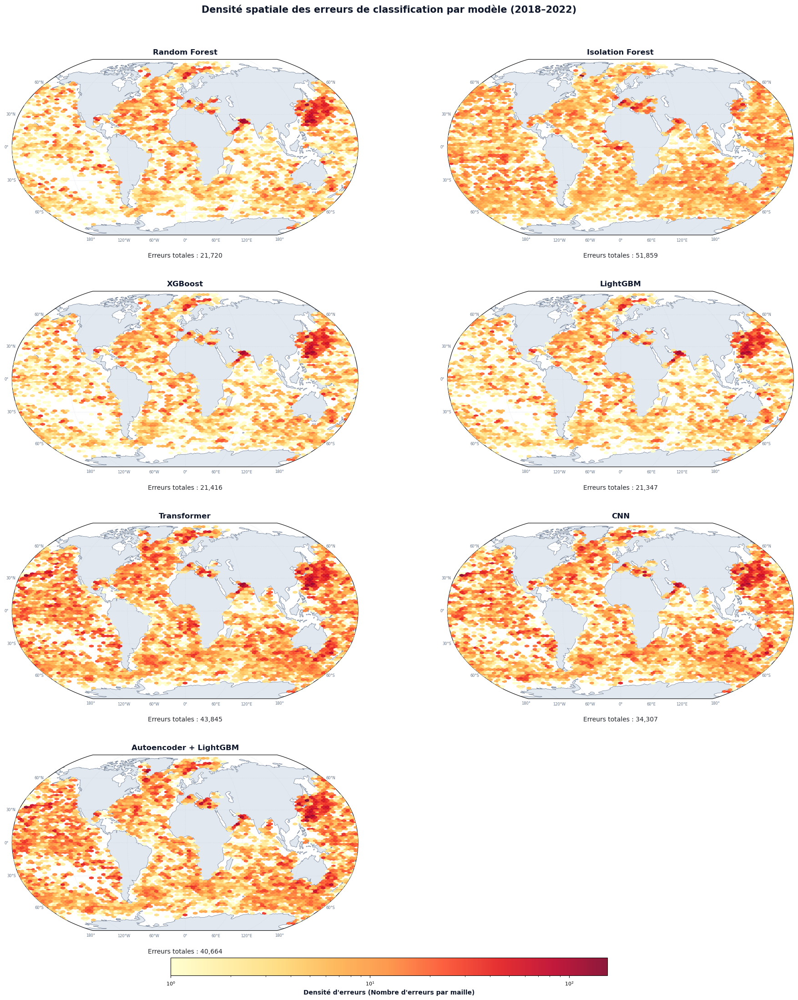

- Heatmap enregistrée : /home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/map_global_error_density_heatmap.png


In [115]:
## 7ter. Carte globale — Heatmap de Densité des Erreurs uniquement (Cartopy)

import os
import numpy as np
import pandas as pd
import joblib
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import cartopy.feature as cfeature


def get_preprocess_dir(ocean_name):
    years_dash = YEARS.replace("_", "-")
    return f"/work/drgarcia/Dataset/{ocean_name.lower()}_ocean/{years_dash}/2.preprocessed/split_time_ascA_dmodeD"


def load_model_data_ml(model_name, ocean_name):
    """Charge y_true / y_pred + coordonnées (lat/lon) pour un modèle ML."""
    model_dir = MODEL_DIR_ML.get((model_name, ocean_name))
    preprocess_dir = get_preprocess_dir(ocean_name)

    if not model_dir or not os.path.exists(model_dir):
        return None

    bundle_path = os.path.join(model_dir, BUNDLE_FILENAME)
    if not os.path.exists(bundle_path):
        return None

    bundle = joblib.load(bundle_path)
    y_true, y_pred = bundle.get(KEY_Y_TRUE), bundle.get(KEY_Y_PRED)
    if y_true is None or y_pred is None:
        return None

    results_path = os.path.join(model_dir, "test_results.parquet")
    meta_path = os.path.join(preprocess_dir, "test_meta.parquet") if os.path.exists(preprocess_dir) else None

    df_meta = pd.read_parquet(results_path) if os.path.exists(results_path) else (pd.read_parquet(meta_path) if meta_path and os.path.exists(meta_path) else None)
    if df_meta is None:
        return None

    lats = next((df_meta[c].to_numpy() for c in ["latitude", "LATITUDE", "lat", "LAT"] if c in df_meta.columns), None)
    lons = next((df_meta[c].to_numpy() for c in ["longitude", "LONGITUDE", "lon", "LON"] if c in df_meta.columns), None)

    if lats is None or lons is None:
        return None

    return {"y_true": np.squeeze(y_true), "y_pred": np.squeeze(y_pred), "lats": np.squeeze(lats), "lons": np.squeeze(lons)}


def load_model_data_dl(model_name, ocean_name):
    """Charge y_true / y_pred + coordonnées (lat/lon) pour un modèle DL."""
    try:
        y_true, y_pred, _ = LOADERS_DL[model_name](ocean_name)
    except Exception:
        return None

    df_meta = load_meta_dl(model_name, ocean_name)
    if df_meta is None:
        return None

    lats = next((df_meta[c].to_numpy() for c in ["latitude", "LATITUDE", "lat", "LAT"] if c in df_meta.columns), None)
    lons = next((df_meta[c].to_numpy() for c in ["longitude", "LONGITUDE", "lon", "LON"] if c in df_meta.columns), None)

    if lats is None or lons is None:
        return None

    return {"y_true": np.squeeze(y_true), "y_pred": np.squeeze(y_pred), "lats": np.squeeze(lats), "lons": np.squeeze(lons)}


def load_model_data_any(model_name, ocean_name):
    """Dispatch automatique entre modèles DL et ML."""
    if model_name in MODELS_DL:
        return load_model_data_dl(model_name, ocean_name)
    elif model_name in MODELS_ML:
        return load_model_data_ml(model_name, ocean_name)
    return None


def plot_error_density_heatmap(ax, lats, lons, is_error, title, gridsize=85):
    """
    Heatmap de densité des erreurs :
    - Titre principal : Uniquement le nom du modèle.
    - Mention d'erreurs : Petite annotation placée sous la carte.
    """
    ax.add_feature(cfeature.LAND, facecolor="#e2e8f0", edgecolor="none", zorder=1)
    ax.add_feature(cfeature.OCEAN, facecolor="#ffffff", zorder=0)
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5, edgecolor="#64748b", zorder=2)

    gl = ax.gridlines(draw_labels=True, crs=ccrs.PlateCarree(), color="#cbd5e1", linestyle=":", alpha=0.6)
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {"size": 6, "color": "#64748b"}
    gl.ylabel_style = {"size": 6, "color": "#64748b"}

    idx_error = np.where(is_error)[0]

    hb = ax.hexbin(
        lons[idx_error], lats[idx_error],
        gridsize=gridsize, cmap="YlOrRd", mincnt=1,
        norm=mcolors.LogNorm(),
        transform=ccrs.PlateCarree(), zorder=3, alpha=0.9
    )

    # Titre épuré (Nom du modèle seul)
    ax.set_title(title, fontsize=12, fontweight="bold", pad=8, color="#0f172a")

    # Mention du nombre d'erreurs en petite police SOUS la carte
    ax.text(
        0.5, -0.10, f"Erreurs totales : {is_error.sum():,}",
        transform=ax.transAxes, ha="center", va="top",
        fontsize=10, color="#22262C", fontweight="medium"
    )

    return hb


# --- Construction de la figure globale ---
MODELS_ALL = {**MODELS_ML, **MODELS_DL}
model_keys_all = list(MODELS_ALL.keys())
n_models = len(model_keys_all)
n_cols = 2
n_rows = int(np.ceil(n_models / n_cols))

fig, axes = plt.subplots(
    n_rows, n_cols,
    figsize=(12 * n_cols, 5.5 * n_rows),
    subplot_kw={'projection': ccrs.Robinson()}
)
axes = np.atleast_1d(axes).flatten()
last_hb = None

for i, model in enumerate(model_keys_all):
    ax = axes[i]
    nom_affichage = MODELS_ALL[model]["nom_affichage"]

    lats_list, lons_list, y_true_list, y_pred_list = [], [], [], []
    for ocean in OCEANS:
        data = load_model_data_any(model, ocean)
        if data is not None:
            lats_list.append(data["lats"])
            lons_list.append(data["lons"])
            y_true_list.append(data["y_true"])
            y_pred_list.append(data["y_pred"])

    if not y_true_list:
        ax.set_title(f"{nom_affichage}\n(données manquantes)", fontsize=11)
        ax.axis("off")
        continue

    lats = np.concatenate(lats_list)
    lons = np.concatenate(lons_list)
    y_true = np.concatenate(y_true_list)
    y_pred = np.concatenate(y_pred_list)

    is_error = (y_true != y_pred)
    last_hb = plot_error_density_heatmap(ax, lats, lons, is_error, title=nom_affichage, gridsize=85)

for j in range(n_models, len(axes)):
    axes[j].axis("off")

# Colorbar commune globale
if last_hb is not None:
    cbar_ax = fig.add_axes([0.30, 0.025, 0.40, 0.018])
    cbar = fig.colorbar(last_hb, cax=cbar_ax, orientation="horizontal")
    cbar.set_label("Densité d'erreurs (Nombre d'erreurs par maille)", fontsize=10, fontweight="bold", color="#0f172a")
    cbar.ax.tick_params(labelsize=8)

fig.suptitle(
    "Densité spatiale des erreurs de classification par modèle (2018–2022)",
    fontsize=15, fontweight="bold", y=0.995, color="#0f172a"
)

# Espacement horizontal (wspace=0.06) réduit au minimum pour maximiser l'espace des cartes
fig.subplots_adjust(wspace=0.06, hspace=0.32, top=0.94, bottom=0.07)

plot_path = os.path.join(OUTPUT_DIR, "map_global_error_density_heatmap.png")
plt.savefig(plot_path, dpi=300, bbox_inches="tight")
plt.show()

print(f"- Heatmap enregistrée : {plot_path}")

  [atlantic] Pas de clé de prédiction binaire trouvée -> reconstruite via seuil=0.4670
  [indian] Pas de clé de prédiction binaire trouvée -> reconstruite via seuil=0.3008
  [pacific] Pas de clé de prédiction binaire trouvée -> reconstruite via seuil=0.3409


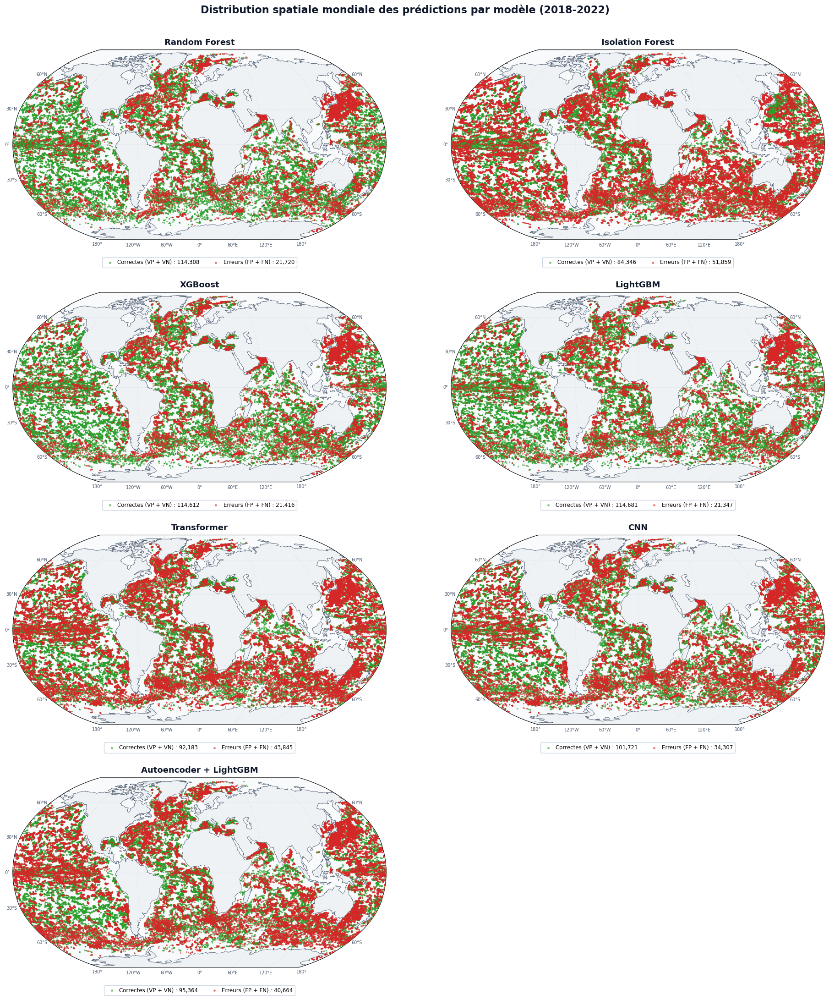

✔ Carte groupée enregistrée : /home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/map_global_overlay_grouped_errors.png


In [114]:
## 7ter. Carte globale intégrée — Tous les modèles (ML & DL) — Version Regroupée (Cartopy)

import os
import numpy as np
import pandas as pd
import joblib
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature


def get_preprocess_dir(ocean_name):
    years_dash = YEARS.replace("_", "-")
    return f"/work/drgarcia/Dataset/{ocean_name.lower()}_ocean/{years_dash}/2.preprocessed/split_time_ascA_dmodeD"


def load_model_data_ml(model_name, ocean_name):
    """Charge y_true / y_pred + coordonnées (lat/lon) pour un modèle ML (bundle .pkl)."""
    model_dir = MODEL_DIR_ML.get((model_name, ocean_name))
    preprocess_dir = get_preprocess_dir(ocean_name)

    if not model_dir or not os.path.exists(model_dir):
        print(f"  [AVERTISSEMENT] Dossier modèle introuvable: {model_dir}")
        return None

    bundle_path = os.path.join(model_dir, BUNDLE_FILENAME)
    if not os.path.exists(bundle_path):
        print(f"  [AVERTISSEMENT] Bundle introuvable: {bundle_path}")
        return None

    bundle = joblib.load(bundle_path)
    y_true = bundle.get(KEY_Y_TRUE)
    y_pred = bundle.get(KEY_Y_PRED)

    if y_true is None or y_pred is None:
        print(f"  [AVERTISSEMENT] y_true/y_pred manquants pour {model_name} - {ocean_name}")
        return None

    df_meta = None
    results_path = os.path.join(model_dir, "test_results.parquet")
    meta_path = os.path.join(preprocess_dir, "test_meta.parquet") if os.path.exists(preprocess_dir) else None

    if os.path.exists(results_path):
        df_meta = pd.read_parquet(results_path)
    elif meta_path and os.path.exists(meta_path):
        df_meta = pd.read_parquet(meta_path)

    lats, lons = None, None
    if df_meta is not None:
        for col in ["latitude", "LATITUDE", "lat", "LAT"]:
            if col in df_meta.columns:
                lats = df_meta[col].to_numpy()
                break
        for col in ["longitude", "LONGITUDE", "lon", "LON"]:
            if col in df_meta.columns:
                lons = df_meta[col].to_numpy()
                break

    if lats is None or lons is None:
        print(f"  [AVERTISSEMENT] Coordonnées introuvables pour {model_name} - {ocean_name}")
        return None

    return {
        "y_true": np.asarray(y_true).squeeze(),
        "y_pred": np.asarray(y_pred).squeeze(),
        "lats": np.asarray(lats).squeeze(),
        "lons": np.asarray(lons).squeeze(),
    }


def load_model_data_dl(model_name, ocean_name):
    """Charge y_true / y_pred + coordonnées (lat/lon) pour un modèle DL."""
    try:
        y_true, y_pred, y_proba = LOADERS_DL[model_name](ocean_name)
    except Exception as e:
        print(f"  [AVERTISSEMENT] Échec du chargement DL {model_name}-{ocean_name}: {e}")
        return None

    df_meta = load_meta_dl(model_name, ocean_name)
    if df_meta is None:
        print(f"  [AVERTISSEMENT] Métadonnées manquantes pour {model_name} - {ocean_name}")
        return None

    lats, lons = None, None
    for col in ["latitude", "LATITUDE", "lat", "LAT"]:
        if col in df_meta.columns:
            lats = df_meta[col].to_numpy()
            break
    for col in ["longitude", "LONGITUDE", "lon", "LON"]:
        if col in df_meta.columns:
            lons = df_meta[col].to_numpy()
            break

    if lats is None or lons is None:
        print(f"  [AVERTISSEMENT] Coordonnées introuvables pour {model_name} - {ocean_name}")
        return None

    return {
        "y_true": np.asarray(y_true).squeeze(),
        "y_pred": np.asarray(y_pred).squeeze(),
        "lats": np.asarray(lats).squeeze(),
        "lons": np.asarray(lons).squeeze(),
    }


def load_model_data_any(model_name, ocean_name):
    """Dispatch automatique entre modèles DL et ML."""
    if model_name in MODELS_DL:
        return load_model_data_dl(model_name, ocean_name)
    elif model_name in MODELS_ML:
        return load_model_data_ml(model_name, ocean_name)
    else:
        print(f"  [AVERTISSEMENT] Modèle inconnu: {model_name}")
        return None


def plot_overlay_on_ax_grouped(ax, lats, lons, is_correct, is_error, title, max_correct=40000):
    """
    Superposition cartographique regroupée :
    - Vert : Prédictions correctes (VP + VN / True Positives + True Negatives)
    - Rouge : Erreurs de classification (FP + FN / False Positives + False Negatives)
    - Légende horizontale positionnée SOUS le graphique pour maximiser la largeur des cartes.
    """
    ax.add_feature(cfeature.LAND, facecolor="#eef2f5", zorder=1)
    ax.add_feature(cfeature.OCEAN, facecolor="#f8fafc", zorder=0)
    ax.add_feature(cfeature.COASTLINE, linewidth=0.6, edgecolor="#475569", zorder=2)

    gl = ax.gridlines(draw_labels=True, crs=ccrs.PlateCarree(), color="#cbd5e1",
                      linestyle=":", alpha=0.6)
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {"size": 7, "color": "#475569"}
    gl.ylabel_style = {"size": 7, "color": "#475569"}

    # 1. PREDICTIONS CORRECTES (Vert: VP + VN) — Arrière-plan (zorder=3)
    idx_correct = np.where(is_correct)[0]
    if len(idx_correct) > max_correct:
        idx_correct = np.random.choice(idx_correct, max_correct, replace=False)
    ax.scatter(lons[idx_correct], lats[idx_correct], color="#2ca02c", s=2, alpha=0.5, marker="o",
               transform=ccrs.PlateCarree(), zorder=3,
               label=f"Correctes (VP + VN) : {is_correct.sum():,}")

    # 2. ERREURS (Rouge: FP + FN) — Premier plan (zorder=4)
    idx_error = np.where(is_error)[0]
    ax.scatter(lons[idx_error], lats[idx_error], color="#d62728", s=2, alpha=0.5, marker="o",
               transform=ccrs.PlateCarree(), zorder=4,
               label=f"Erreurs (FP + FN) : {is_error.sum():,}")

    ax.set_title(title, fontsize=13, fontweight="bold", pad=8, color="#0f172a")

    # Légende horizontale (ncol=2) située SOUS le graphique (bbox_to_anchor=(0.5, -0.08))
    leg = ax.legend(loc="upper center", bbox_to_anchor=(0.5, -0.08), ncol=2,
                     frameon=True, facecolor="white", framealpha=0.95,
                     fontsize=8.5, labelspacing=0.3, borderpad=0.4,
                     handletextpad=0.4, markerscale=1.8, edgecolor="#cbd5e1")
    leg.set_zorder(100)


# --- Construction de la figure combinée ---
MODELS_ALL = {**MODELS_ML, **MODELS_DL}
model_keys_all = list(MODELS_ALL.keys())
n_models = len(model_keys_all)
n_cols = 2
n_rows = int(np.ceil(n_models / n_cols))

fig, axes = plt.subplots(
    n_rows, n_cols,
    figsize=(12 * n_cols, 5.5 * n_rows),
    subplot_kw={'projection': ccrs.Robinson()}
)
axes = np.atleast_1d(axes).flatten()

for i, model in enumerate(model_keys_all):
    ax = axes[i]
    nom_affichage = MODELS_ALL[model]["nom_affichage"]

    lats_list, lons_list, y_true_list, y_pred_list = [], [], [], []
    for ocean in OCEANS:
        data = load_model_data_any(model, ocean)
        if data is not None:
            lats_list.append(data["lats"])
            lons_list.append(data["lons"])
            y_true_list.append(data["y_true"])
            y_pred_list.append(data["y_pred"])

    if not y_true_list:
        ax.set_title(f"{nom_affichage}\n(données manquantes)", fontsize=13)
        ax.axis("off")
        continue

    lats = np.concatenate(lats_list)
    lons = np.concatenate(lons_list)
    y_true = np.concatenate(y_true_list)
    y_pred = np.concatenate(y_pred_list)

    is_correct = (y_true == y_pred)
    is_error = (y_true != y_pred)

    plot_overlay_on_ax_grouped(ax, lats, lons, is_correct, is_error, title=f"{nom_affichage}")

for j in range(n_models, len(axes)):
    axes[j].axis("off")

# Titre général sans tiret avec intégration de (2018-2022)
fig.suptitle("Distribution spatiale mondiale des prédictions par modèle (2018-2022)",
             fontsize=16, fontweight="bold", y=0.995, color="#0f172a")

# Espacement horizontal (wspace=0.06) réduit au minimum pour maximiser la taille des cartes
# Espacement vertical (hspace=0.28) ajusté pour laisser l'espace nécessaire aux légendes inférieures
fig.subplots_adjust(wspace=0.06, hspace=0.28, top=0.95, bottom=0.04)

plot_path = os.path.join(OUTPUT_DIR, "map_global_overlay_grouped_errors.png")
plt.savefig(plot_path, dpi=300, bbox_inches="tight")
plt.show()

print(f"✔ Carte groupée enregistrée : {plot_path}")

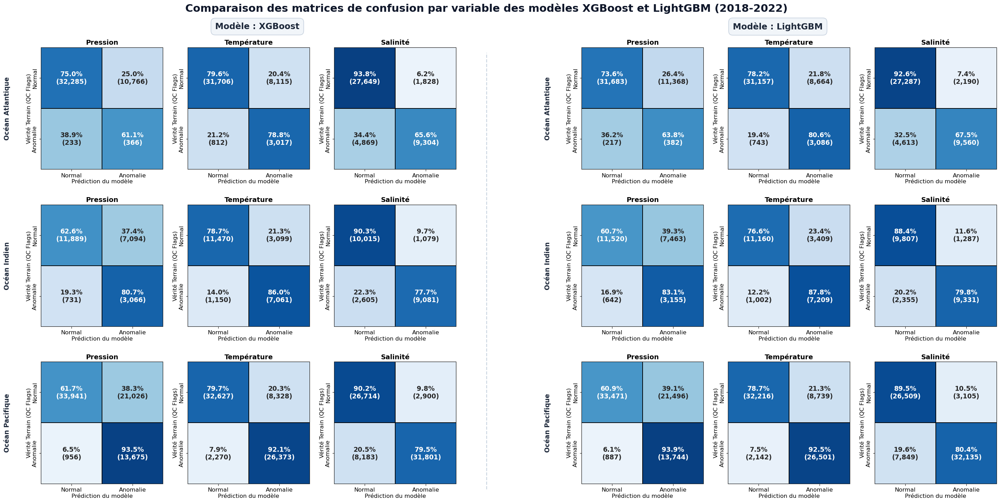


✔ Graphique enregistré : /home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/confusion_xgboost_lightgbm_by_variable_2018_2022.png


In [92]:
# ── CELDA 1: Matrices de Confusión por Variable — XGBoost vs LightGBM ────────
from matplotlib.lines import Line2D

def plot_cm_by_variable_ml_comparison(models_ml_subset, output_dir):
    """
    Grilla de 2 bloques horizontales (XGBoost | LightGBM).
    - Carteles de modelo elevados a y=0.93.
    - Límite top del subgráfico ajustado a 0.78 para evitar cualquier solapamiento.
    """
    model_list = list(models_ml_subset.keys())
    ocean_list = list(OCEANS.keys())
    n_models = len(model_list)  # 2
    n_oceans = len(ocean_list)  # 3
    n_vars = 3

    # 1. Lienzo (30x15 pulgadas)
    fig = plt.figure(figsize=(30, 15))
    
    # Título principal
    fig.suptitle(
        "Comparaison des matrices de confusion par variable des modèles XGBoost et LightGBM (2018-2022)",
        fontsize=22, fontweight="bold", y=0.975, color="#0f172a"
    )

    # 2. Carteles de los modelos elevados a y=0.93
    fig.text(
        0.28, 0.93, f"Modèle : {models_ml_subset['XG_boost']['nom_affichage']}",
        ha="center", va="center", fontsize=17.5, fontweight="bold", color="#1e293b",
        bbox=dict(boxstyle="round,pad=0.5", facecolor="#f1f5f9", edgecolor="#cbd5e1", linewidth=1.4)
    )
    fig.text(
        0.78, 0.93, f"Modèle : {models_ml_subset['LightGBM']['nom_affichage']}",
        ha="center", va="center", fontsize=17.5, fontweight="bold", color="#1e293b",
        bbox=dict(boxstyle="round,pad=0.5", facecolor="#f1f5f9", edgecolor="#cbd5e1", linewidth=1.4)
    )

    # Subfiguras por modelo
    subfigs = fig.subfigures(1, n_models, wspace=0.08)

    for r, model_key in enumerate(model_list):
        subfig = subfigs[r]

        left_m, right_m = 0.15, 0.98
        axes = subfig.subplots(n_oceans, n_vars)
        
        # 3. top=0.78 abre espacio arriba; hspace=0.10 mantiene juntas las matrices
        subfig.subplots_adjust(top=0.78, bottom=0.05, left=left_m, right=right_m, hspace=0.10, wspace=0.20)

        for c, ocean_key in enumerate(ocean_list):
            ocean_name = OCEANS_FR.get(ocean_key, ocean_key)
            ocean_formatted = ocean_name.capitalize()
            ocean_label = f"Océan {ocean_formatted}" if not ocean_formatted.startswith("Océan") else ocean_formatted

            # Carga de datos
            try:
                bundle = BUNDLES.get((model_key, ocean_key))
                if bundle is None:
                    raise KeyError("Bundle not found")
                y_pred = np.asarray(bundle[KEY_Y_PRED])
                var_truth = get_variable_truth_ml(bundle)
            except Exception:
                y_pred, var_truth = None, None

            for v_i in range(n_vars):
                ax = axes[c, v_i]

                # Nombre del océano en el margen izquierdo
                if v_i == 0:
                    ax.annotate(
                        ocean_label,
                        xy=(-0.25, 0.5), xycoords="axes fraction",
                        ha="right", va="center", rotation=90,
                        fontsize=15, fontweight="bold", color="#1e293b"
                    )

                if var_truth and y_pred is not None and v_i < len(var_truth):
                    var_code, y_true_var = list(var_truth.items())[v_i]
                    var_name_fr = VAR_TRANSLATIONS.get(var_code, var_code)

                    plot_cm_ax(ax, y_true_var, y_pred, var_name_fr)

                    # Títulos de las variables
                    ax.set_title(var_name_fr, fontsize=14, fontweight="bold", pad=6)
                    ax.tick_params(labelsize=12)
                    ax.xaxis.label.set_size(12)
                    ax.yaxis.label.set_size(12)

                    # Valores de la matriz
                    for text in ax.texts:
                        text.set_fontsize(13.5)
                        text.set_fontweight("bold")
                else:
                    ax.axis("off")
                    ax.text(0.5, 0.5, "N/D", ha="center", va="center", fontsize=12, color="red")

    # Línea vertical divisoria entre modelos
    divider_line = Line2D(
        [0.50, 0.50], [0.04, 0.88],
        transform=fig.transFigure,
        color="#cbd5e1", linewidth=1.8, linestyle="--"
    )
    fig.add_artist(divider_line)

    fig.subplots_adjust(top=0.91, bottom=0.03)

    save_path = os.path.join(output_dir, f"confusion_xgboost_lightgbm_by_variable_{YEARS}.png")
    fig.savefig(save_path, dpi=250, bbox_inches="tight", pad_inches=0.05)
    plt.show()
    plt.close(fig)
    print(f"\n✔ Graphique enregistré : {save_path}")


# Ejecución
models_ml_subset = {"XG_boost": MODELS_ML["XG_boost"], "LightGBM": MODELS_ML["LightGBM"]}
plot_cm_by_variable_ml_comparison(models_ml_subset, OUTPUT_DIR)

In [ ]:
# ── CELDA: Comparación de Métricas por Variable (ALL MODELS - ML + DL) ──────
def plot_performance_by_variable_all_models(models_ml, models_dl, output_dir):
    """
    Gráfico: 3 subplots (una por variable), cada uno muestra TNR/TPR/FPR
    para TODOS los modelos (ML + DL) promediados sobre océanos.
    """
    model_list_ml = list(models_ml.keys())
    model_list_dl = list(models_dl.keys())
    all_models = model_list_ml + model_list_dl
    all_models_dict = {**models_ml, **models_dl}
    
    ocean_list = list(OCEANS.keys())
    variables = ["TEMP", "PRES", "PSAL"]
    metrics = ["TNR", "TPR", "FPR"]
    
    # Colores por modelo
    model_colors = {k: all_models_dict[k].get("color", "#1f77b4") for k in all_models}
    
    # Determinar si es ML o DL para marcar en la leyenda
    model_types = {k: "ML" for k in model_list_ml}
    model_types.update({k: "DL" for k in model_list_dl})
    
    fig, axes = plt.subplots(1, 3, figsize=(17, 5.5))
    fig.suptitle(
        f"Performance par Variable Physique — Tous les Modèles (ML + DL)\n(Moyennes sur tous les océans)",
        fontsize=14, fontweight="bold", y=1.00
    )
    
    # Agrupar datos por variable
    results = {var: {model: {m: [] for m in metrics} for model in all_models} for var in variables}
    
    print("▶ Calcul des métriques par variable et modèle (ML + DL)...")
    
    # ─── LOAD ML ───
    for model_key in model_list_ml:
        for ocean_key in ocean_list:
            try:
                bundle = BUNDLES.get((model_key, ocean_key))
                if bundle is None:
                    continue
                    
                y_pred = np.asarray(bundle[KEY_Y_PRED])
                var_truth = get_variable_truth_ml(bundle)
                
                for var_code, y_true_var in var_truth.items():
                    var_name = var_code.upper()
                    if var_name in variables:
                        m_dict = compute_metrics_from_cm(y_true_var, y_pred)
                        for metric_name in metrics:
                            results[var_name][model_key][metric_name].append(m_dict[metric_name])
            except Exception as e:
                print(f"  ✗ ML | {model_key} / {ocean_key}: {e}")
                continue
    
    # ─── LOAD DL ───
    for model_key in model_list_dl:
        for ocean_key in ocean_list:
            try:
                _, y_pred, _ = LOADERS_DL[model_key](ocean_key)
                meta = load_meta_dl(model_key, ocean_key)
                
                if meta is not None:
                    variable_cols = [col for col in meta.columns 
                                    if "is_bad" in col.lower() and col.lower() != "is_bad"]
                    var_truth = {
                        col.replace("_is_bad", "").replace("is_bad_", "").upper(): meta[col].values
                        for col in variable_cols
                    }
                    
                    for var_name, y_true_var in var_truth.items():
                        if var_name in variables:
                            m_dict = compute_metrics_from_cm(y_true_var, y_pred)
                            for metric_name in metrics:
                                results[var_name][model_key][metric_name].append(m_dict[metric_name])
            except Exception as e:
                print(f"  ✗ DL | {model_key} / {ocean_key}: {e}")
                continue
    
    # ─── GRAFICAR ───
    x = np.arange(len(metrics))
    n_models = len(all_models)
    bar_width = 0.8 / n_models
    
    for ax_idx, var_name in enumerate(variables):
        ax = axes[ax_idx]
        
        for m_idx, model_key in enumerate(all_models):
            means = [np.mean(results[var_name][model_key][m]) if results[var_name][model_key][m] else 0 
                    for m in metrics]
            stds = [np.std(results[var_name][model_key][m]) if results[var_name][model_key][m] else 0 
                   for m in metrics]
            
            offset = (m_idx - (n_models - 1) / 2) * bar_width
            label = all_models_dict[model_key]["nom_affichage"]
            
            bars = ax.bar(x + offset, means, bar_width, 
                         label=label,
                         color=model_colors[model_key], alpha=0.85, 
                         edgecolor="black", linewidth=0.6, yerr=stds, capsize=2.5)
            ax.bar_label(bars, fmt="{:.1%}", fontsize=7, padding=0.5)
        
        ax.set_ylabel("Score", fontsize=10, fontweight="bold")
        ax.set_title(f"{VAR_TRANSLATIONS.get(var_name, var_name)}", 
                    fontsize=12, fontweight="bold")
        ax.set_xticks(x)
        ax.set_xticklabels(metrics, fontsize=9)
        ax.set_ylim([0, 1.20])
        ax.grid(alpha=0.3, axis="y", linestyle="--")
        ax.legend(fontsize=7.5, loc="upper right", ncol=2)
    
    # Leyenda de métricas y separación ML/DL
    legend_text = ("TNR = Taux de Vrais Négatifs (Spécificité) | "
                  "TPR = Taux de Vrais Positifs (Rappel) | "
                  "FPR = Taux de Faux Positifs")
    
    fig.text(0.5, 0.01,
            legend_text,
            ha="center", fontsize=9, style="italic",
            bbox=dict(boxstyle="round", facecolor="lightyellow", alpha=0.5))
    
    plt.tight_layout(rect=[0, 0.06, 1, 0.96])
    save_path = os.path.join(output_dir, f"performance_by_variable_all_models_{YEARS}.png")
    fig.savefig(save_path, dpi=150, bbox_inches="tight")
    plt.show()
    plt.close(fig)
    print(f"\n✔ Graphique enregistré : {save_path}")

# Ejecución
plot_performance_by_variable_all_models(MODELS_ML, MODELS_DL, OUTPUT_DIR)

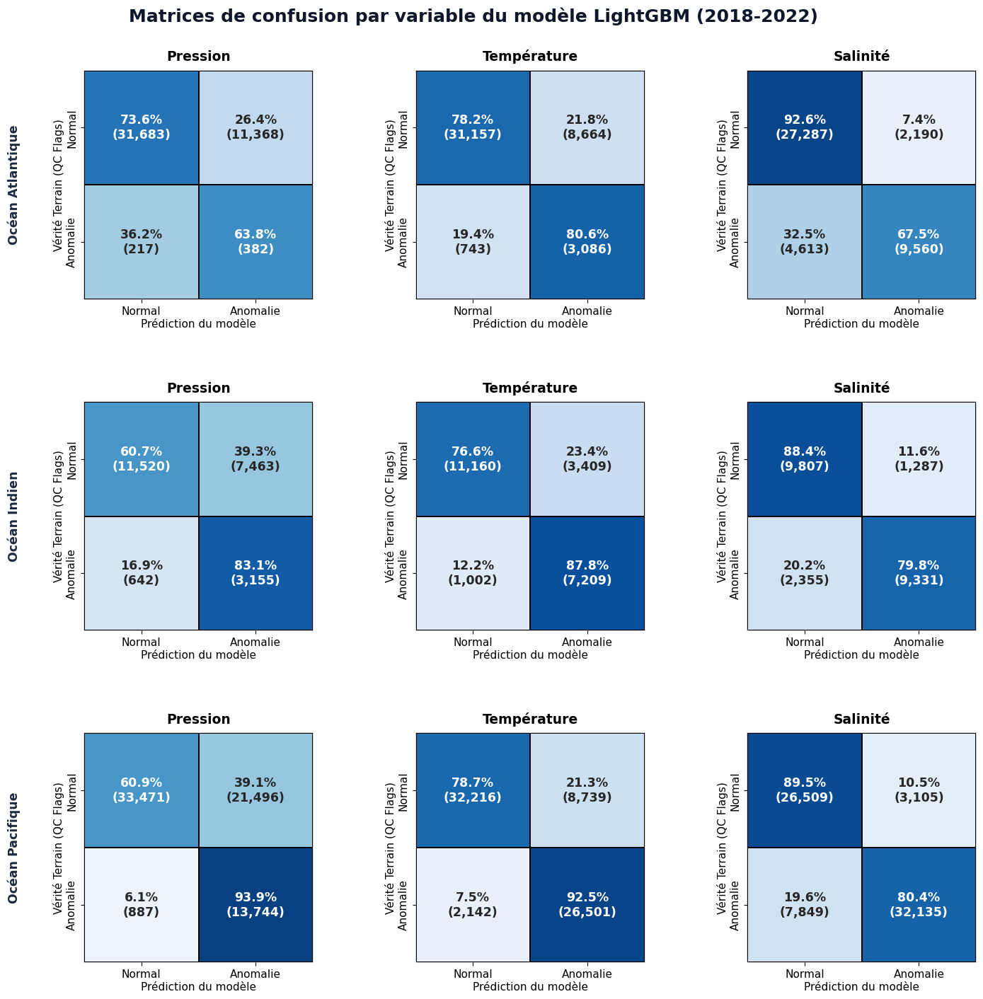


- Graphique enregistré : /home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/confusion_LightGBM_by_variable_2018-2022.png


In [98]:
# ── CELDA: Matrices de Confusión por Variable — Un Solo Modelo (LightGBM) ──────
import os
import numpy as np
import matplotlib.pyplot as plt

def plot_cm_by_variable_single_model(model_key, model_info, output_dir):
    
    ocean_list = list(OCEANS.keys())
    n_oceans = len(ocean_list)  # 3
    n_vars = 3
    nom_affichage = model_info["nom_affichage"]

    # Format del rango de años (reemplaza guiones bajos si los hubiese)
    years_formatted = str(YEARS).replace("_", "-")

    # 1. Lienzo optimizado (16x15 pulgadas)
    fig, axes = plt.subplots(n_oceans, n_vars, figsize=(16, 15))

    # Título principal sin guiones
    fig.suptitle(
        f"Matrices de confusion par variable du modèle {nom_affichage} ({years_formatted})",
        fontsize=18, fontweight="bold", y=0.96, color="#0f172a"
    )

    # 2. hspace=0.45 otorga el espacio vertical necesario para que no haya solapamiento
    plt.subplots_adjust(top=0.90, bottom=0.06, left=0.14, right=0.96, hspace=0.45, wspace=0.25)

    for c, ocean_key in enumerate(ocean_list):
        ocean_name = OCEANS_FR.get(ocean_key, ocean_key)
        ocean_formatted = ocean_name.capitalize()
        ocean_label = f"Océan {ocean_formatted}" if not ocean_formatted.startswith("Océan") else ocean_formatted

        # Carga de datos
        try:
            bundle = BUNDLES.get((model_key, ocean_key))
            if bundle is None:
                raise KeyError("Bundle not found")
            y_pred = np.asarray(bundle[KEY_Y_PRED])
            var_truth = get_variable_truth_ml(bundle)
        except Exception:
            y_pred, var_truth = None, None

        for v_i in range(n_vars):
            ax = axes[c, v_i]

            # Nombre del océano en el margen izquierdo
            if v_i == 0:
                ax.annotate(
                    ocean_label,
                    xy=(-0.28, 0.5), xycoords="axes fraction",
                    ha="right", va="center", rotation=90,
                    fontsize=14, fontweight="bold", color="#1e293b"
                )

            if var_truth and y_pred is not None and v_i < len(var_truth):
                var_code, y_true_var = list(var_truth.items())[v_i]
                var_name_fr = VAR_TRANSLATIONS.get(var_code, var_code)

                plot_cm_ax(ax, y_true_var, y_pred, var_name_fr)

                # Títulos de las variables con margen de separación suficiente
                ax.set_title(var_name_fr, fontsize=13.5, fontweight="bold", pad=10)
                ax.tick_params(labelsize=11)
                ax.xaxis.label.set_size(11)
                ax.yaxis.label.set_size(11)

                # Formato numérico en las celdas
                for text in ax.texts:
                    text.set_fontsize(12.5)
                    text.set_fontweight("bold")
            else:
                ax.axis("off")
                ax.text(0.5, 0.5, "N/D", ha="center", va="center", fontsize=12, color="red")

    save_path = os.path.join(output_dir, f"confusion_{model_key}_by_variable_{years_formatted}.png")
    fig.savefig(save_path, dpi=250, bbox_inches="tight", pad_inches=0.05)
    plt.show()
    plt.close(fig)
    print(f"\n- Graphique enregistré : {save_path}")


# Ejecución para LightGBM
plot_cm_by_variable_single_model("LightGBM", MODELS_ML["LightGBM"], OUTPUT_DIR)

▶ Calcul des métriques par variable et modèle (ML + DL)...
  [atlantic] Pas de clé de prédiction binaire trouvée -> reconstruite via seuil=0.4670
  [indian] Pas de clé de prédiction binaire trouvée -> reconstruite via seuil=0.3008
  [pacific] Pas de clé de prédiction binaire trouvée -> reconstruite via seuil=0.3409


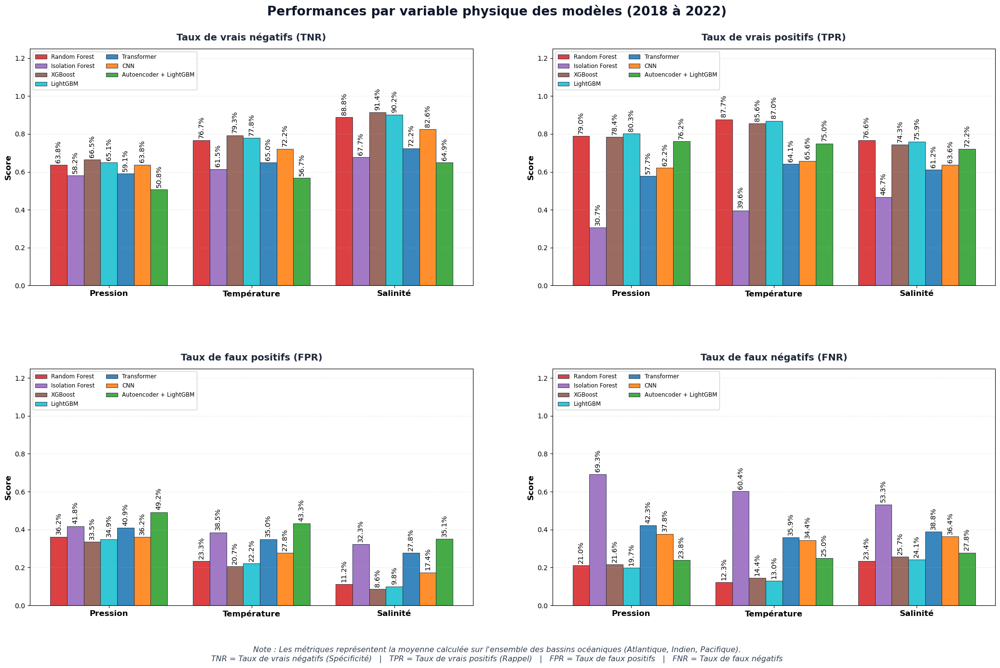


✔ Graphique enregistré : /home/drgarcia/Argo_ml_code_clean/4.Plots/comparison_all_models/2018_2022/performance_by_variable_all_models_2x2_2018_2022.png


In [103]:
# ── CELDA: Comparación de Métricas por Variable (ALL MODELS - ML + DL - Grid 2x2) ──────
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

def compute_metrics_from_cm(y_true, y_pred):
    """
    Calcula TNR, TPR, FPR y FNR a partir de los datos reales y predichos.
    """
    cm = confusion_matrix(y_true, y_pred, labels=[0, 1])
    tn, fp, fn, tp = cm.ravel()
    
    tnr = tn / (tn + fp) if (tn + fp) > 0 else 0.0
    tpr = tp / (tp + fn) if (tp + fn) > 0 else 0.0
    fpr = fp / (fp + tn) if (fp + tn) > 0 else 0.0
    fnr = fn / (fn + tp) if (fn + tp) > 0 else 0.0
    
    return {"TNR": tnr, "TPR": tpr, "FPR": fpr, "FNR": fnr}


def plot_performance_by_variable_all_models_2x2(models_ml, models_dl, output_dir):
    """
    Gráfico 2x2 organizado por Métricas (TNR, TPR, FPR, FNR).
    - Porcentajes sobre las barras con tamaño más grande (10.5pt) y texto normal (sin negrita).
    - Leyendas ubicadas a la izquierda en los 4 subplots.
    - Título sin guiones y nota al pie ampliada.
    """
    model_list_ml = list(models_ml.keys())
    model_list_dl = list(models_dl.keys())
    all_models = model_list_ml + model_list_dl
    all_models_dict = {**models_ml, **models_dl}
    
    ocean_list = list(OCEANS.keys())
    variables = ["PRES", "TEMP", "PSAL"]
    var_labels = [VAR_TRANSLATIONS.get(v, v) for v in variables]
    years_formatted = str(YEARS).replace("_", " à ")
    
    metrics_info = [
        ("TNR", "Taux de vrais négatifs (TNR)"),
        ("TPR", "Taux de vrais positifs (TPR)"),
        ("FPR", "Taux de faux positifs (FPR)"),
        ("FNR", "Taux de faux négatifs (FNR)")
    ]
    
    model_colors = {k: all_models_dict[k].get("color", "#1f77b4") for k in all_models}
    
    # Estructura de resultados
    results = {
        var: {model: {m[0]: [] for m in metrics_info} for model in all_models} 
        for var in variables
    }
    
    print("▶ Calcul des métriques par variable et modèle (ML + DL)...")
    
    # ─── CARGA ML ───
    for model_key in model_list_ml:
        for ocean_key in ocean_list:
            try:
                bundle = BUNDLES.get((model_key, ocean_key))
                if bundle is None:
                    continue
                    
                y_pred = np.asarray(bundle[KEY_Y_PRED])
                var_truth = get_variable_truth_ml(bundle)
                
                for var_code, y_true_var in var_truth.items():
                    var_name = var_code.upper()
                    if var_name in variables:
                        m_dict = compute_metrics_from_cm(y_true_var, y_pred)
                        
                        results[var_name][model_key]["TNR"].append(m_dict["TNR"])
                        results[var_name][model_key]["TPR"].append(m_dict["TPR"])
                        results[var_name][model_key]["FPR"].append(m_dict["FPR"])
                        results[var_name][model_key]["FNR"].append(m_dict["FNR"])
            except Exception as e:
                print(f"  ✗ ML | {model_key} / {ocean_key}: {e}")
                continue
    
    # ─── CARGA DL ───
    for model_key in model_list_dl:
        for ocean_key in ocean_list:
            try:
                _, y_pred, _ = LOADERS_DL[model_key](ocean_key)
                meta = load_meta_dl(model_key, ocean_key)
                
                if meta is not None:
                    variable_cols = [col for col in meta.columns 
                                    if "is_bad" in col.lower() and col.lower() != "is_bad"]
                    var_truth = {
                        col.replace("_is_bad", "").replace("is_bad_", "").upper(): meta[col].values
                        for col in variable_cols
                    }
                    
                    for var_name, y_true_var in var_truth.items():
                        if var_name in variables:
                            m_dict = compute_metrics_from_cm(y_true_var, y_pred)
                            
                            results[var_name][model_key]["TNR"].append(m_dict["TNR"])
                            results[var_name][model_key]["TPR"].append(m_dict["TPR"])
                            results[var_name][model_key]["FPR"].append(m_dict["FPR"])
                            results[var_name][model_key]["FNR"].append(m_dict["FNR"])
            except Exception as e:
                print(f"  ✗ DL | {model_key} / {ocean_key}: {e}")
                continue
    
    # ─── CONFIGURACIÓN DE FIGURA (2x2) ───
    fig, axes = plt.subplots(2, 2, figsize=(22, 14))
    axes_flat = axes.flatten()
    
    # Título principal sin guiones
    fig.suptitle(
        f"Performances par variable physique des modèles ({years_formatted})",
        fontsize=19, fontweight="bold", y=0.975, color="#0f172a"
    )
    
    x = np.arange(len(variables))
    n_models = len(all_models)
    bar_width = 0.82 / n_models
    
    for idx, (m_code, m_title) in enumerate(metrics_info):
        ax = axes_flat[idx]
        
        for m_idx, model_key in enumerate(all_models):
            means = [
                np.mean(results[var_name][model_key][m_code]) 
                if results[var_name][model_key][m_code] else 0 
                for var_name in variables
            ]
            
            offset = (m_idx - (n_models - 1) / 2) * bar_width
            label = all_models_dict[model_key]["nom_affichage"]
            
            bars = ax.bar(
                x + offset, means, bar_width, 
                label=label,
                color=model_colors[model_key], alpha=0.88, 
                edgecolor="#1e293b", linewidth=0.7
            )
            
            # Números más grandes (fontsize=10.5) y sin negrita (fontweight="normal")
            ax.bar_label(
                bars, fmt="{:.1%}", fontsize=10.5, fontweight="normal", 
                padding=3, rotation=90
            )
        
        ax.set_title(m_title, fontsize=14, fontweight="bold", color="#1e293b", pad=12)
        ax.set_ylabel("Score", fontsize=12, fontweight="bold")
        ax.set_xticks(x)
        ax.set_xticklabels(var_labels, fontsize=12, fontweight="bold")
        ax.set_ylim([0, 1.25])
        ax.grid(alpha=0.25, axis="y", linestyle="--")
        
        # Leyendas en la izquierda para los 4 subplots
        ax.legend(fontsize=8.5, loc="upper left", ncol=2, framealpha=0.9)

    # ─── NOTA AL PIE (TEXTO AMPLIADO, SIN BORDE NI FONDO) ───
    note_text = (
        "Note : Les métriques représentent la moyenne calculée sur l'ensemble des bassins océaniques "
        "(Atlantique, Indien, Pacifique).\n"
        "TNR = Taux de vrais négatifs (Spécificité)   |   TPR = Taux de vrais positifs (Rappel)   |   "
        "FPR = Taux de faux positifs   |   FNR = Taux de faux négatifs"
    )
    
    fig.text(
        0.5, 0.012,
        note_text,
        ha="center", va="center", fontsize=11.5, style="italic", color="#334155"
    )
    
    plt.subplots_adjust(top=0.91, bottom=0.085, left=0.06, right=0.97, hspace=0.35, wspace=0.18)
    
    save_path = os.path.join(output_dir, f"performance_by_variable_all_models_2x2_{YEARS}.png")
    fig.savefig(save_path, dpi=250, bbox_inches="tight", pad_inches=0.05)
    plt.show()
    plt.close(fig)
    print(f"\n✔ Graphique enregistré : {save_path}")


# Ejecución
plot_performance_by_variable_all_models_2x2(MODELS_ML, MODELS_DL, OUTPUT_DIR)